<a href="https://colab.research.google.com/github/divyaprabha123/Evaluation-of-handwritten-equations/blob/master/YOLO_based_line_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import Dependencies

In [1]:
from keras import backend as K
import keras
import cv2
# from Utils import *
from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint
from keras.optimizers import Adam
from keras.layers import *
from keras.applications import MobileNetV2
import tensorflow as tf
import numpy as np
from keras.models import Model
from keras.models import model_from_json
import matplotlib.pyplot as plt
import os
import glob
import numpy as np
import pandas as pd
import cv2
import os
import tqdm
from scipy.io import loadmat
import matplotlib.pyplot as plt

import tensorflow as tf


Using TensorFlow backend.


In [2]:
keras.__version__

'2.2.5'

In [0]:

image_path = '/content/drive/My Drive/object_detect/images'
gt_path = '/content/drive/My Drive/object_detect/images'
train_image_paths = []
train_gt_paths = []



## Defining utils function

In [0]:

def decode_to_boxes(output , ht , wd):
    #output : (x,x,1,5)
    #x,y,h,w

    img_ht = ht
    img_wd = wd
    threshold = 0.5
    grid_h,grid_w = output.shape[:2]
    final_boxes = []
    scores = []

    for i in range(grid_h):
        for j in range(grid_w):
            if output[i,j,0,0] > threshold:

                temp = output[i,j,0,1:5]
                
                x_unit = ((j + (temp[0]))/grid_w)*img_wd
                y_unit = ((i + (temp[1]))/grid_h)*img_ht
                width = temp[2]*img_wd*1.3
                height = temp[3]*img_ht*1.3
                
                final_boxes.append([x_unit - width/2,y_unit - height/2 ,x_unit + width/2,y_unit + height/2])
                scores.append(output[i,j,0,0])
    
    return final_boxes,scores



def iou(box1,box2):

    x1 = max(box1[0],box2[0])
    x2 = min(box1[2],box2[2])
    y1 = max(box1[1] ,box2[1])
    y2 = min(box1[3],box2[3])
    
    inter = (x2 - x1)*(y2 - y1)
    
    area1 = (box1[2] - box1[0])*(box1[3] - box1[1])
    area2 = (box2[2] - box2[0])*(box2[3] - box2[1])
    fin_area = area1 + area2 - inter
        
    iou = inter/fin_area
    
    return iou



def non_max(boxes , scores , iou_num):

    scores_sort = scores.argsort().tolist()
    keep = []
    
    while(len(scores_sort)):
        
        index = scores_sort.pop()
        keep.append(index)
        
        if(len(scores_sort) == 0):
            break
    
        iou_res = []
    
        for i in scores_sort:
            iou_res.append(iou(boxes[index] , boxes[i]))
        
        iou_res = np.array(iou_res)
        filtered_indexes = set((iou_res > iou_num).nonzero()[0])

        scores_sort = [v for (i,v) in enumerate(scores_sort) if i not in filtered_indexes]
    
    final = []
    
    for i in keep:
        final.append(boxes[i])
    
    return final


def decode(output , ht , wd , iou):
    
    
    boxes , scores = decode_to_boxes(output ,ht ,wd)
    
    
    boxes = non_max(boxes,np.array(scores) , iou)
    
    
    return boxes
    



In [0]:
# Get the training images path
train_gt_path = glob.glob(os.path.join(image_path, "*.txt"))
train_image_paths = glob.glob(os.path.join(image_path, "*.jpg"))

In [0]:
train_gt_paths = train_gt_path

## Create training dataset

  0%|          | 0/500 [00:00<?, ?it/s]

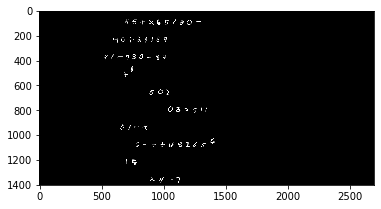

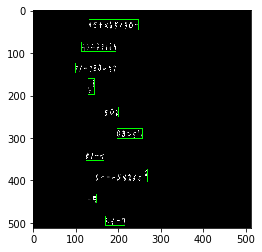

  0%|          | 1/500 [00:01<14:57,  1.80s/it]

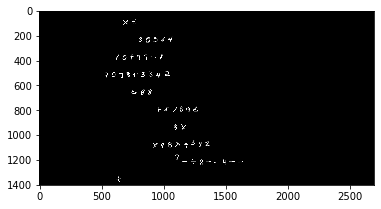

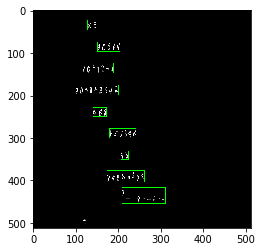

  0%|          | 2/500 [00:03<14:57,  1.80s/it]

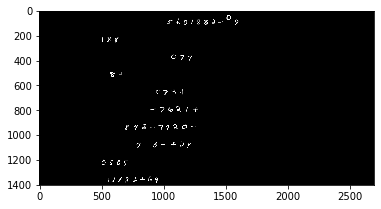

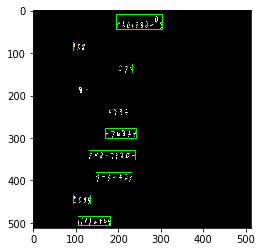

  1%|          | 3/500 [00:05<15:31,  1.87s/it]

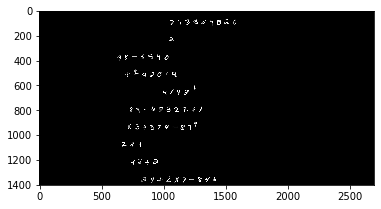

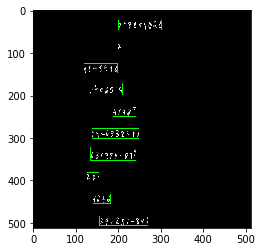

  1%|          | 4/500 [00:07<15:56,  1.93s/it]

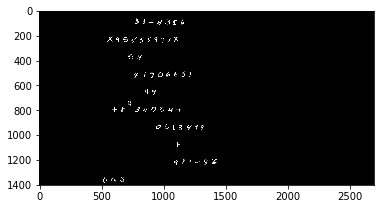

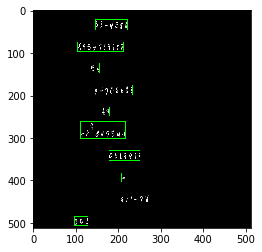

  1%|          | 5/500 [00:09<16:06,  1.95s/it]

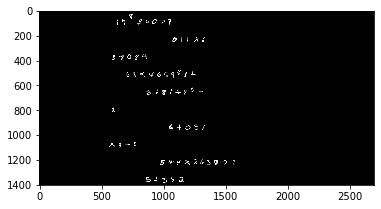

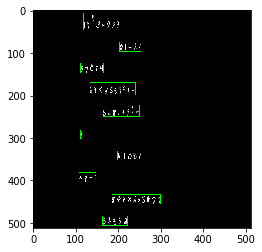

  1%|          | 6/500 [00:11<15:40,  1.90s/it]

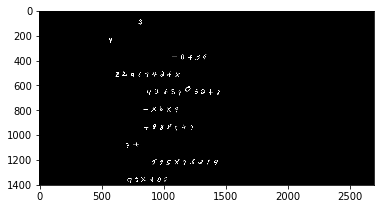

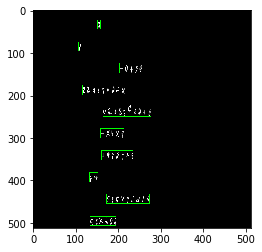

  1%|▏         | 7/500 [00:13<15:25,  1.88s/it]

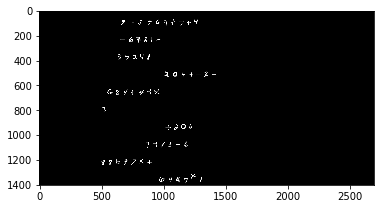

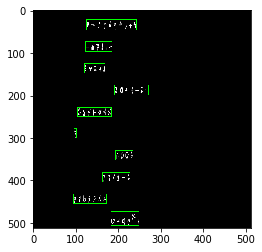

  2%|▏         | 8/500 [00:14<14:50,  1.81s/it]

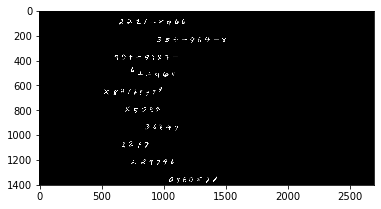

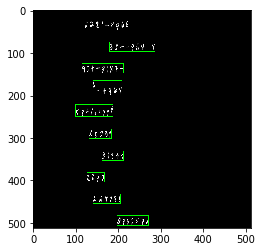

  2%|▏         | 9/500 [00:16<14:39,  1.79s/it]

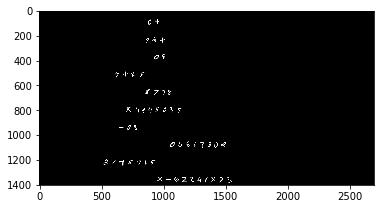

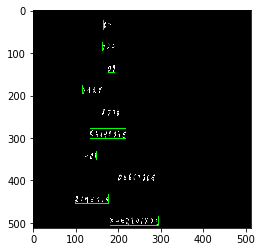

  2%|▏         | 10/500 [00:18<14:41,  1.80s/it]

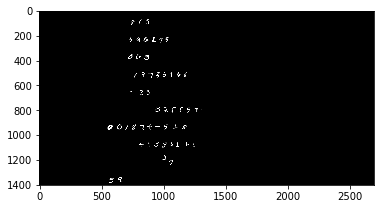

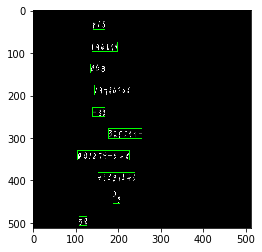

  2%|▏         | 11/500 [00:20<14:16,  1.75s/it]

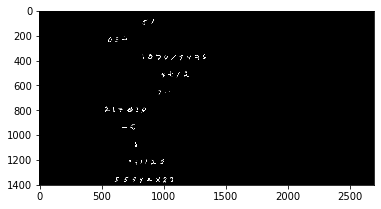

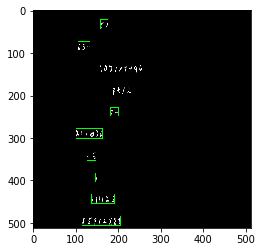

  2%|▏         | 12/500 [00:21<13:54,  1.71s/it]

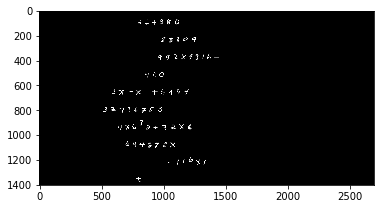

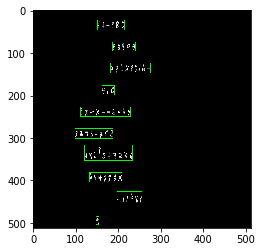

  3%|▎         | 13/500 [00:23<13:55,  1.72s/it]

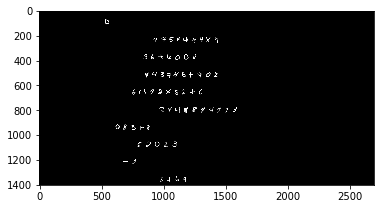

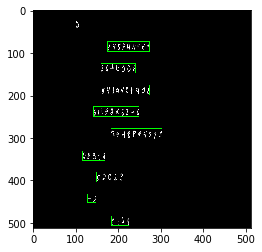

  3%|▎         | 14/500 [00:25<13:35,  1.68s/it]

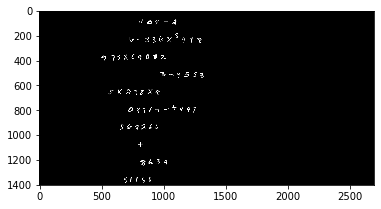

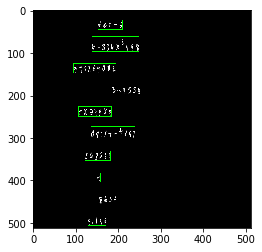

  3%|▎         | 15/500 [00:26<13:59,  1.73s/it]

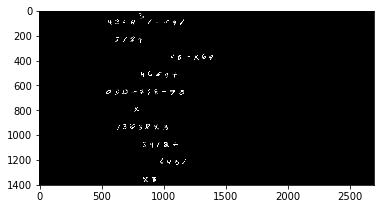

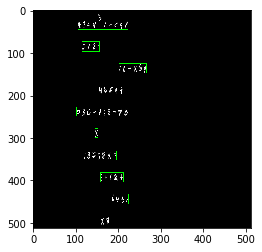

  3%|▎         | 16/500 [00:28<13:34,  1.68s/it]

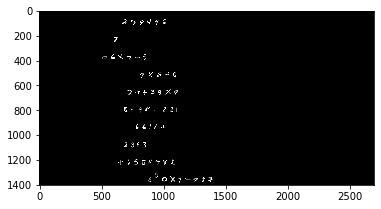

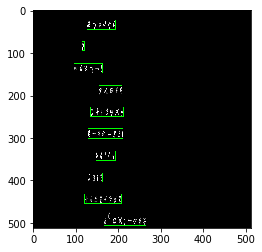

  3%|▎         | 17/500 [00:30<14:17,  1.77s/it]

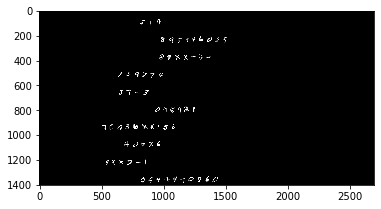

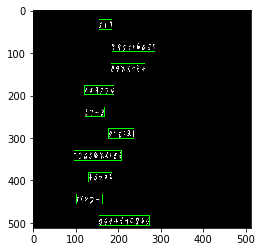

  4%|▎         | 18/500 [00:32<13:47,  1.72s/it]

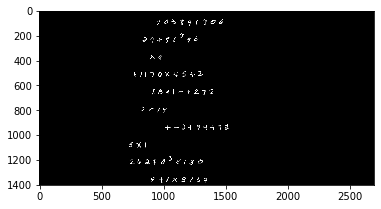

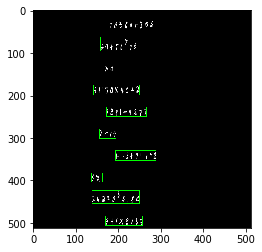

  4%|▍         | 19/500 [00:33<13:23,  1.67s/it]

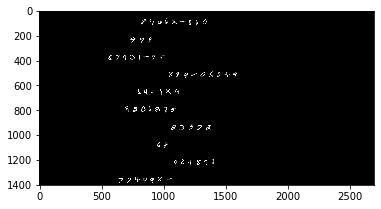

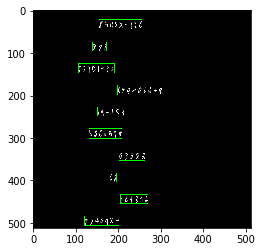

  4%|▍         | 20/500 [00:35<13:34,  1.70s/it]

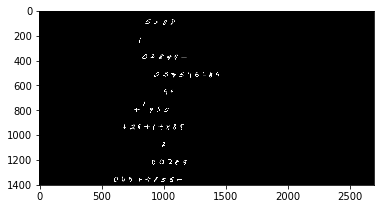

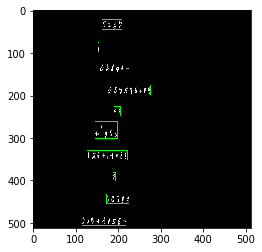

  4%|▍         | 21/500 [00:37<13:18,  1.67s/it]

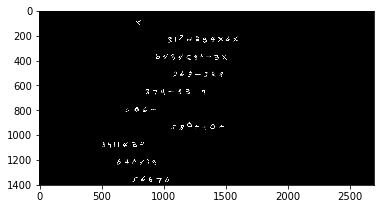

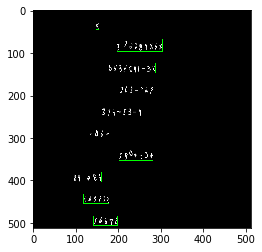

  4%|▍         | 22/500 [00:38<13:09,  1.65s/it]

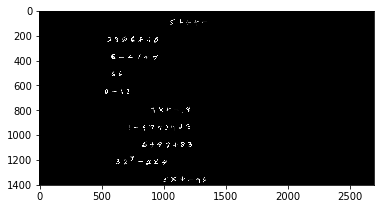

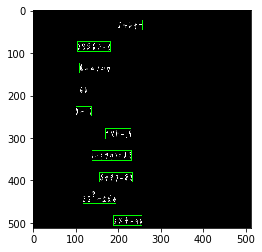

  5%|▍         | 23/500 [00:41<15:32,  1.95s/it]

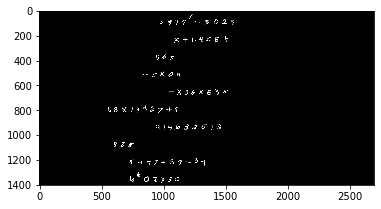

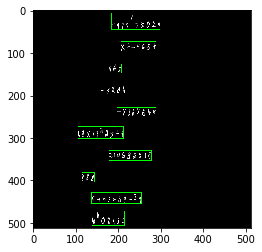

  5%|▍         | 24/500 [00:43<15:08,  1.91s/it]

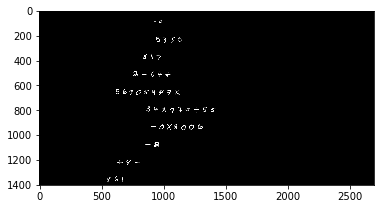

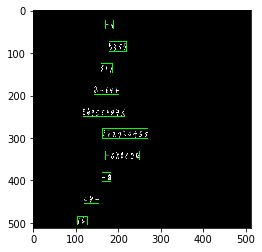

  5%|▌         | 25/500 [00:44<14:22,  1.82s/it]

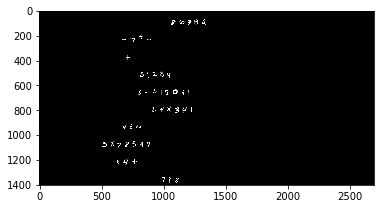

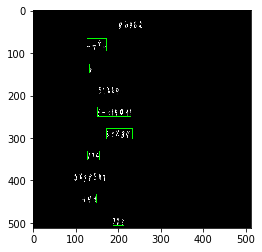

  5%|▌         | 26/500 [00:46<14:02,  1.78s/it]

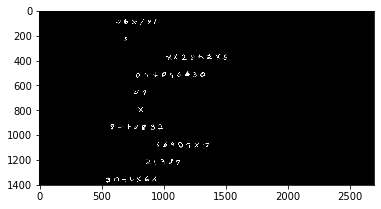

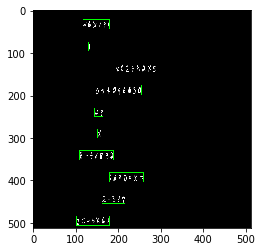

  5%|▌         | 27/500 [00:48<13:46,  1.75s/it]

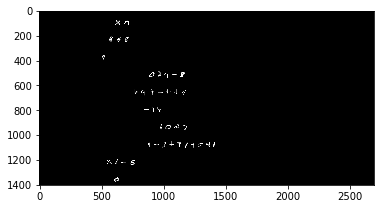

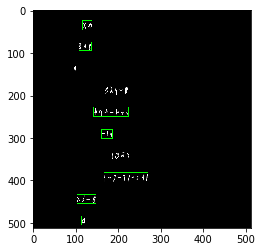

  6%|▌         | 28/500 [00:49<13:44,  1.75s/it]

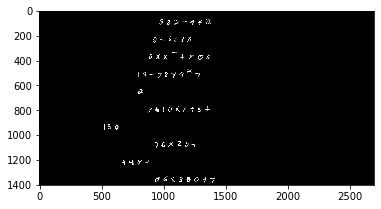

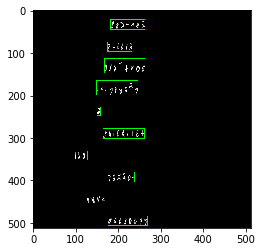

  6%|▌         | 29/500 [00:51<13:36,  1.73s/it]

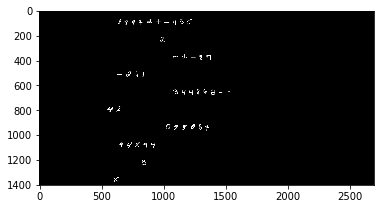

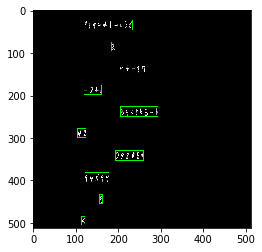

  6%|▌         | 30/500 [00:53<13:51,  1.77s/it]

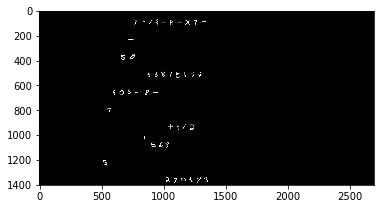

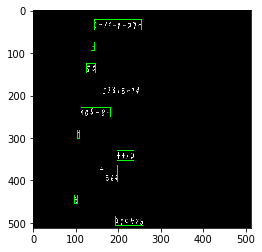

  6%|▌         | 31/500 [00:55<13:33,  1.73s/it]

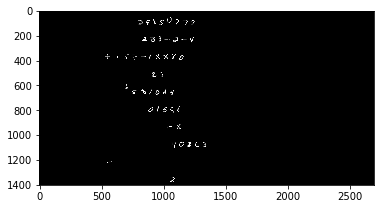

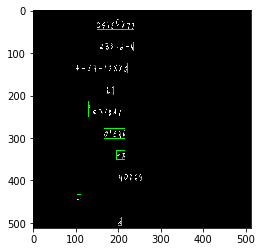

  6%|▋         | 32/500 [00:56<13:23,  1.72s/it]

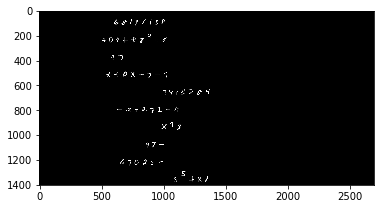

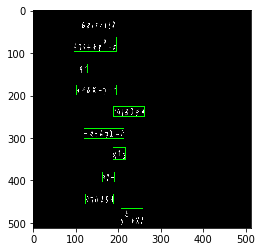

  7%|▋         | 33/500 [00:58<13:16,  1.71s/it]

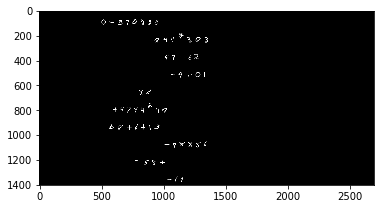

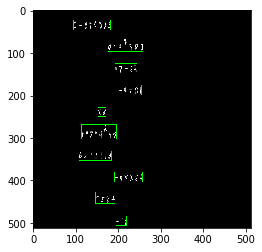

  7%|▋         | 34/500 [00:59<13:01,  1.68s/it]

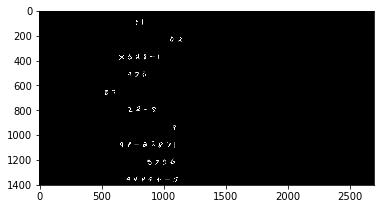

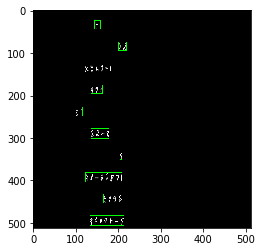

  7%|▋         | 35/500 [01:01<12:51,  1.66s/it]

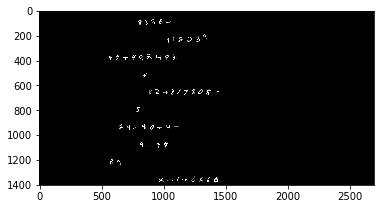

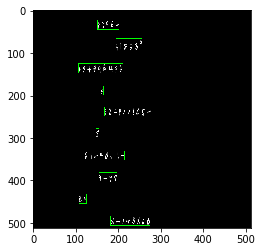

  7%|▋         | 36/500 [01:03<13:20,  1.72s/it]

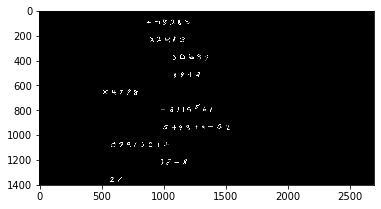

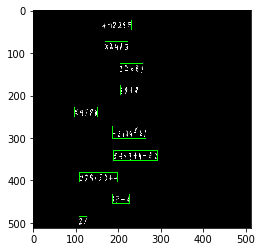

  7%|▋         | 37/500 [01:05<13:28,  1.75s/it]

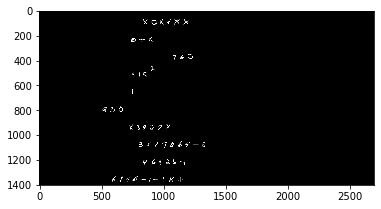

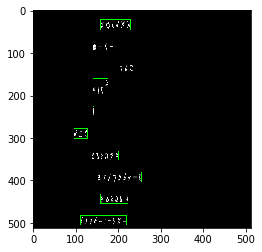

  8%|▊         | 38/500 [01:07<13:28,  1.75s/it]

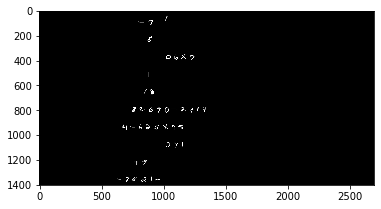

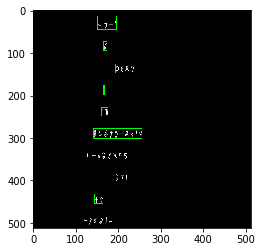

  8%|▊         | 39/500 [01:13<23:11,  3.02s/it]

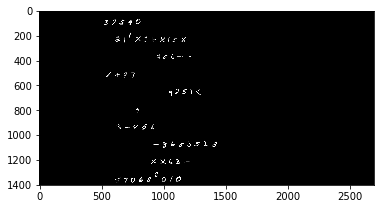

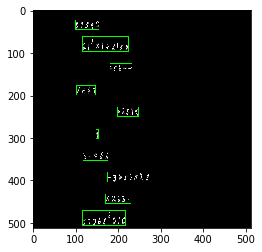

  8%|▊         | 40/500 [01:14<19:59,  2.61s/it]

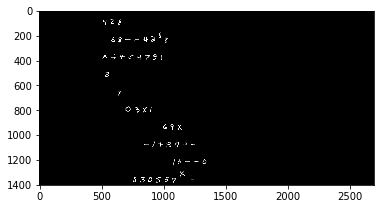

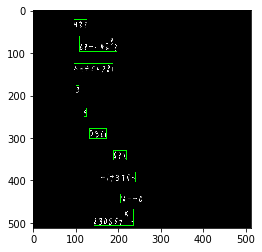

  8%|▊         | 41/500 [01:16<17:46,  2.32s/it]

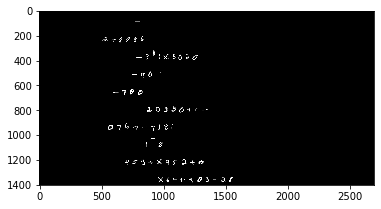

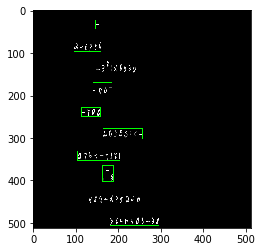

  8%|▊         | 42/500 [01:17<16:04,  2.11s/it]

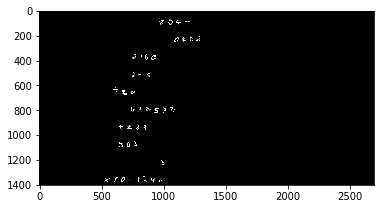

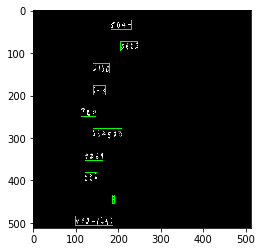

  9%|▊         | 43/500 [01:19<15:03,  1.98s/it]

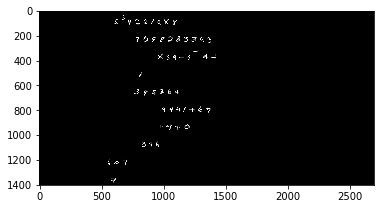

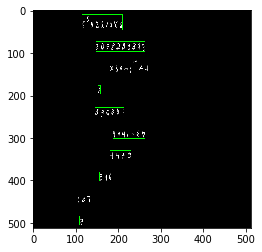

  9%|▉         | 44/500 [01:21<14:15,  1.88s/it]

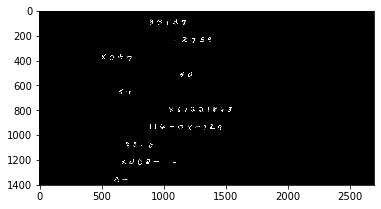

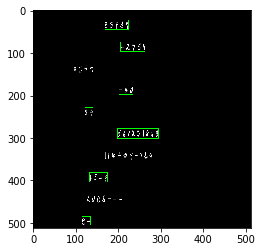

  9%|▉         | 45/500 [01:22<13:56,  1.84s/it]

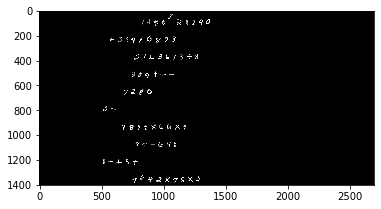

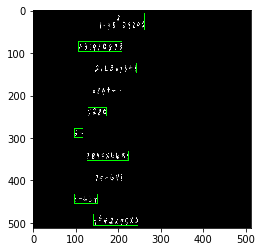

  9%|▉         | 46/500 [01:24<13:21,  1.77s/it]

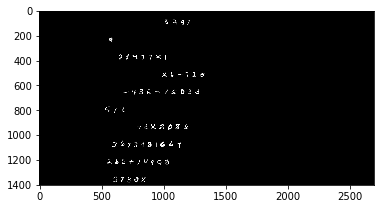

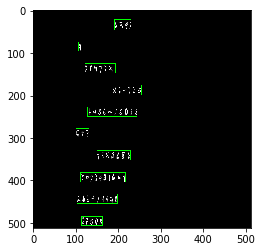

  9%|▉         | 47/500 [01:26<13:04,  1.73s/it]

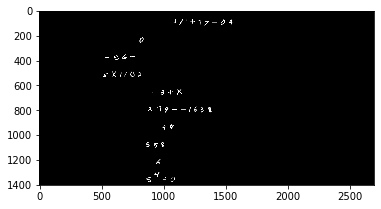

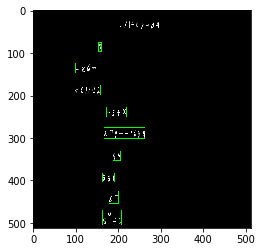

 10%|▉         | 48/500 [01:28<13:20,  1.77s/it]

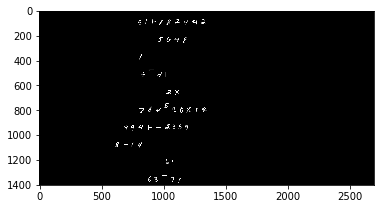

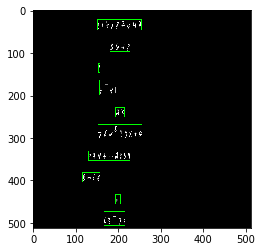

 10%|▉         | 49/500 [01:29<13:26,  1.79s/it]

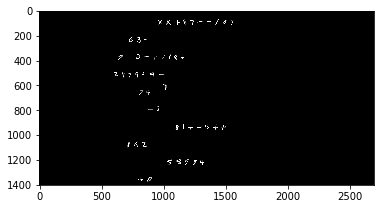

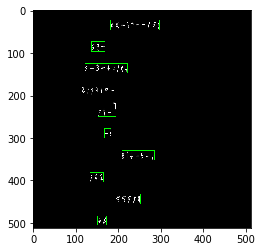

 10%|█         | 50/500 [01:31<13:13,  1.76s/it]

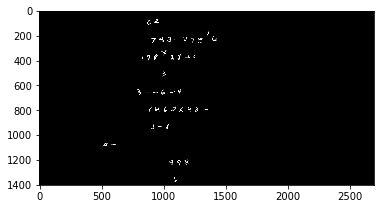

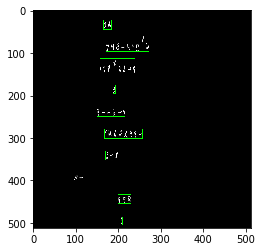

 10%|█         | 51/500 [01:33<13:28,  1.80s/it]

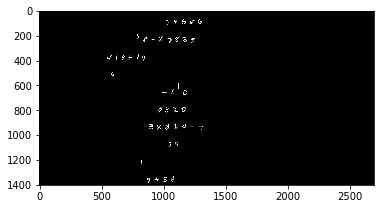

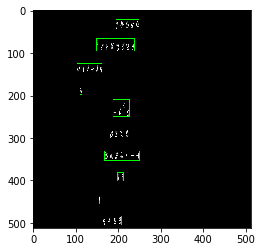

 10%|█         | 52/500 [01:35<13:01,  1.74s/it]

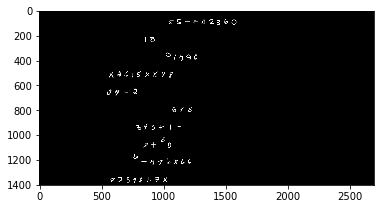

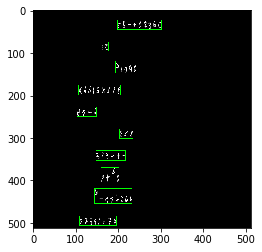

 11%|█         | 53/500 [01:36<13:04,  1.75s/it]

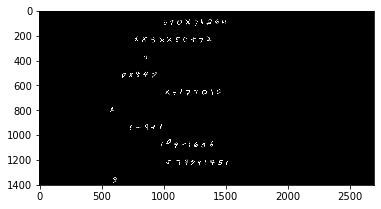

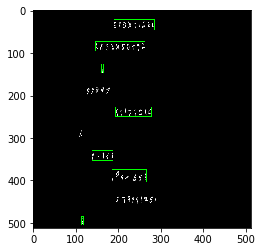

 11%|█         | 54/500 [01:38<12:53,  1.73s/it]

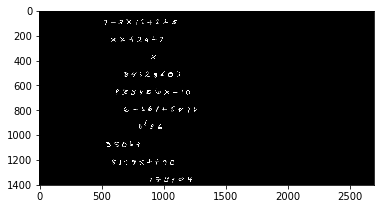

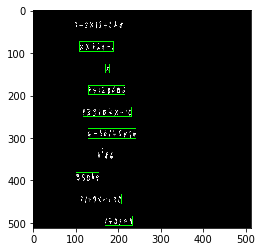

 11%|█         | 55/500 [01:41<14:58,  2.02s/it]

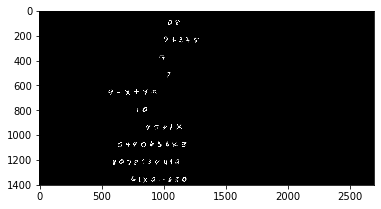

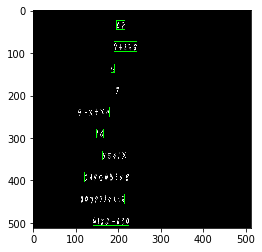

 11%|█         | 56/500 [01:43<14:25,  1.95s/it]

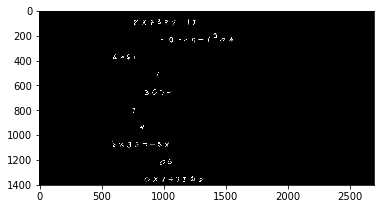

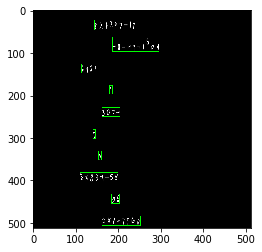

 11%|█▏        | 57/500 [01:47<20:40,  2.80s/it]

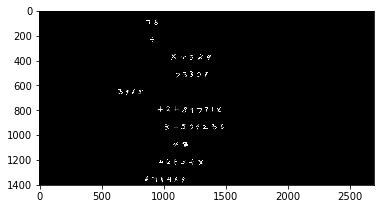

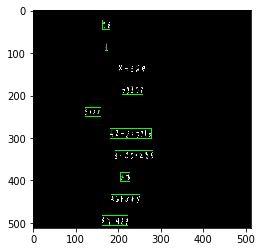

 12%|█▏        | 58/500 [01:49<17:58,  2.44s/it]

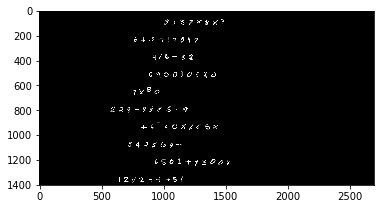

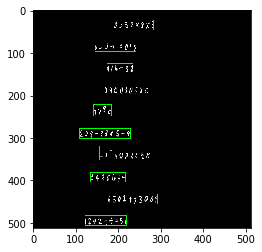

 12%|█▏        | 59/500 [01:51<16:36,  2.26s/it]

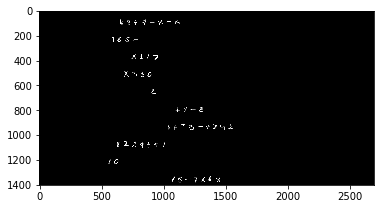

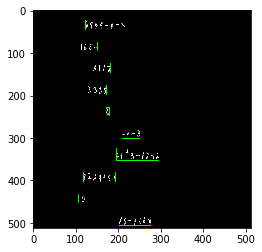

 12%|█▏        | 60/500 [01:53<15:24,  2.10s/it]

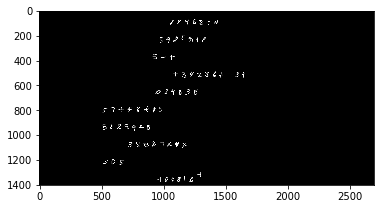

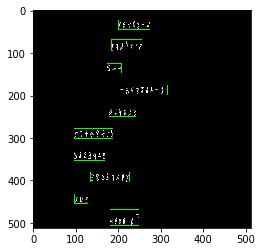

 12%|█▏        | 61/500 [01:55<15:08,  2.07s/it]

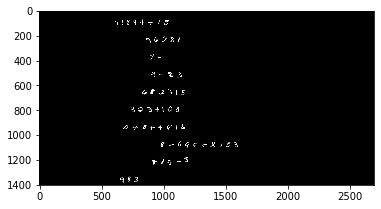

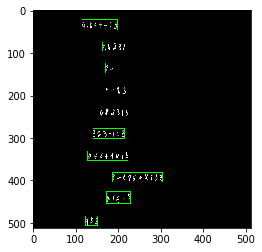

 12%|█▏        | 62/500 [01:56<14:12,  1.95s/it]

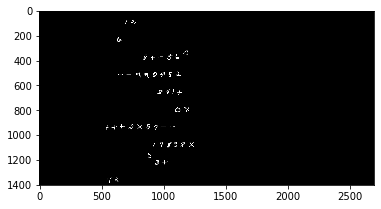

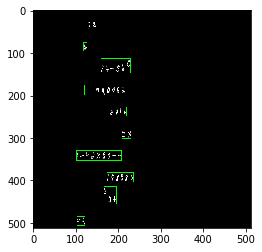

 13%|█▎        | 63/500 [01:58<13:28,  1.85s/it]

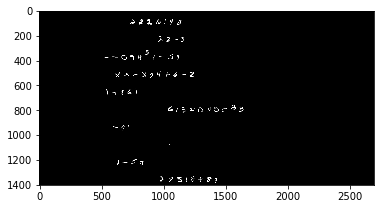

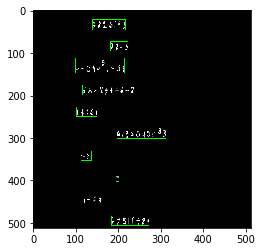

 13%|█▎        | 64/500 [02:00<13:40,  1.88s/it]

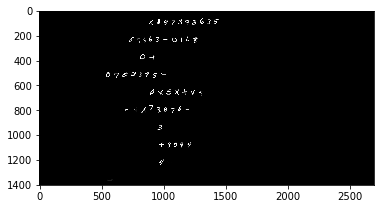

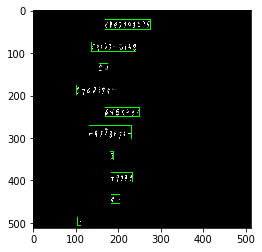

 13%|█▎        | 65/500 [02:02<13:29,  1.86s/it]

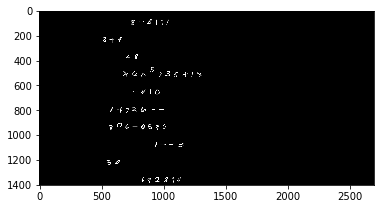

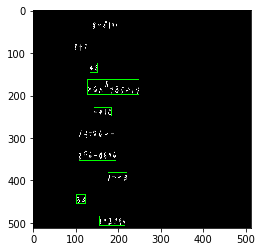

 13%|█▎        | 66/500 [02:03<13:19,  1.84s/it]

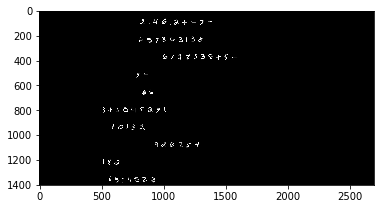

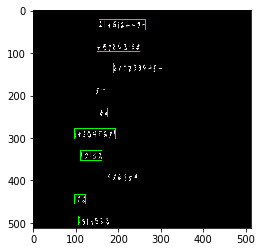

 13%|█▎        | 67/500 [02:05<13:28,  1.87s/it]

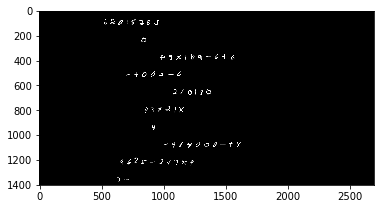

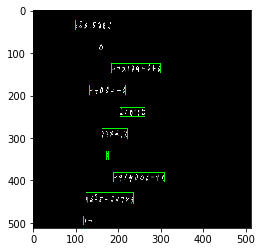

 14%|█▎        | 68/500 [02:07<13:03,  1.81s/it]

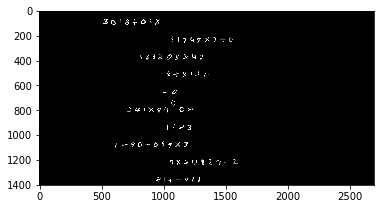

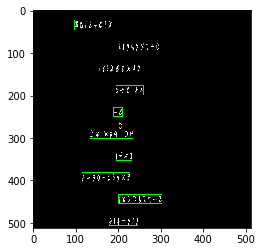

 14%|█▍        | 69/500 [02:09<12:48,  1.78s/it]

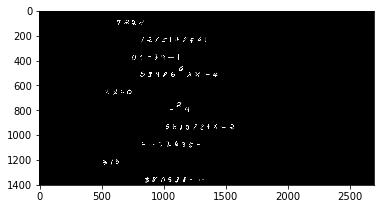

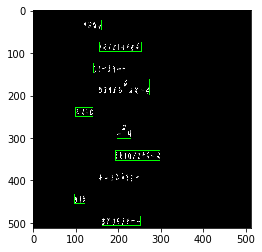

 14%|█▍        | 70/500 [02:10<12:27,  1.74s/it]

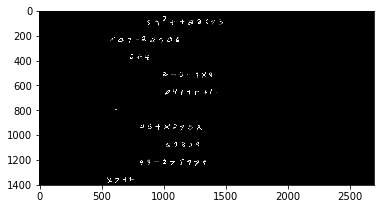

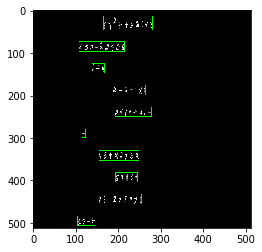

 14%|█▍        | 71/500 [02:12<13:05,  1.83s/it]

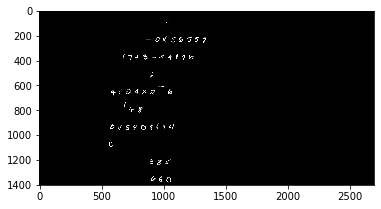

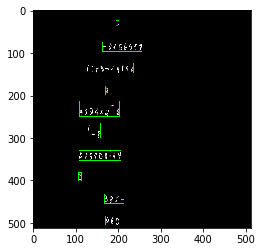

 14%|█▍        | 72/500 [02:14<13:01,  1.83s/it]

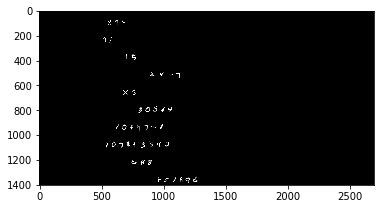

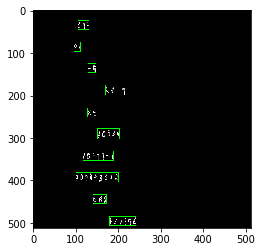

 15%|█▍        | 73/500 [02:16<12:41,  1.78s/it]

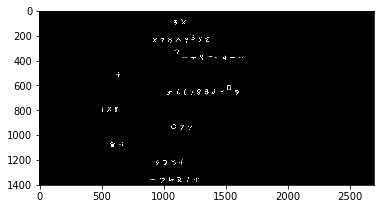

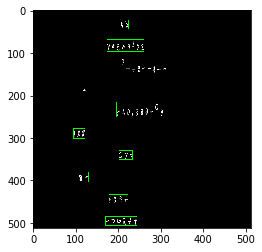

 15%|█▍        | 74/500 [02:17<12:11,  1.72s/it]

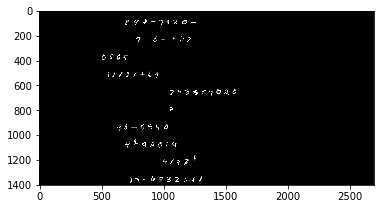

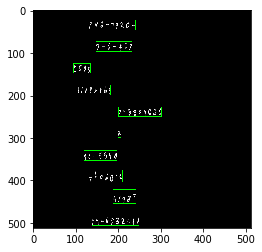

 15%|█▌        | 75/500 [02:19<12:42,  1.79s/it]

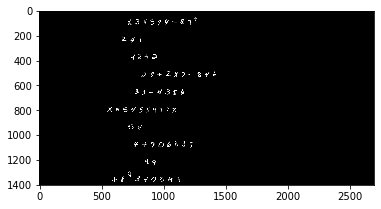

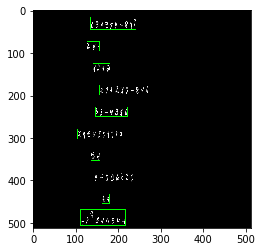

 15%|█▌        | 76/500 [02:22<13:23,  1.89s/it]

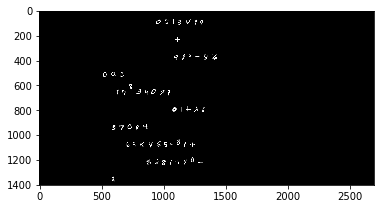

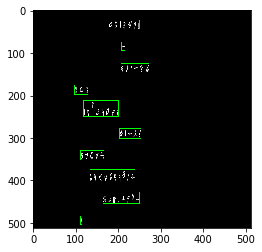

 15%|█▌        | 77/500 [02:24<13:54,  1.97s/it]

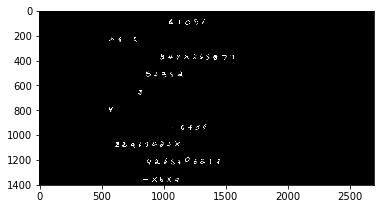

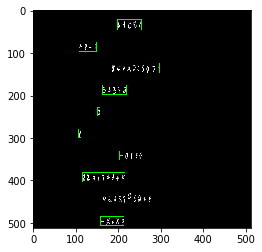

 16%|█▌        | 78/500 [02:26<14:00,  1.99s/it]

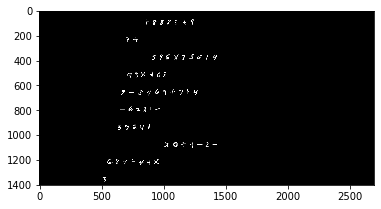

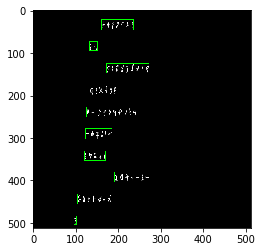

 16%|█▌        | 79/500 [02:27<13:04,  1.86s/it]

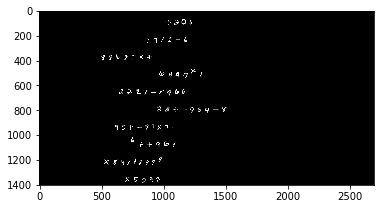

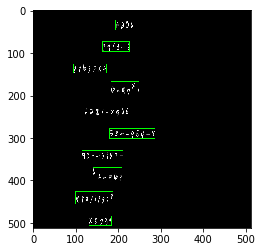

 16%|█▌        | 80/500 [02:29<12:54,  1.84s/it]

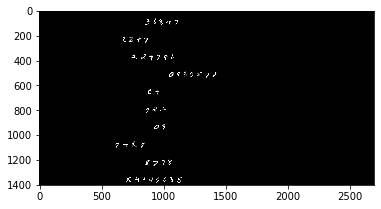

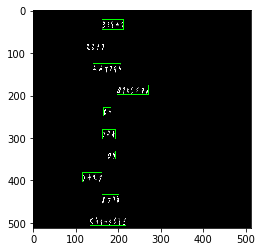

 16%|█▌        | 81/500 [02:31<13:41,  1.96s/it]

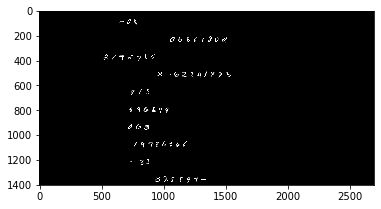

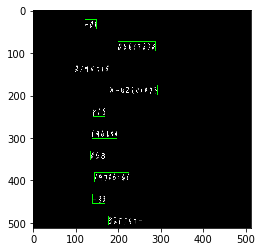

 16%|█▋        | 82/500 [02:33<13:45,  1.97s/it]

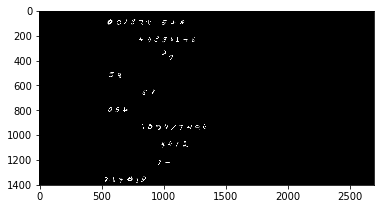

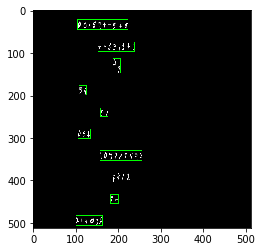

 17%|█▋        | 83/500 [02:35<13:21,  1.92s/it]

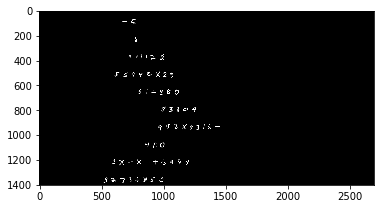

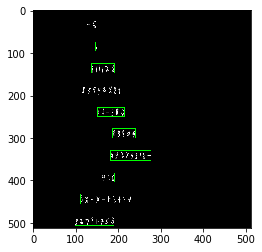

 17%|█▋        | 84/500 [02:37<14:06,  2.04s/it]

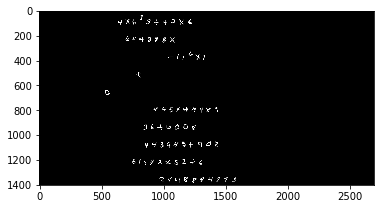

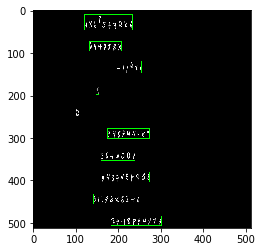

 17%|█▋        | 85/500 [02:42<20:06,  2.91s/it]

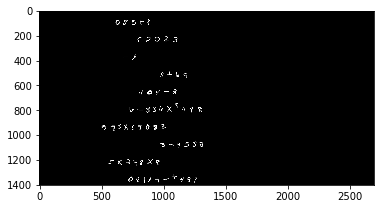

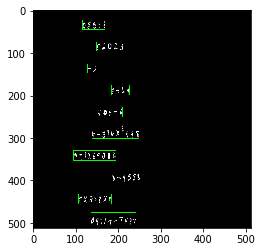

 17%|█▋        | 86/500 [02:44<17:44,  2.57s/it]

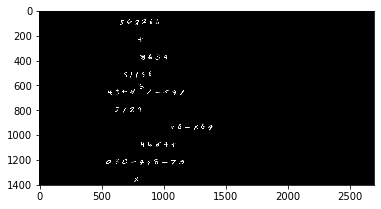

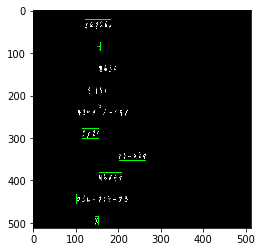

 17%|█▋        | 87/500 [02:46<16:11,  2.35s/it]

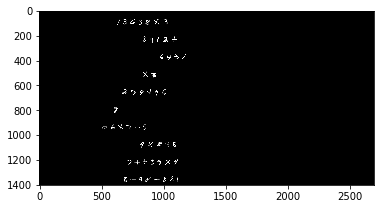

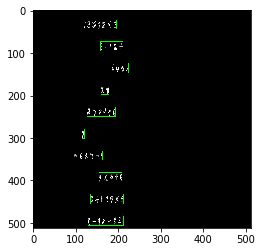

 18%|█▊        | 88/500 [02:48<15:33,  2.26s/it]

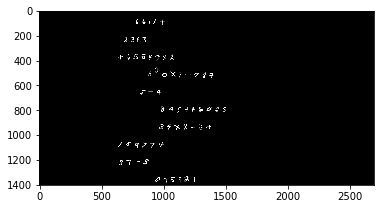

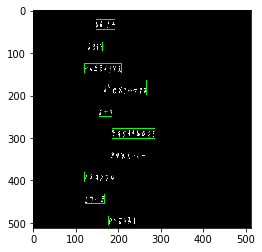

 18%|█▊        | 89/500 [02:50<14:22,  2.10s/it]

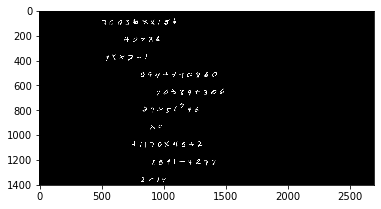

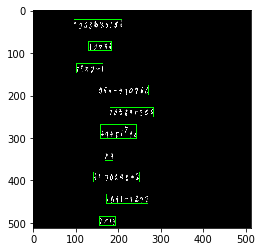

 18%|█▊        | 90/500 [02:52<14:51,  2.17s/it]

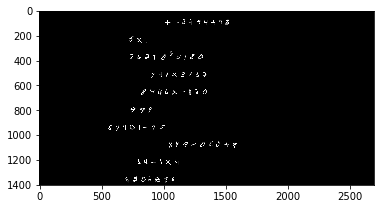

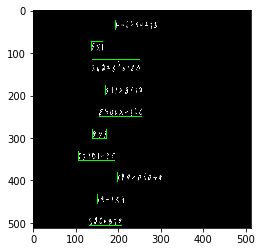

 18%|█▊        | 91/500 [02:54<13:43,  2.01s/it]

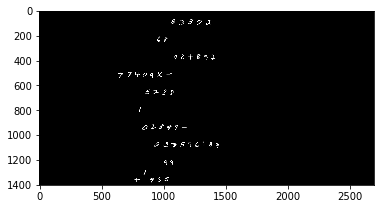

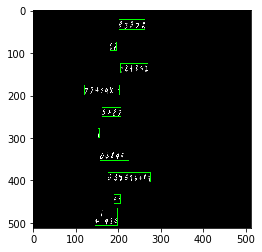

 18%|█▊        | 92/500 [02:56<13:20,  1.96s/it]

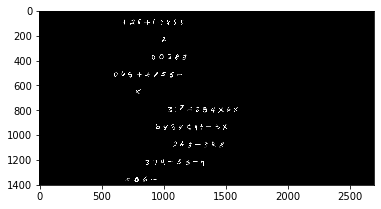

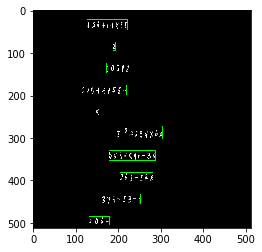

 19%|█▊        | 93/500 [02:57<13:07,  1.93s/it]

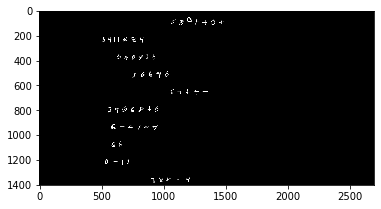

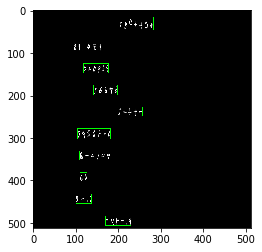

 19%|█▉        | 94/500 [02:59<13:03,  1.93s/it]

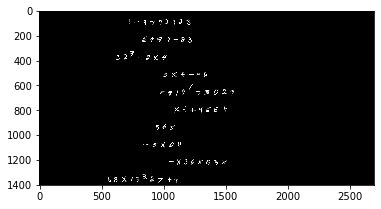

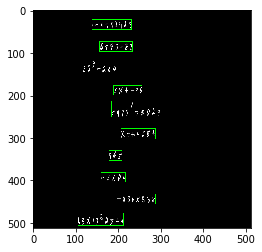

 19%|█▉        | 95/500 [03:02<13:35,  2.01s/it]

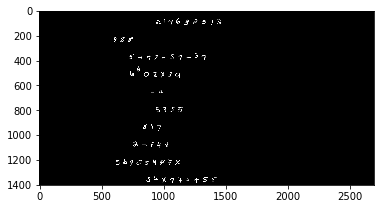

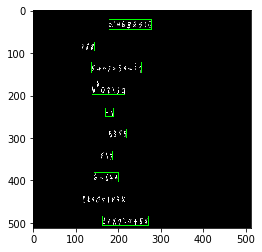

 19%|█▉        | 96/500 [03:04<14:26,  2.14s/it]

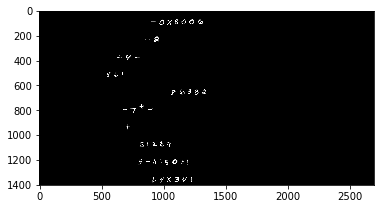

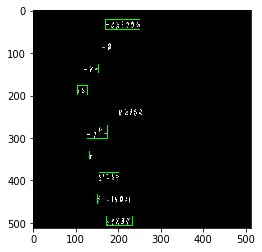

 19%|█▉        | 97/500 [03:06<14:15,  2.12s/it]

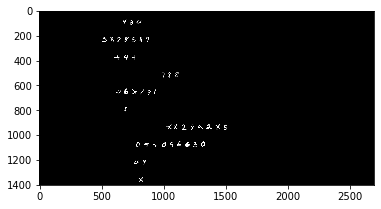

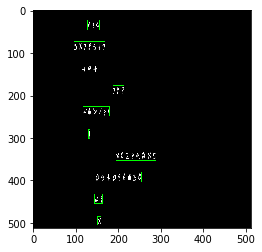

 20%|█▉        | 98/500 [03:08<14:17,  2.13s/it]

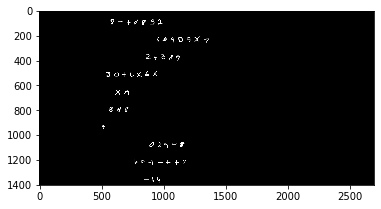

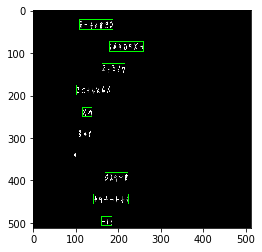

 20%|█▉        | 99/500 [03:10<13:26,  2.01s/it]

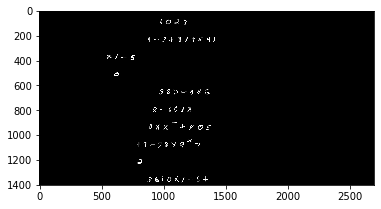

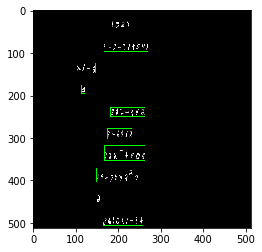

 20%|██        | 100/500 [03:12<12:48,  1.92s/it]

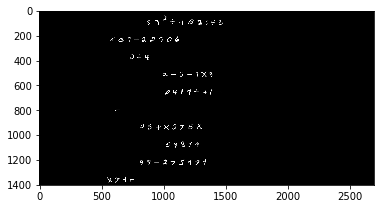

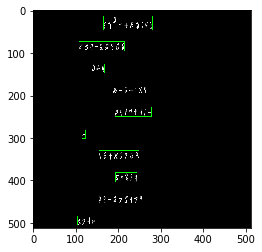

 20%|██        | 101/500 [03:13<11:45,  1.77s/it]

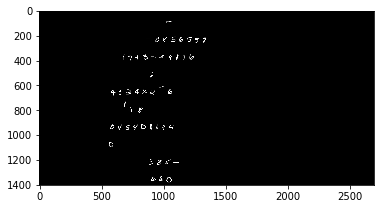

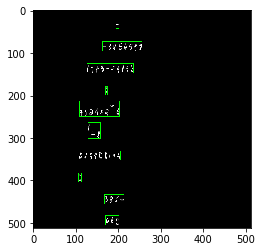

 20%|██        | 102/500 [03:15<10:57,  1.65s/it]

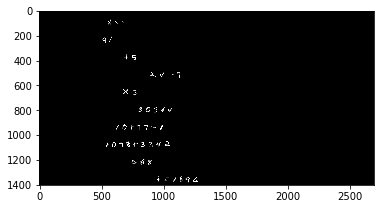

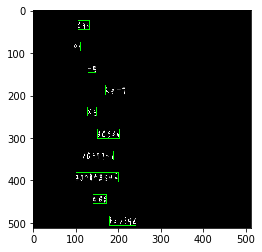

 21%|██        | 103/500 [03:17<11:34,  1.75s/it]

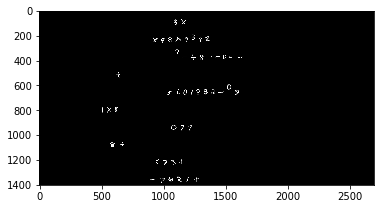

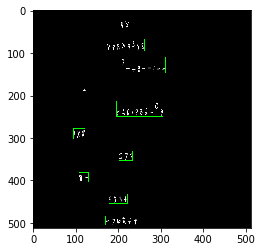

 21%|██        | 104/500 [03:18<11:11,  1.70s/it]

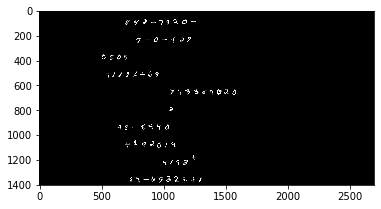

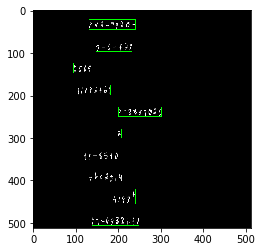

 21%|██        | 105/500 [03:19<10:22,  1.58s/it]

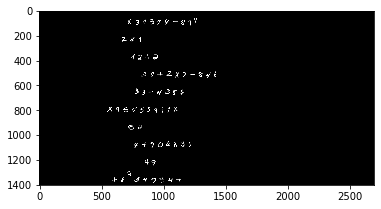

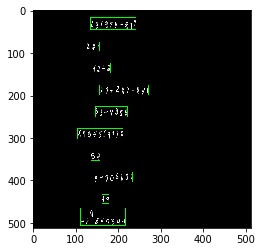

 21%|██        | 106/500 [03:21<11:10,  1.70s/it]

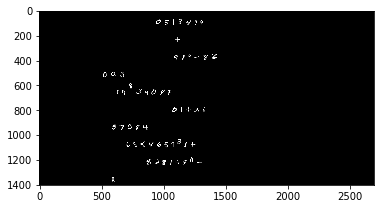

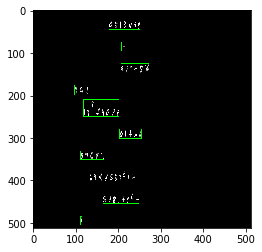

 21%|██▏       | 107/500 [03:24<13:14,  2.02s/it]

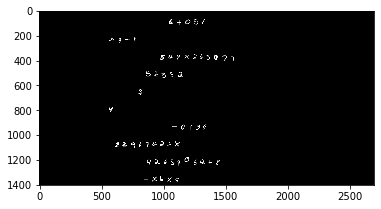

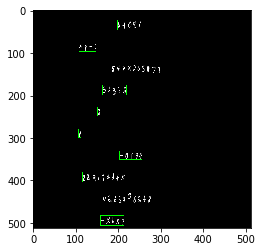

 22%|██▏       | 108/500 [03:26<12:23,  1.90s/it]

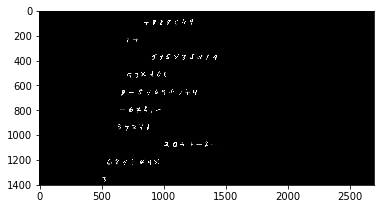

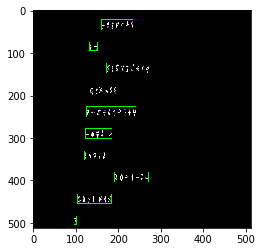

 22%|██▏       | 109/500 [03:28<12:28,  1.91s/it]

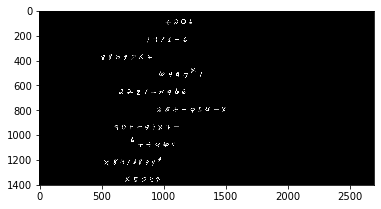

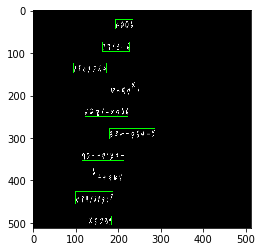

 22%|██▏       | 110/500 [03:30<13:39,  2.10s/it]

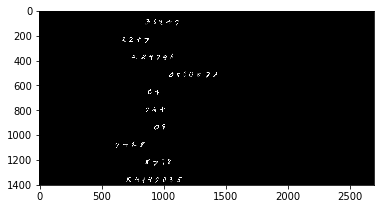

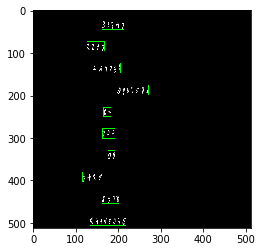

 22%|██▏       | 111/500 [03:32<12:51,  1.98s/it]

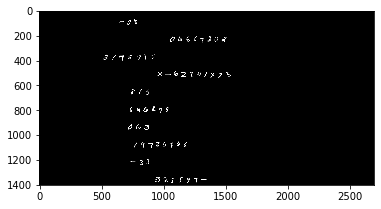

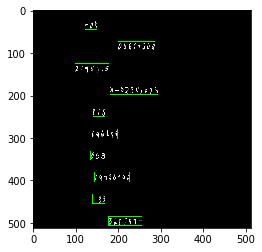

 22%|██▏       | 112/500 [03:33<11:45,  1.82s/it]

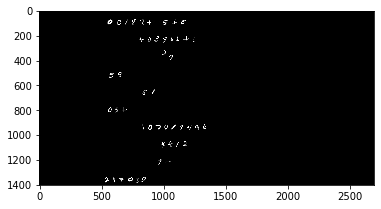

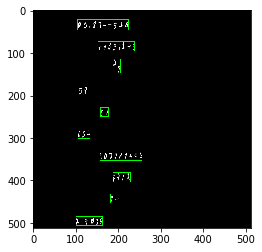

 23%|██▎       | 113/500 [03:37<14:53,  2.31s/it]

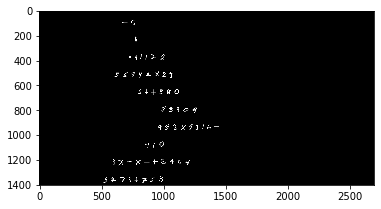

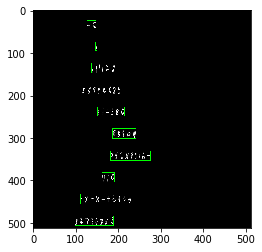

 23%|██▎       | 114/500 [03:38<13:15,  2.06s/it]

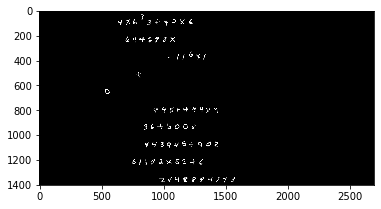

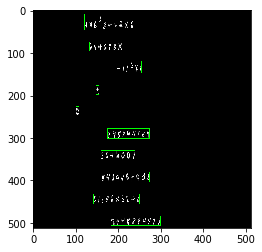

 23%|██▎       | 115/500 [03:42<15:51,  2.47s/it]

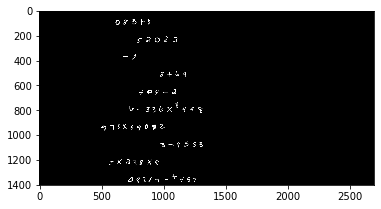

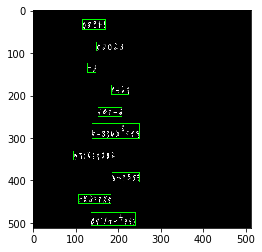

 23%|██▎       | 116/500 [03:43<13:24,  2.09s/it]

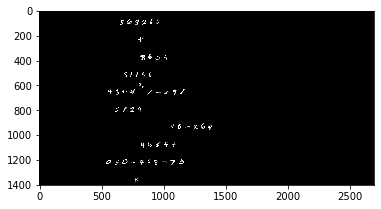

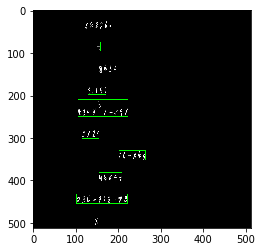

 23%|██▎       | 117/500 [03:45<13:44,  2.15s/it]

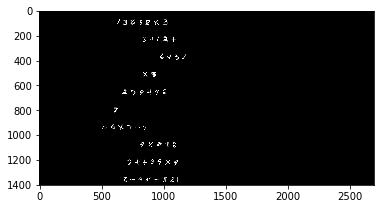

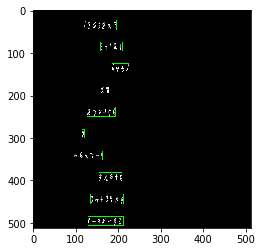

 24%|██▎       | 118/500 [03:47<12:52,  2.02s/it]

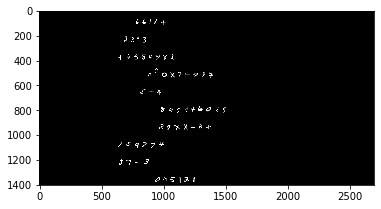

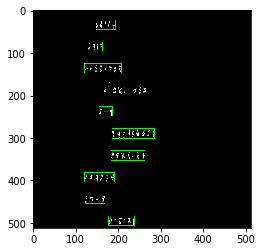

 24%|██▍       | 119/500 [03:49<12:03,  1.90s/it]

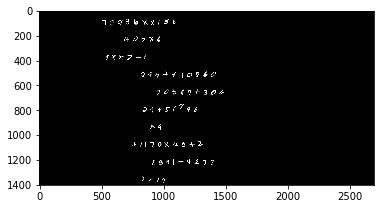

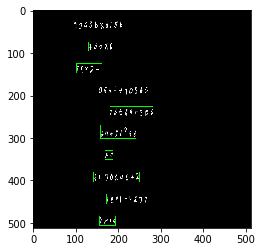

 24%|██▍       | 120/500 [03:50<11:36,  1.83s/it]

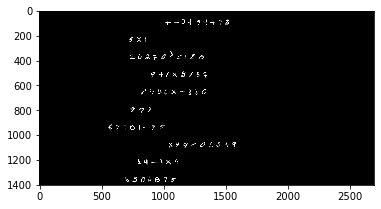

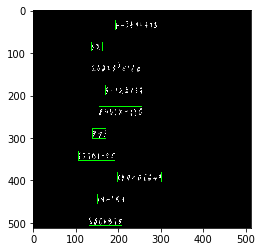

 24%|██▍       | 121/500 [03:52<11:20,  1.80s/it]

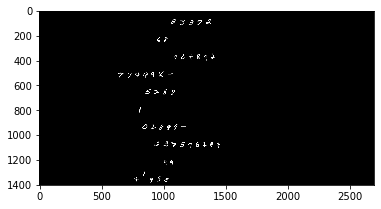

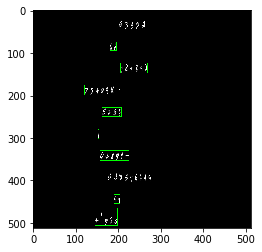

 24%|██▍       | 122/500 [03:53<10:21,  1.64s/it]

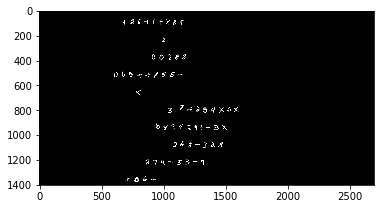

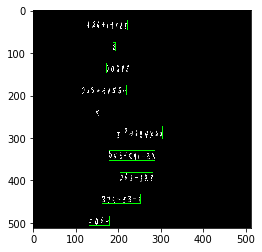

 25%|██▍       | 123/500 [03:55<11:19,  1.80s/it]

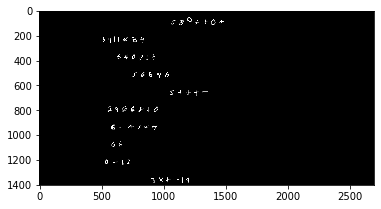

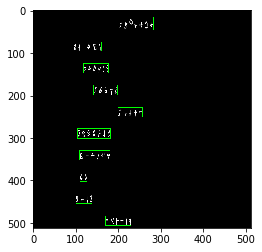

 25%|██▍       | 124/500 [03:58<12:45,  2.04s/it]

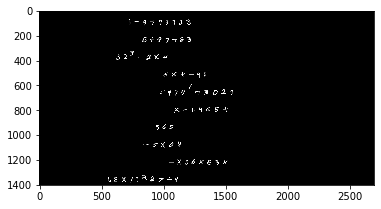

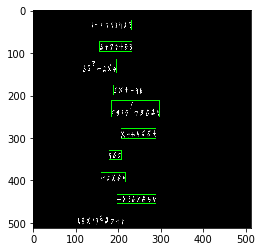

 25%|██▌       | 125/500 [04:00<12:49,  2.05s/it]

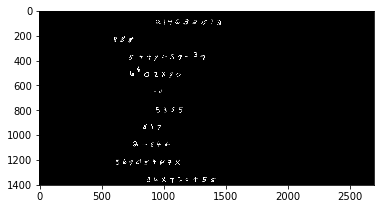

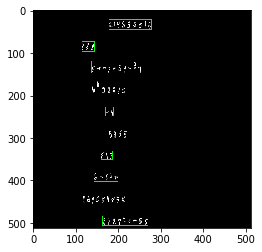

 25%|██▌       | 126/500 [04:02<12:10,  1.95s/it]

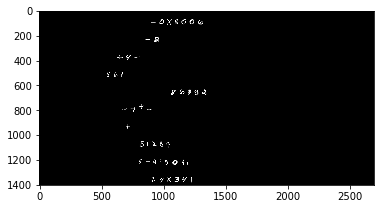

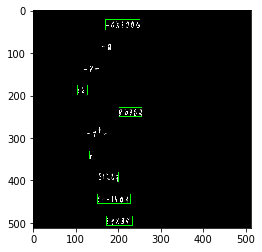

 25%|██▌       | 127/500 [04:04<12:04,  1.94s/it]

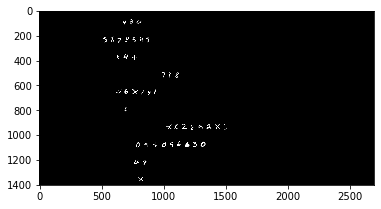

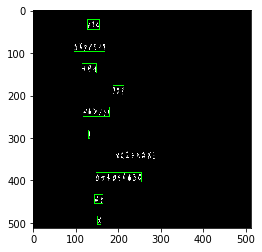

 26%|██▌       | 128/500 [04:07<13:55,  2.25s/it]

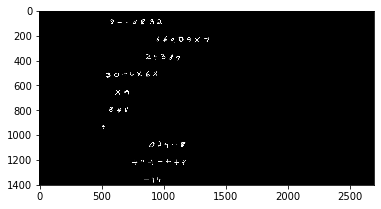

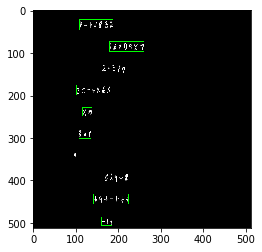

 26%|██▌       | 129/500 [04:09<13:13,  2.14s/it]

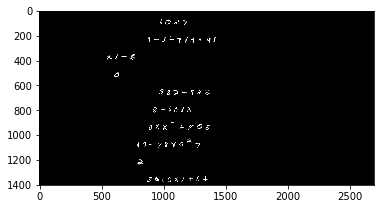

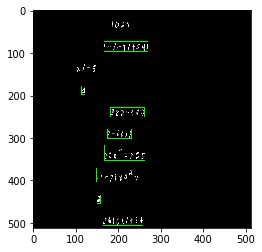

 26%|██▌       | 130/500 [04:10<12:06,  1.96s/it]

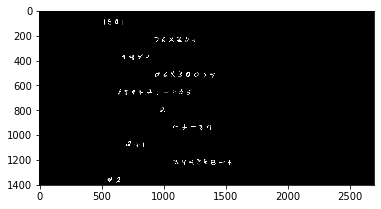

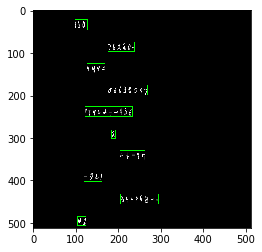

 26%|██▌       | 131/500 [04:12<11:23,  1.85s/it]

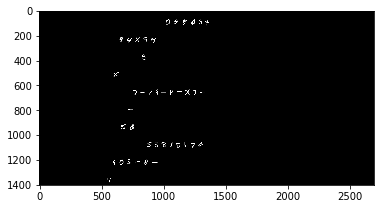

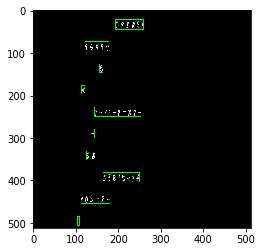

 26%|██▋       | 132/500 [04:14<12:53,  2.10s/it]

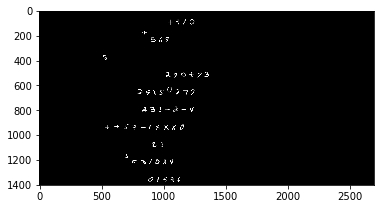

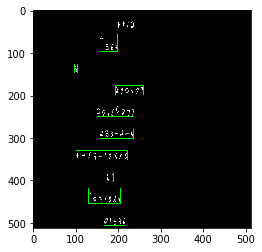

 27%|██▋       | 133/500 [04:16<11:38,  1.90s/it]

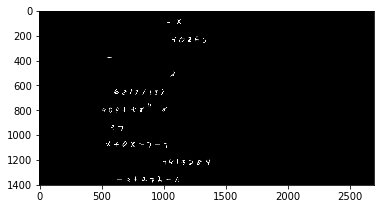

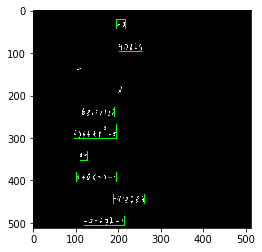

 27%|██▋       | 134/500 [04:17<10:25,  1.71s/it]

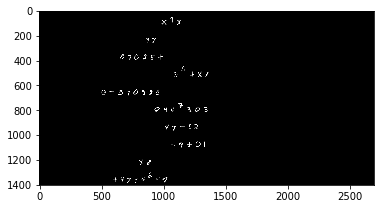

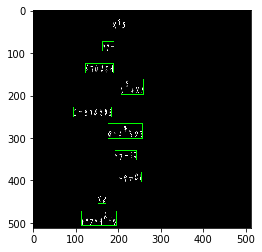

 27%|██▋       | 135/500 [04:20<12:02,  1.98s/it]

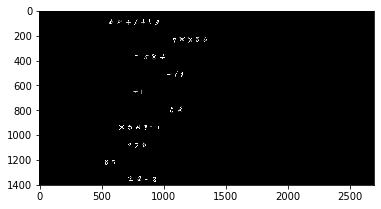

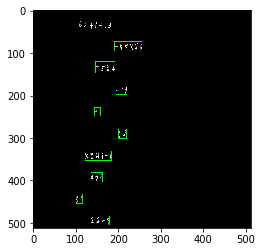

 27%|██▋       | 136/500 [04:22<11:56,  1.97s/it]

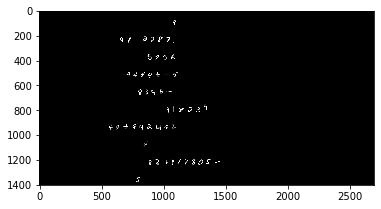

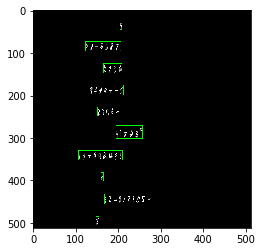

 27%|██▋       | 137/500 [04:23<10:42,  1.77s/it]

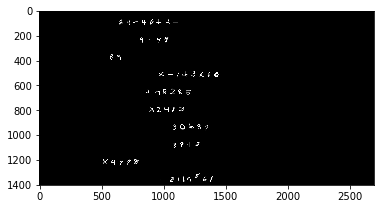

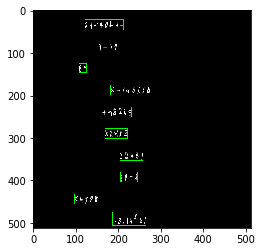

 28%|██▊       | 138/500 [04:25<11:44,  1.95s/it]

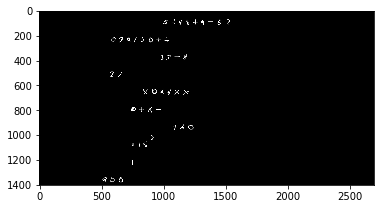

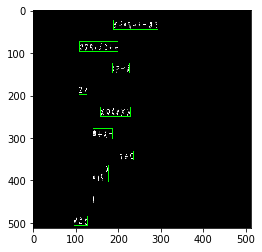

 28%|██▊       | 139/500 [04:28<13:03,  2.17s/it]

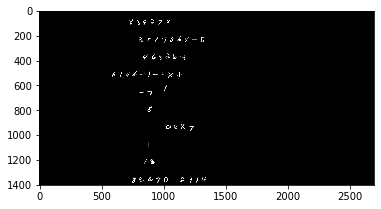

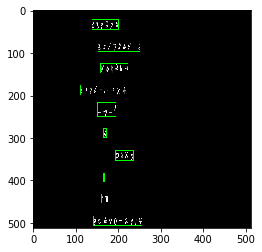

 28%|██▊       | 140/500 [04:30<12:15,  2.04s/it]

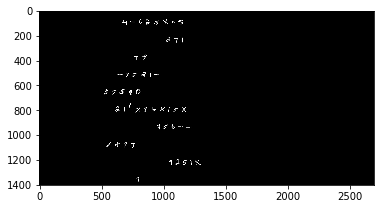

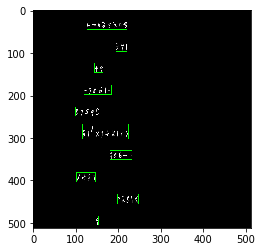

 28%|██▊       | 141/500 [04:31<11:07,  1.86s/it]

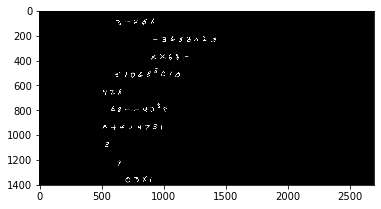

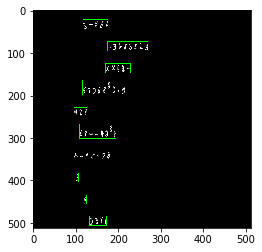

 28%|██▊       | 142/500 [04:33<11:08,  1.87s/it]

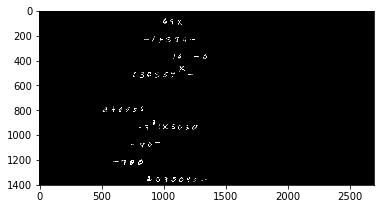

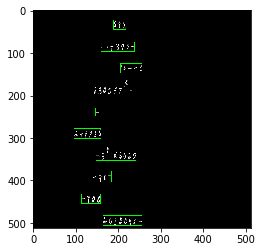

 29%|██▊       | 143/500 [04:35<11:40,  1.96s/it]

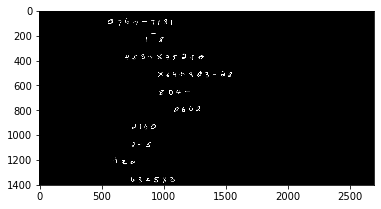

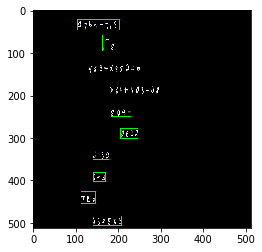

 29%|██▉       | 144/500 [04:37<10:48,  1.82s/it]

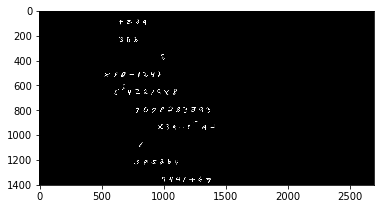

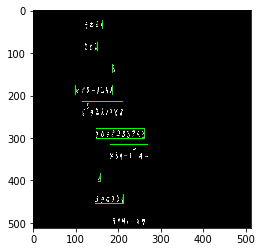

 29%|██▉       | 145/500 [04:38<09:58,  1.68s/it]

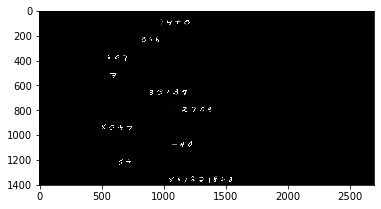

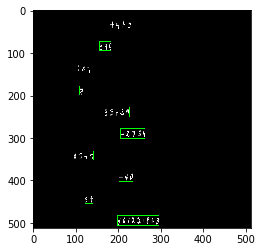

 29%|██▉       | 146/500 [04:40<10:27,  1.77s/it]

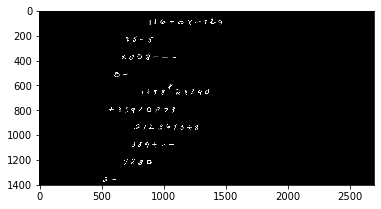

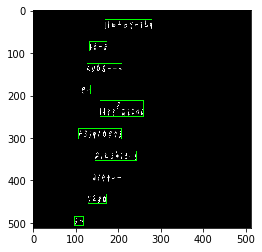

 29%|██▉       | 147/500 [04:42<10:37,  1.81s/it]

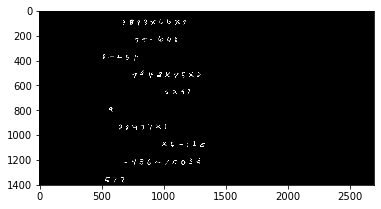

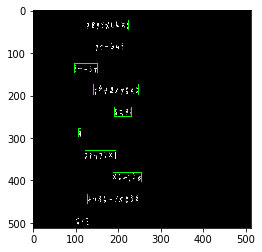

 30%|██▉       | 148/500 [04:44<11:23,  1.94s/it]

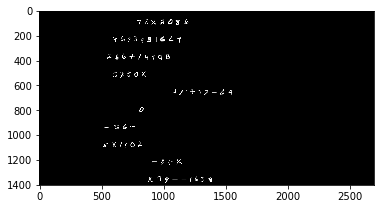

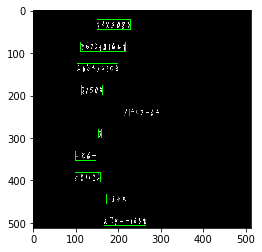

 30%|██▉       | 149/500 [04:46<10:50,  1.85s/it]

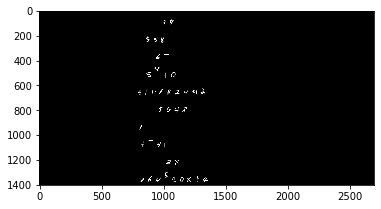

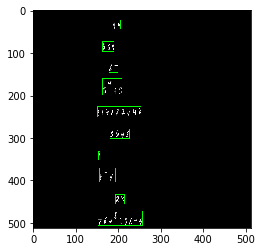

 30%|███       | 150/500 [04:47<09:58,  1.71s/it]

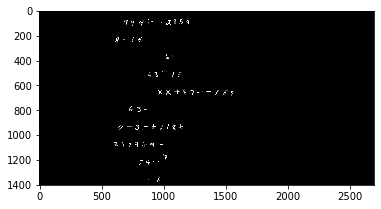

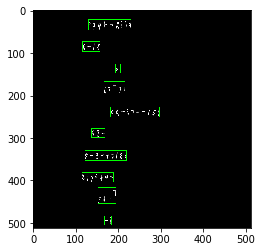

 30%|███       | 151/500 [04:49<10:21,  1.78s/it]

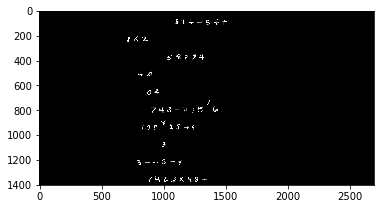

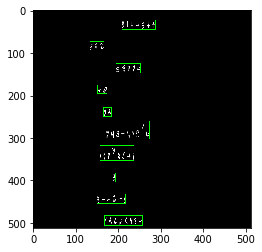

 30%|███       | 152/500 [04:52<12:21,  2.13s/it]

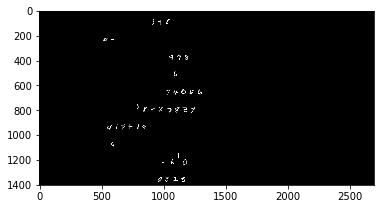

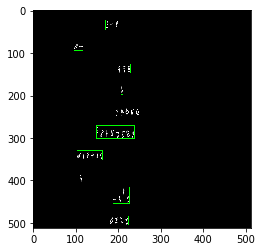

 31%|███       | 153/500 [04:54<11:00,  1.90s/it]

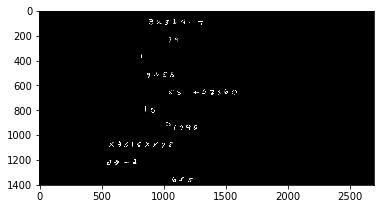

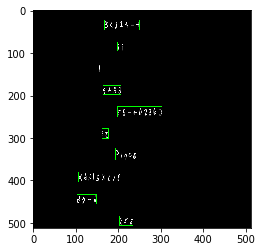

 31%|███       | 154/500 [04:57<13:08,  2.28s/it]

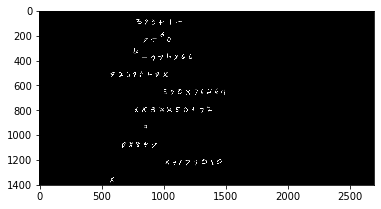

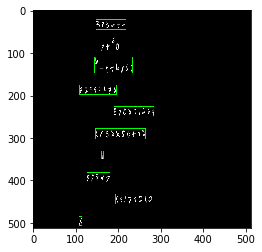

 31%|███       | 155/500 [04:58<11:49,  2.06s/it]

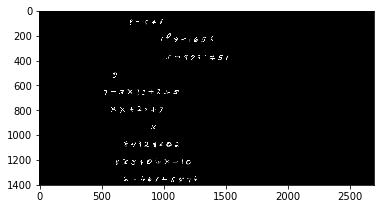

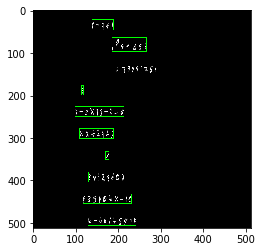

 31%|███       | 156/500 [05:00<10:38,  1.86s/it]

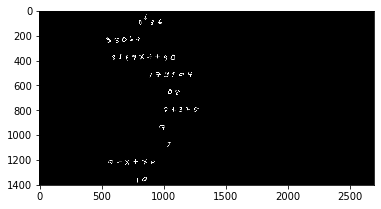

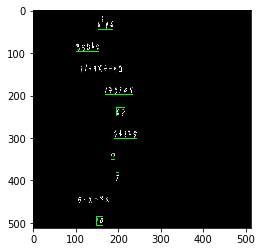

 31%|███▏      | 157/500 [05:02<12:10,  2.13s/it]

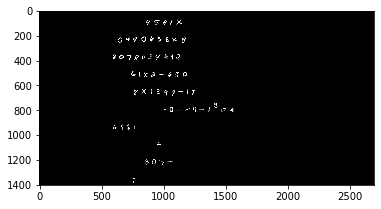

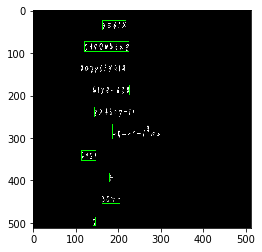

 32%|███▏      | 158/500 [05:04<10:40,  1.87s/it]

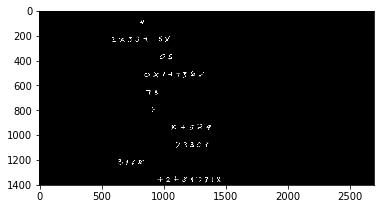

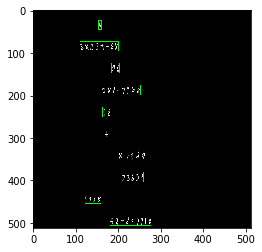

 32%|███▏      | 159/500 [05:05<09:36,  1.69s/it]

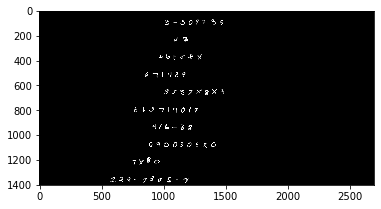

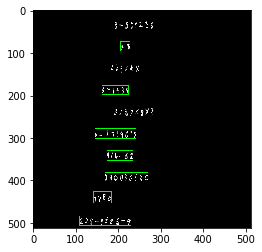

 32%|███▏      | 160/500 [05:07<11:04,  1.95s/it]

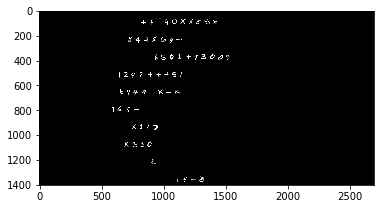

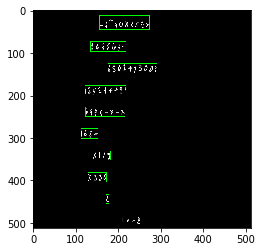

 32%|███▏      | 161/500 [05:09<10:05,  1.78s/it]

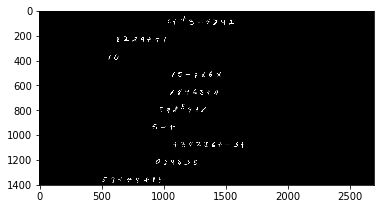

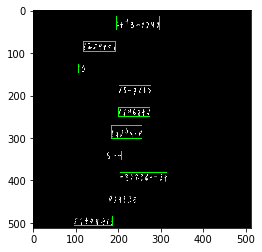

 32%|███▏      | 162/500 [05:10<09:46,  1.73s/it]

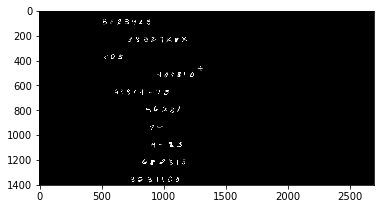

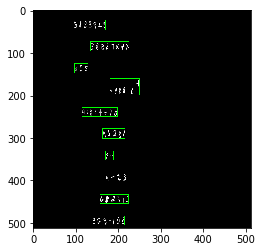

 33%|███▎      | 163/500 [05:13<10:53,  1.94s/it]

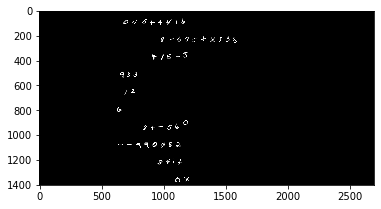

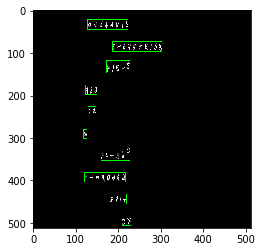

 33%|███▎      | 164/500 [05:15<10:27,  1.87s/it]

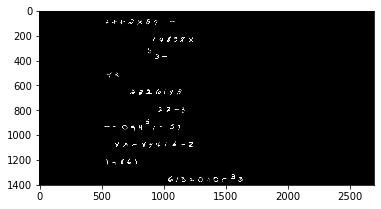

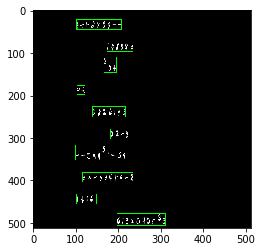

 33%|███▎      | 165/500 [05:16<10:19,  1.85s/it]

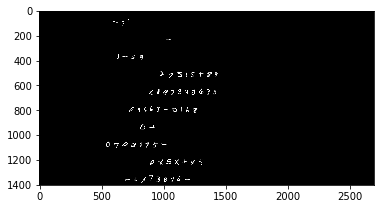

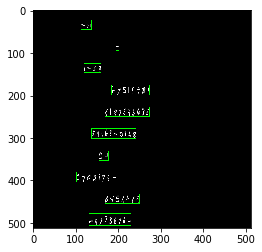

 33%|███▎      | 166/500 [05:18<10:37,  1.91s/it]

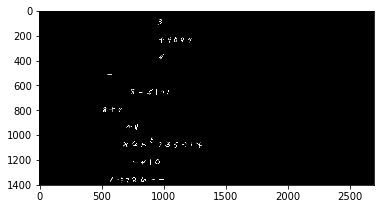

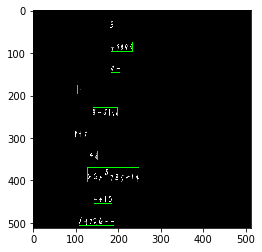

 33%|███▎      | 167/500 [05:20<10:06,  1.82s/it]

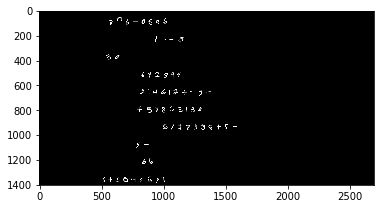

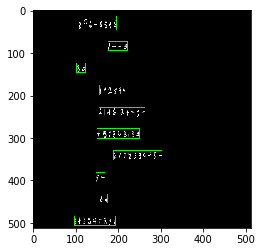

 34%|███▎      | 168/500 [05:22<10:21,  1.87s/it]

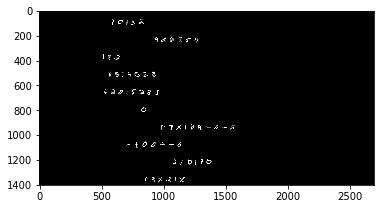

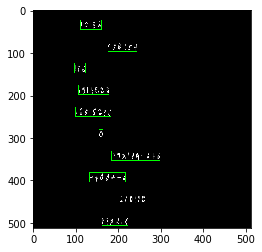

 34%|███▍      | 169/500 [05:23<09:23,  1.70s/it]

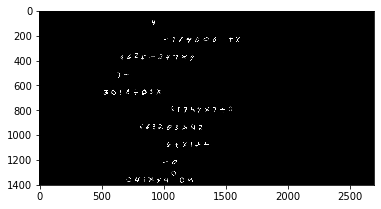

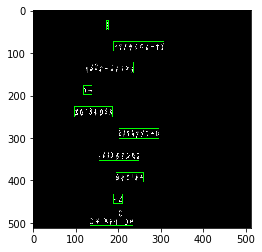

 34%|███▍      | 170/500 [05:25<09:12,  1.68s/it]

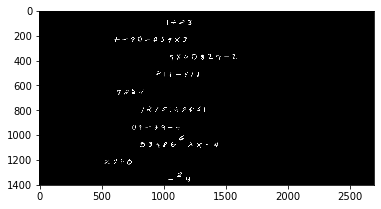

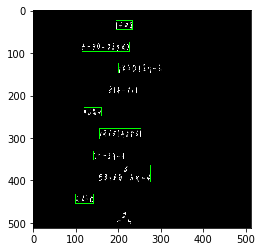

 34%|███▍      | 171/500 [05:26<08:33,  1.56s/it]

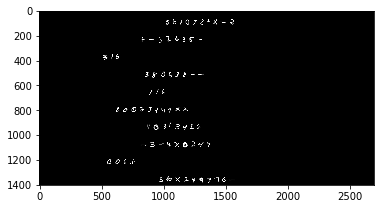

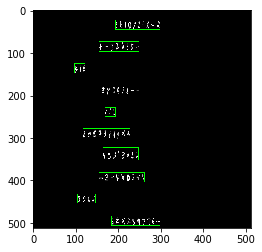

 34%|███▍      | 172/500 [05:28<08:14,  1.51s/it]

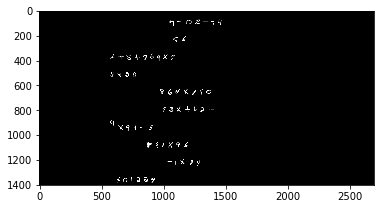

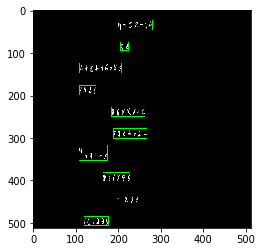

 35%|███▍      | 173/500 [05:29<07:52,  1.44s/it]

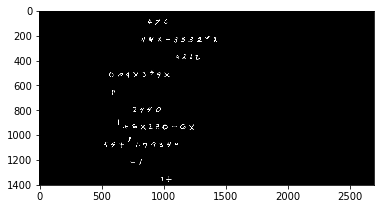

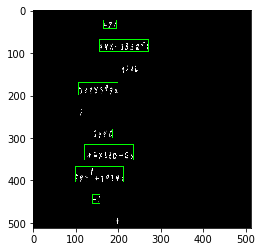

 35%|███▍      | 174/500 [05:30<07:46,  1.43s/it]

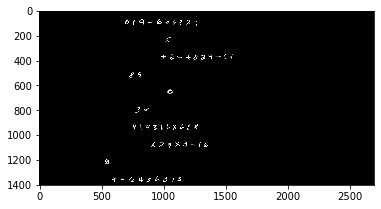

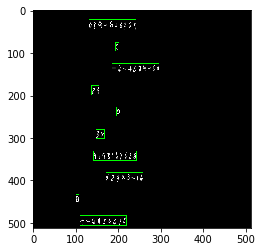

 35%|███▌      | 175/500 [05:32<07:38,  1.41s/it]

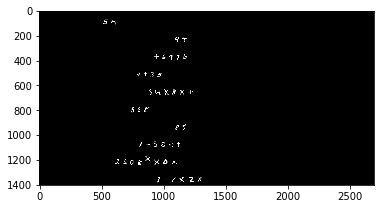

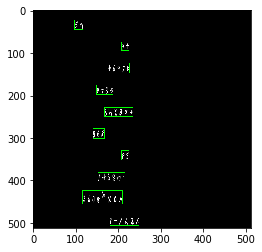

 35%|███▌      | 176/500 [05:33<07:30,  1.39s/it]

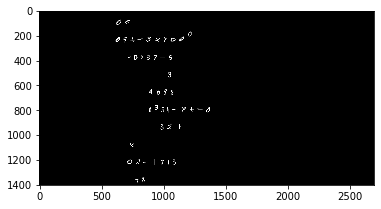

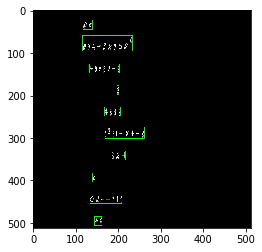

 35%|███▌      | 177/500 [05:35<07:43,  1.44s/it]

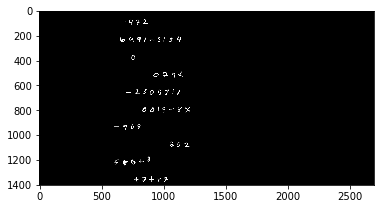

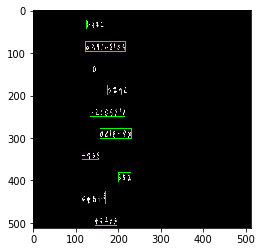

 36%|███▌      | 178/500 [05:36<07:36,  1.42s/it]

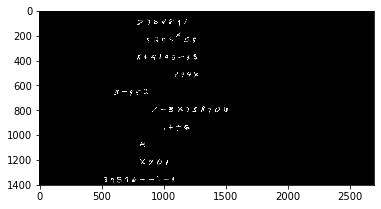

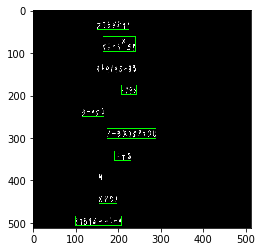

 36%|███▌      | 179/500 [05:38<07:59,  1.49s/it]

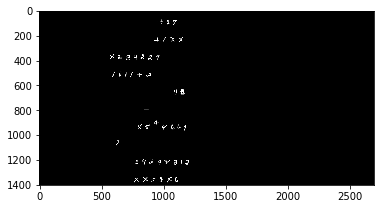

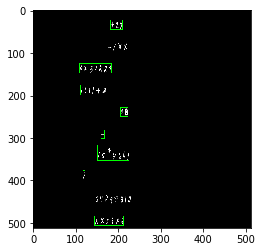

 36%|███▌      | 180/500 [05:39<07:54,  1.48s/it]

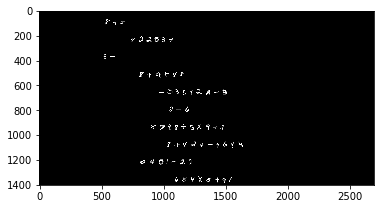

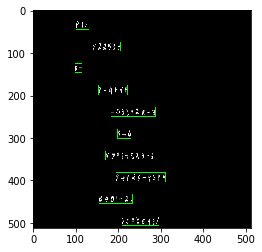

 36%|███▌      | 181/500 [05:41<08:00,  1.51s/it]

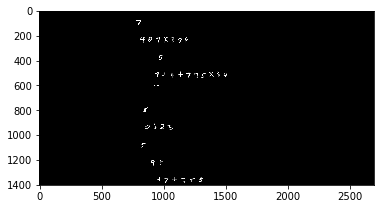

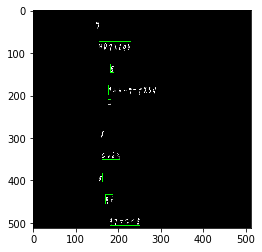

 36%|███▋      | 182/500 [05:42<07:46,  1.47s/it]

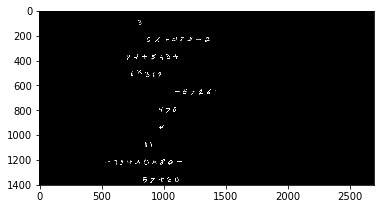

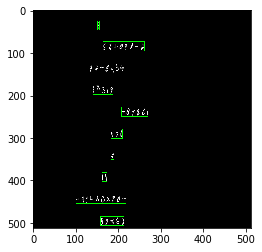

 37%|███▋      | 183/500 [05:44<07:55,  1.50s/it]

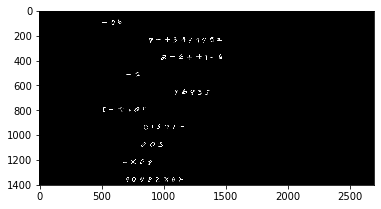

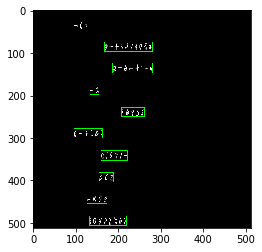

 37%|███▋      | 184/500 [05:45<07:51,  1.49s/it]

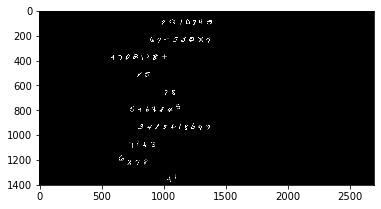

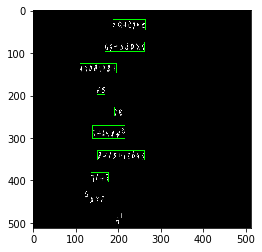

 37%|███▋      | 185/500 [05:48<10:13,  1.95s/it]

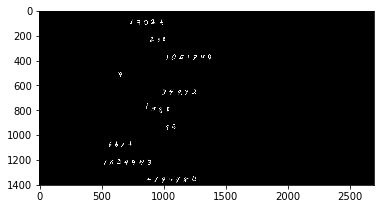

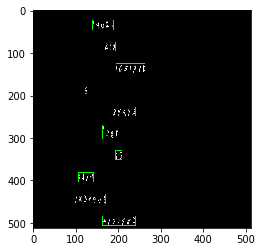

 37%|███▋      | 186/500 [05:50<09:20,  1.78s/it]

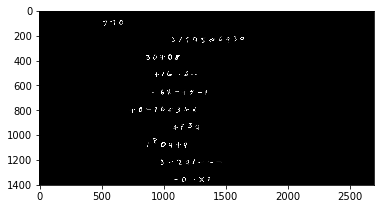

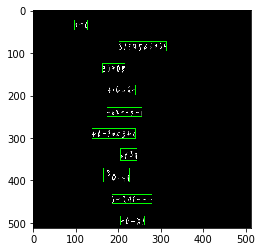

 37%|███▋      | 187/500 [05:51<09:23,  1.80s/it]

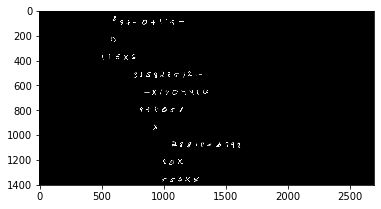

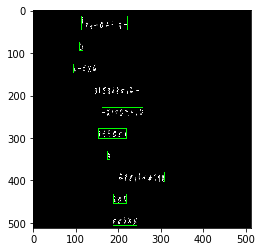

 38%|███▊      | 188/500 [05:53<08:30,  1.63s/it]

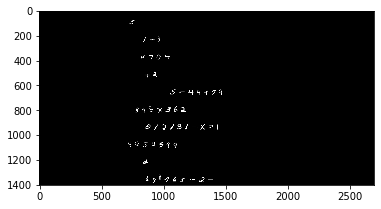

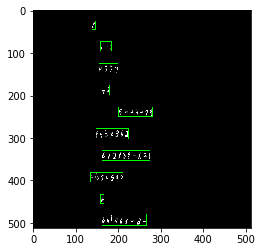

 38%|███▊      | 189/500 [05:54<08:16,  1.60s/it]

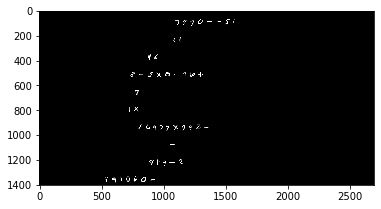

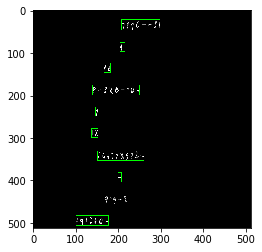

 38%|███▊      | 190/500 [05:55<07:45,  1.50s/it]

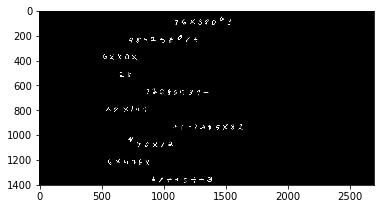

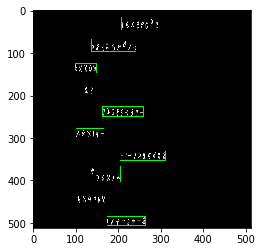

 38%|███▊      | 191/500 [05:57<07:24,  1.44s/it]

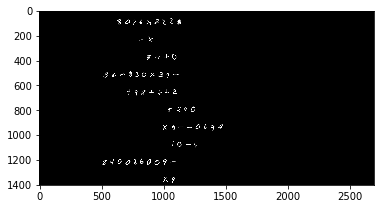

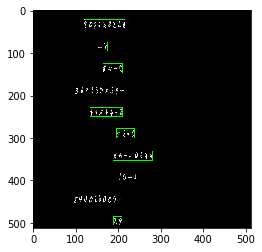

 38%|███▊      | 192/500 [06:01<11:04,  2.16s/it]

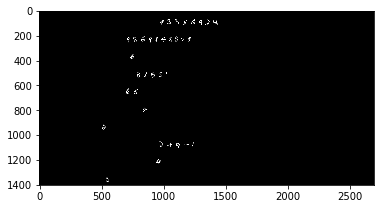

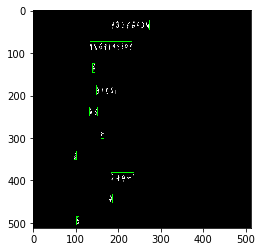

 39%|███▊      | 193/500 [06:02<09:54,  1.94s/it]

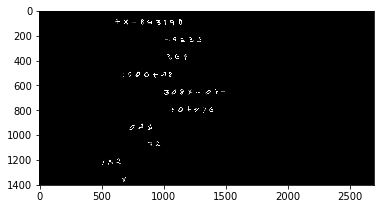

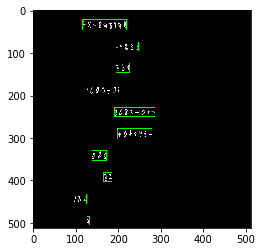

 39%|███▉      | 194/500 [06:03<08:55,  1.75s/it]

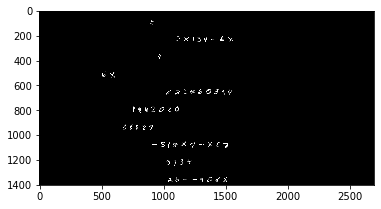

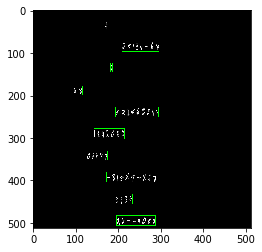

 39%|███▉      | 195/500 [06:05<08:21,  1.64s/it]

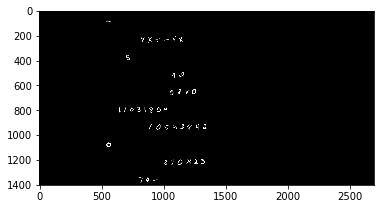

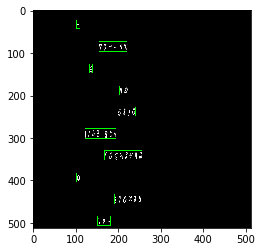

 39%|███▉      | 196/500 [06:06<08:39,  1.71s/it]

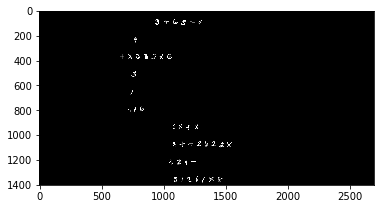

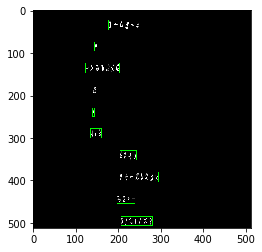

 39%|███▉      | 197/500 [06:08<08:13,  1.63s/it]

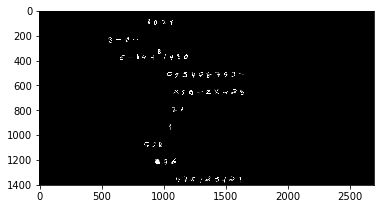

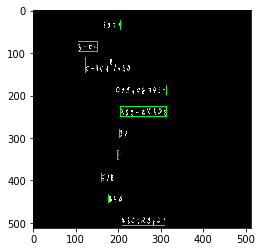

 40%|███▉      | 198/500 [06:10<08:06,  1.61s/it]

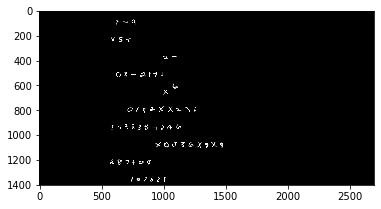

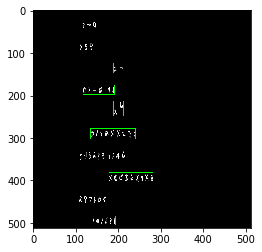

 40%|███▉      | 199/500 [06:11<07:35,  1.51s/it]

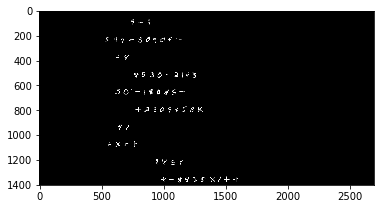

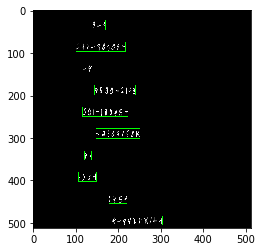

 40%|████      | 200/500 [06:12<07:11,  1.44s/it]

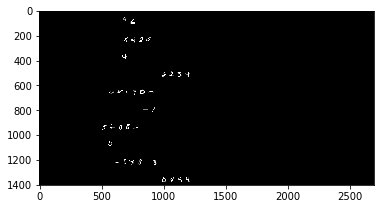

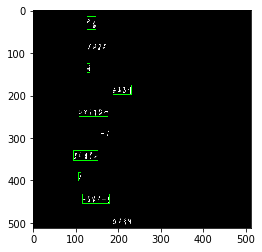

 40%|████      | 201/500 [06:14<07:14,  1.45s/it]

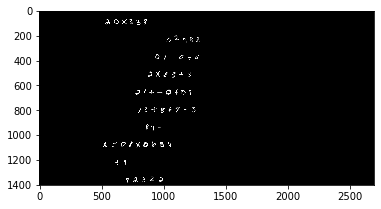

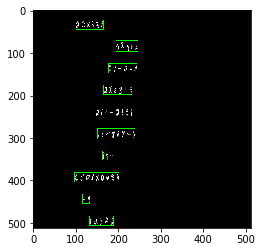

 40%|████      | 202/500 [06:15<07:04,  1.42s/it]

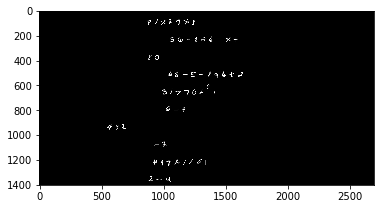

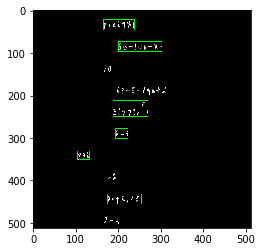

 41%|████      | 203/500 [06:17<07:23,  1.49s/it]

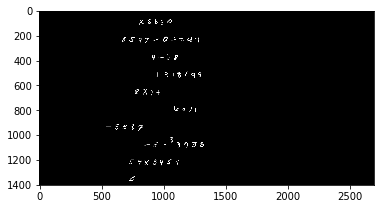

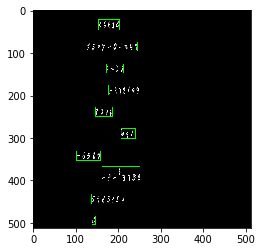

 41%|████      | 204/500 [06:18<07:17,  1.48s/it]

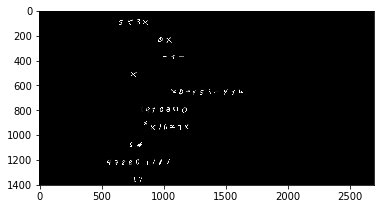

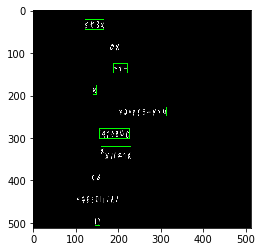

 41%|████      | 205/500 [06:19<07:07,  1.45s/it]

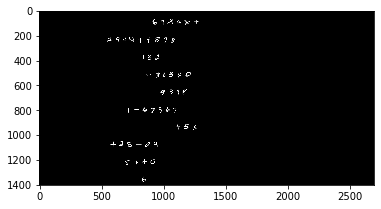

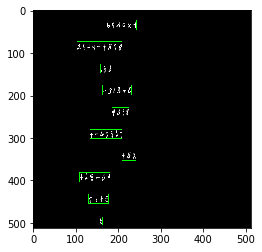

 41%|████      | 206/500 [06:21<06:47,  1.39s/it]

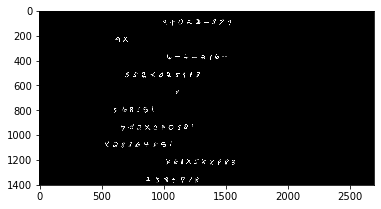

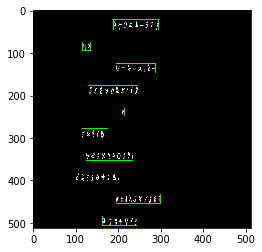

 41%|████▏     | 207/500 [06:22<07:15,  1.49s/it]

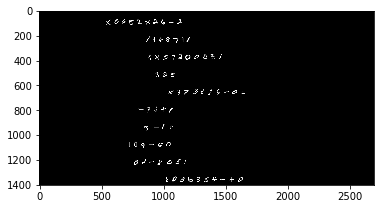

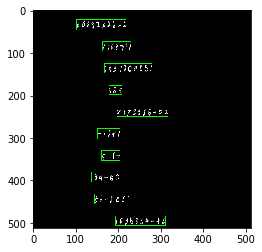

 42%|████▏     | 208/500 [06:24<07:11,  1.48s/it]

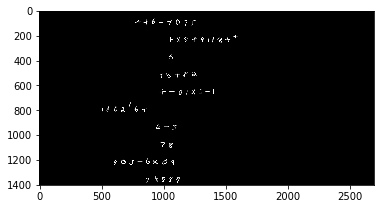

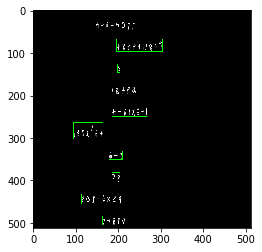

 42%|████▏     | 209/500 [06:25<07:07,  1.47s/it]

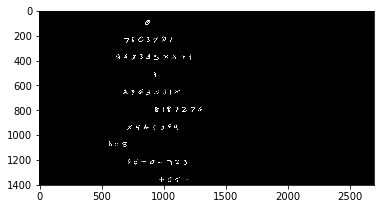

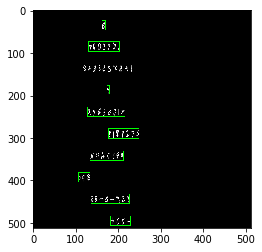

 42%|████▏     | 210/500 [06:27<06:54,  1.43s/it]

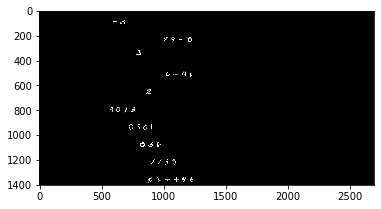

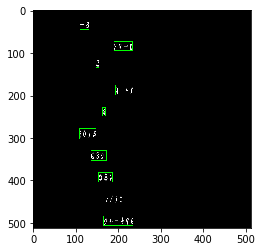

 42%|████▏     | 211/500 [06:28<06:44,  1.40s/it]

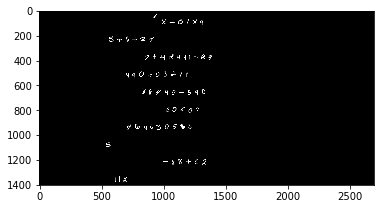

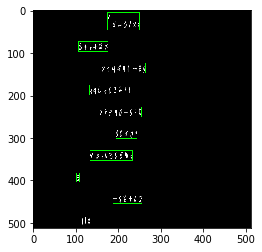

 42%|████▏     | 212/500 [06:29<06:30,  1.36s/it]

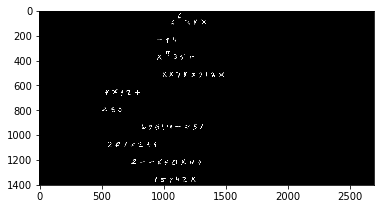

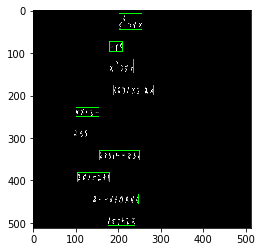

 43%|████▎     | 213/500 [06:31<06:35,  1.38s/it]

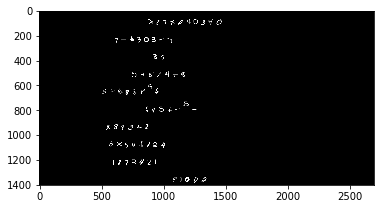

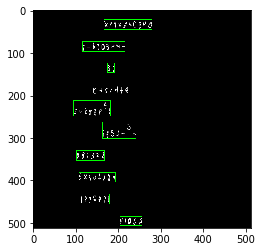

 43%|████▎     | 214/500 [06:32<06:29,  1.36s/it]

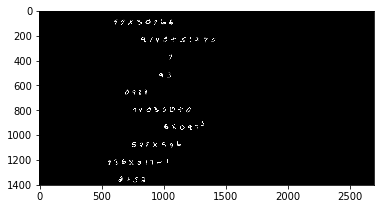

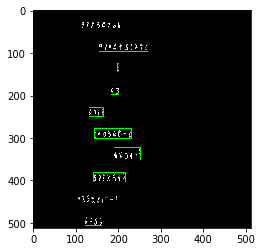

 43%|████▎     | 215/500 [06:33<06:29,  1.37s/it]

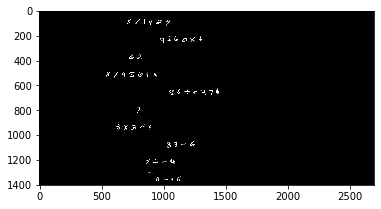

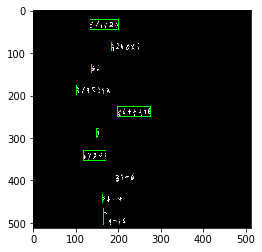

 43%|████▎     | 216/500 [06:35<06:41,  1.41s/it]

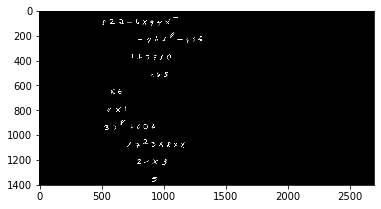

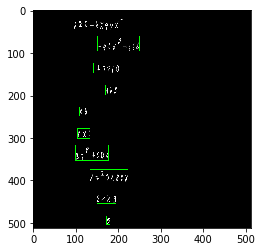

 43%|████▎     | 217/500 [06:36<06:43,  1.42s/it]

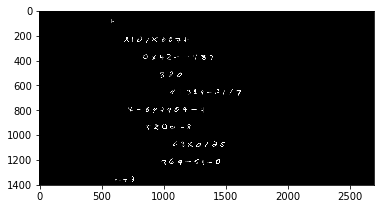

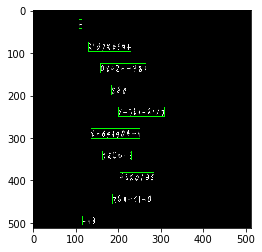

 44%|████▎     | 218/500 [06:38<06:59,  1.49s/it]

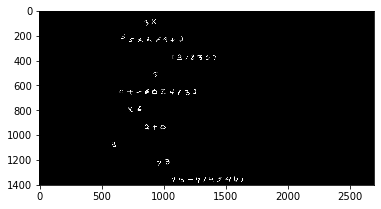

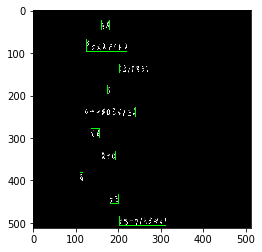

 44%|████▍     | 219/500 [06:39<06:38,  1.42s/it]

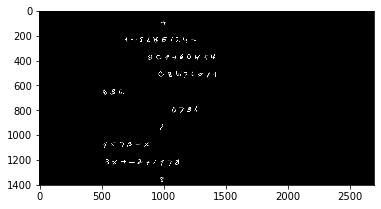

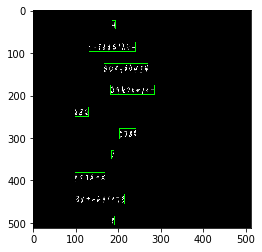

 44%|████▍     | 220/500 [06:41<06:38,  1.42s/it]

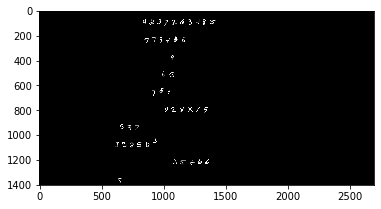

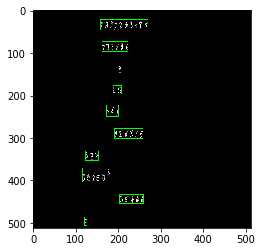

 44%|████▍     | 221/500 [06:42<06:30,  1.40s/it]

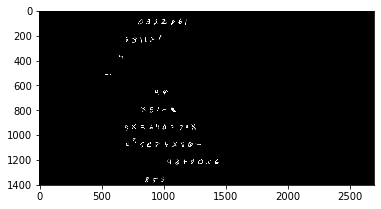

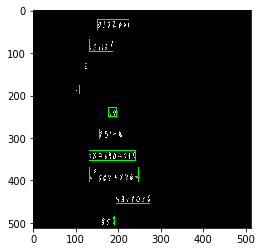

 44%|████▍     | 222/500 [06:43<06:41,  1.44s/it]

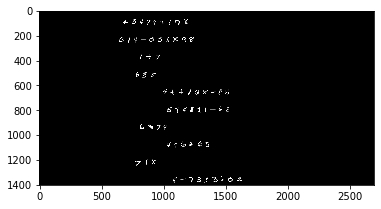

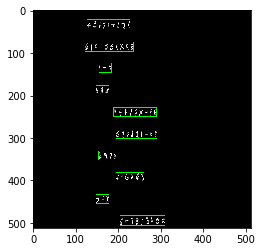

 45%|████▍     | 223/500 [06:45<06:20,  1.37s/it]

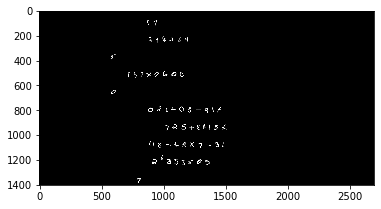

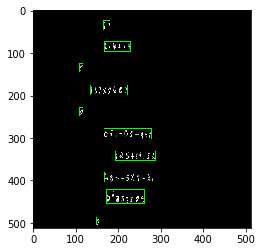

 45%|████▍     | 224/500 [06:46<06:22,  1.38s/it]

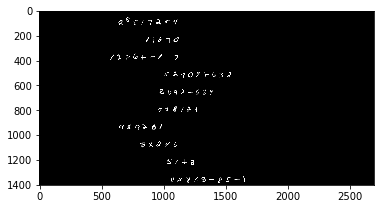

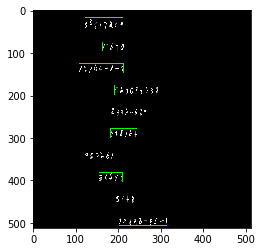

 45%|████▌     | 225/500 [06:47<06:13,  1.36s/it]

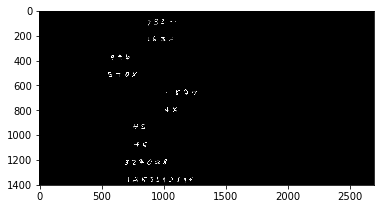

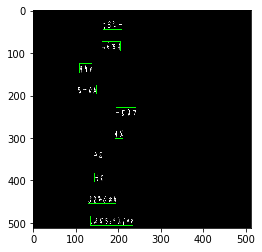

 45%|████▌     | 226/500 [06:49<06:17,  1.38s/it]

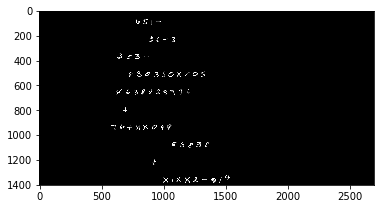

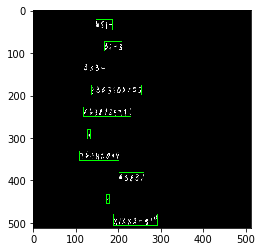

 45%|████▌     | 227/500 [06:50<06:06,  1.34s/it]

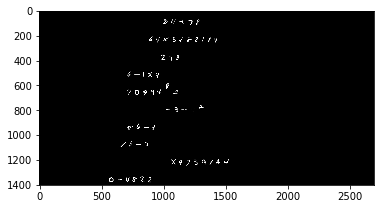

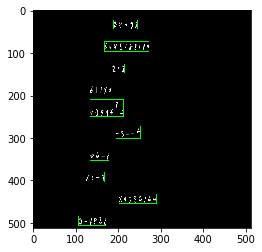

 46%|████▌     | 228/500 [06:51<06:05,  1.34s/it]

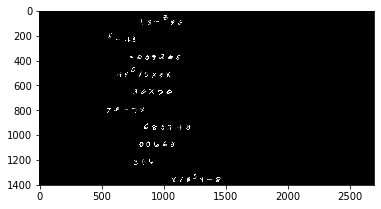

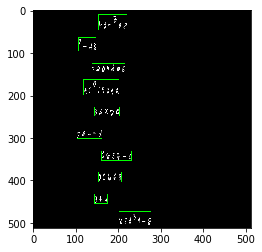

 46%|████▌     | 229/500 [06:53<06:33,  1.45s/it]

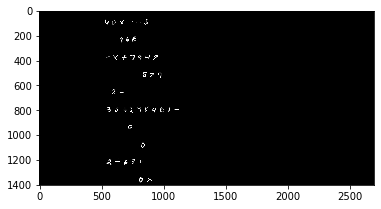

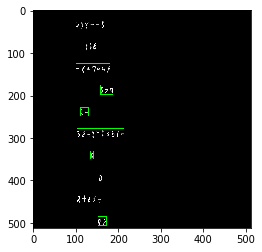

 46%|████▌     | 230/500 [06:54<06:23,  1.42s/it]

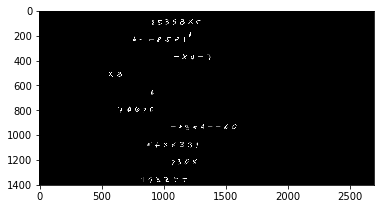

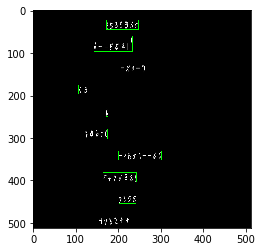

 46%|████▌     | 231/500 [06:56<06:18,  1.41s/it]

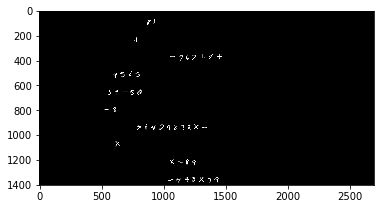

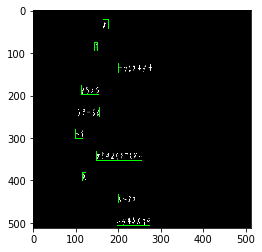

 46%|████▋     | 232/500 [06:57<06:25,  1.44s/it]

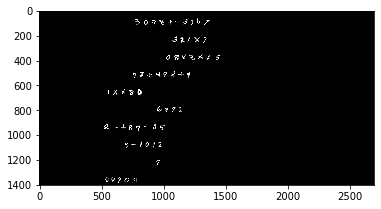

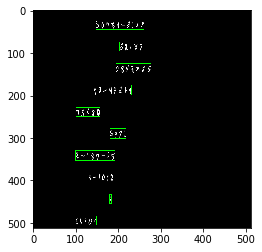

 47%|████▋     | 233/500 [06:59<06:16,  1.41s/it]

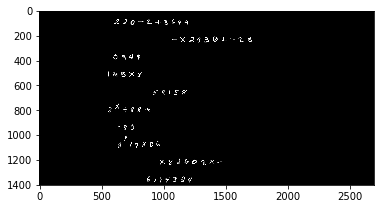

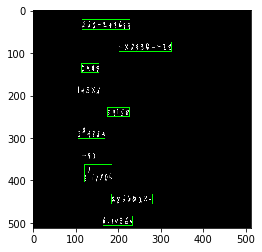

 47%|████▋     | 234/500 [07:01<06:47,  1.53s/it]

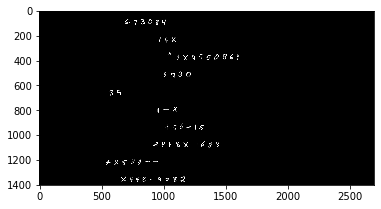

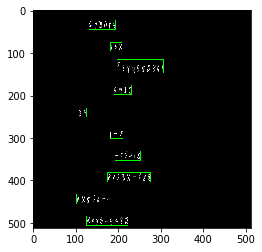

 47%|████▋     | 235/500 [07:02<07:10,  1.62s/it]

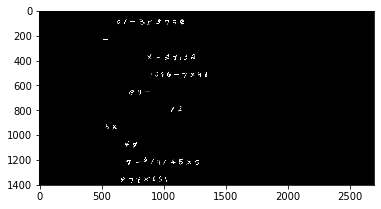

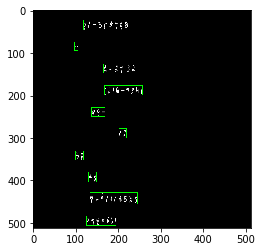

 47%|████▋     | 236/500 [07:04<06:53,  1.57s/it]

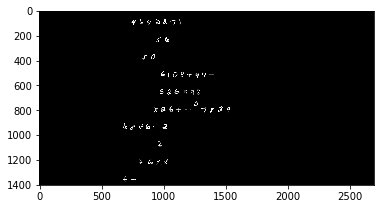

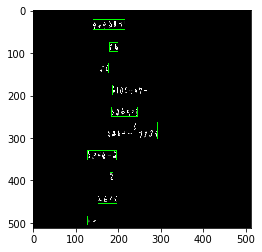

 47%|████▋     | 237/500 [07:05<06:43,  1.53s/it]

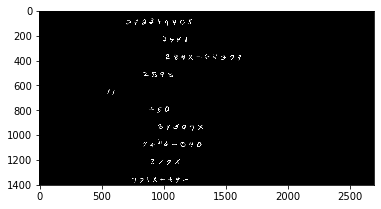

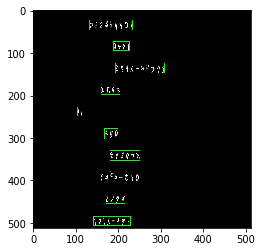

 48%|████▊     | 238/500 [07:07<06:27,  1.48s/it]

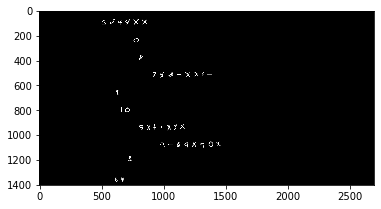

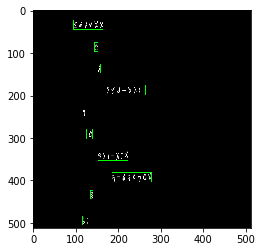

 48%|████▊     | 239/500 [07:08<06:55,  1.59s/it]

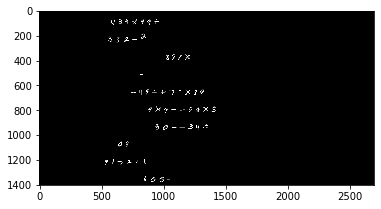

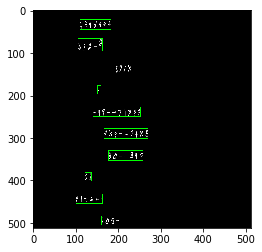

 48%|████▊     | 240/500 [07:10<06:40,  1.54s/it]

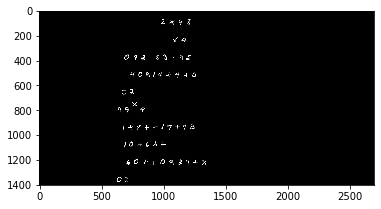

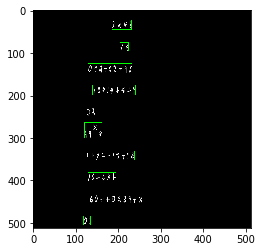

 48%|████▊     | 241/500 [07:11<06:27,  1.50s/it]

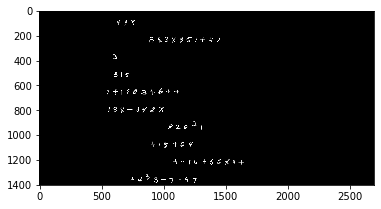

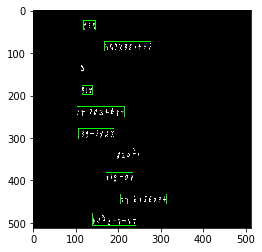

 48%|████▊     | 242/500 [07:13<06:45,  1.57s/it]

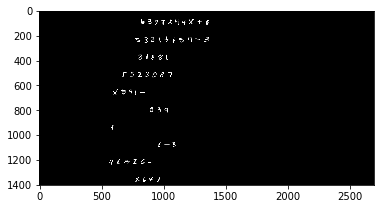

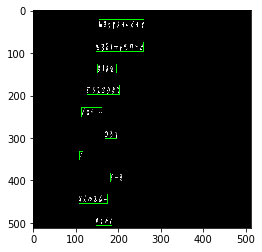

 49%|████▊     | 243/500 [07:14<06:26,  1.50s/it]

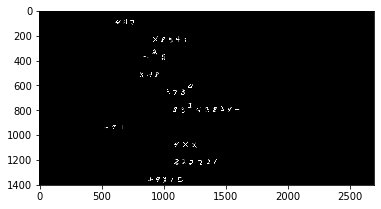

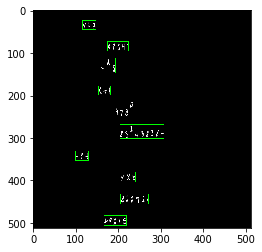

 49%|████▉     | 244/500 [07:16<06:15,  1.47s/it]

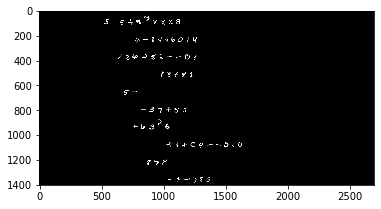

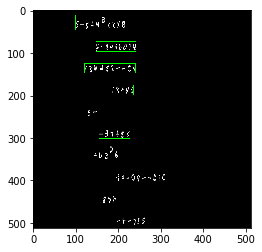

 49%|████▉     | 245/500 [07:17<06:00,  1.41s/it]

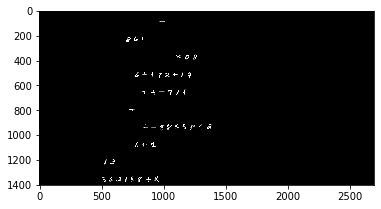

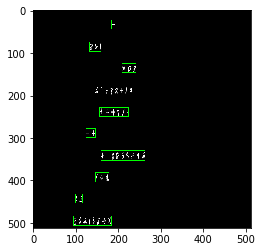

 49%|████▉     | 246/500 [07:18<05:53,  1.39s/it]

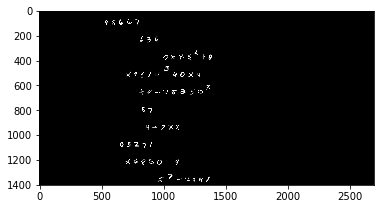

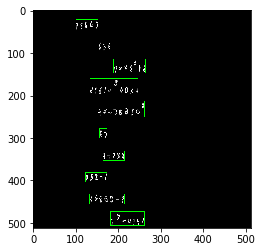

 49%|████▉     | 247/500 [07:20<05:59,  1.42s/it]

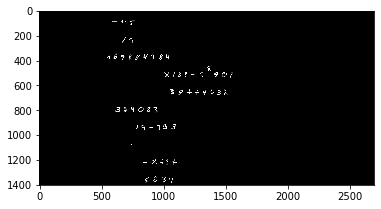

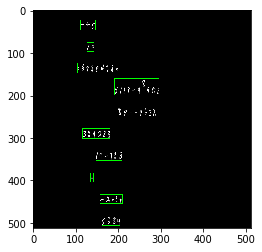

 50%|████▉     | 248/500 [07:21<05:53,  1.40s/it]

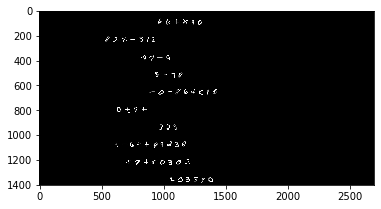

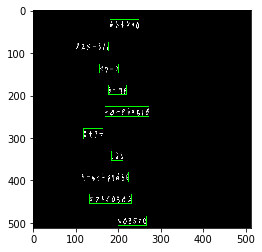

 50%|████▉     | 249/500 [07:23<05:59,  1.43s/it]

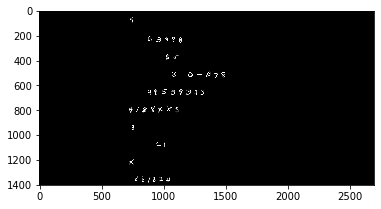

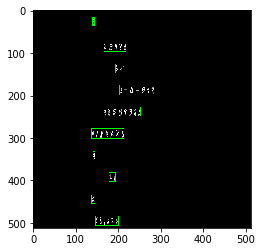

 50%|█████     | 250/500 [07:24<05:51,  1.40s/it]

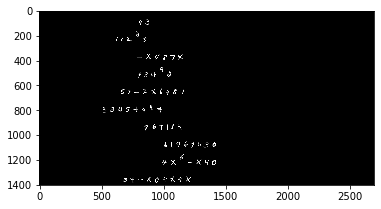

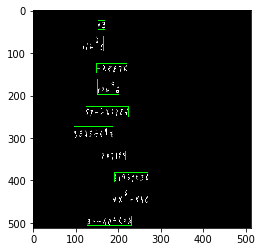

 50%|█████     | 251/500 [07:25<05:50,  1.41s/it]

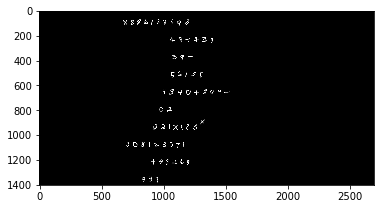

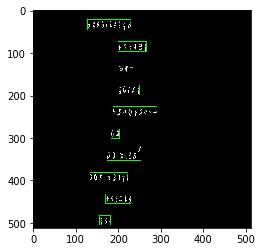

 50%|█████     | 252/500 [07:27<05:55,  1.43s/it]

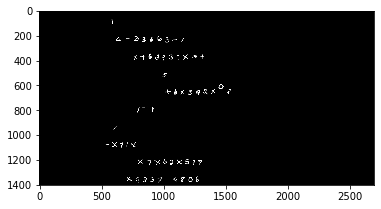

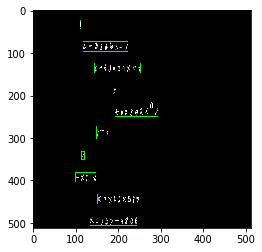

 51%|█████     | 253/500 [07:29<06:00,  1.46s/it]

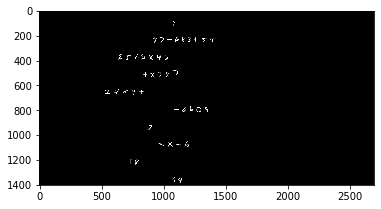

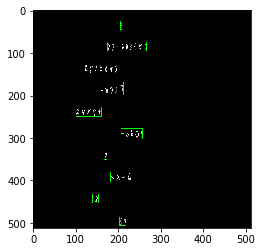

 51%|█████     | 254/500 [07:30<05:54,  1.44s/it]

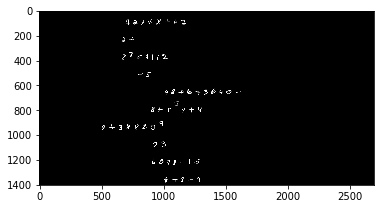

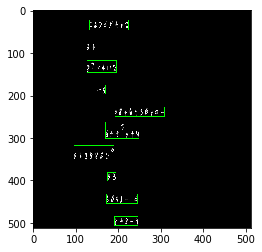

 51%|█████     | 255/500 [07:33<07:46,  1.90s/it]

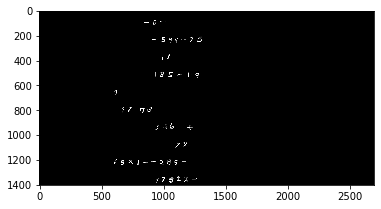

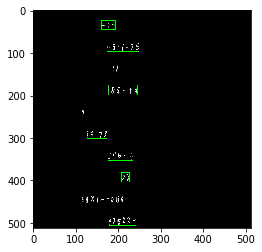

 51%|█████     | 256/500 [07:35<07:26,  1.83s/it]

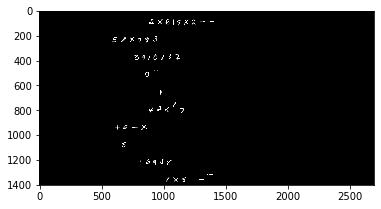

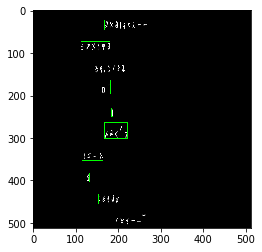

 51%|█████▏    | 257/500 [07:36<06:43,  1.66s/it]

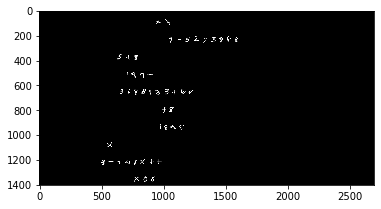

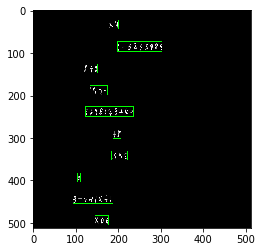

 52%|█████▏    | 258/500 [07:37<06:23,  1.58s/it]

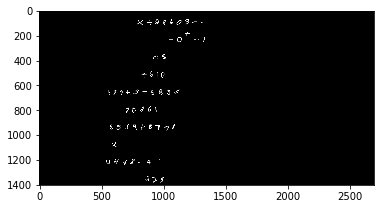

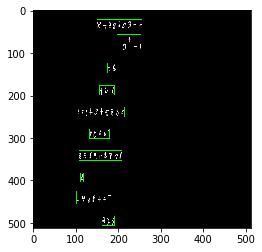

 52%|█████▏    | 259/500 [07:39<06:04,  1.51s/it]

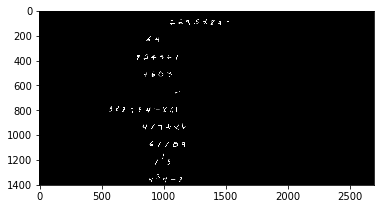

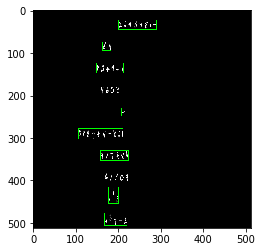

 52%|█████▏    | 260/500 [07:40<05:48,  1.45s/it]

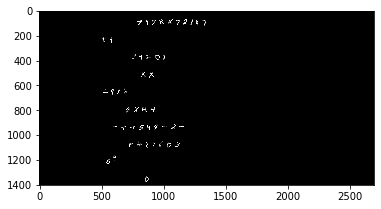

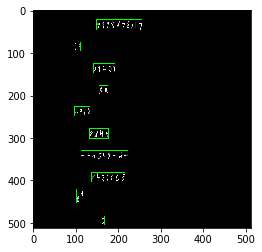

 52%|█████▏    | 261/500 [07:41<05:37,  1.41s/it]

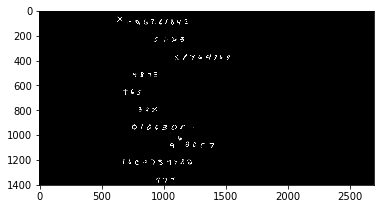

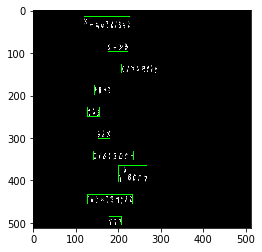

 52%|█████▏    | 262/500 [07:43<05:54,  1.49s/it]

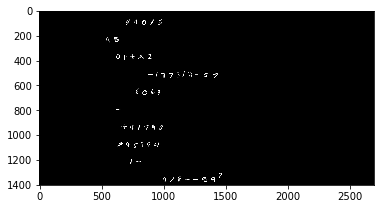

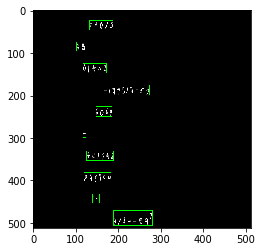

 53%|█████▎    | 263/500 [07:44<05:52,  1.49s/it]

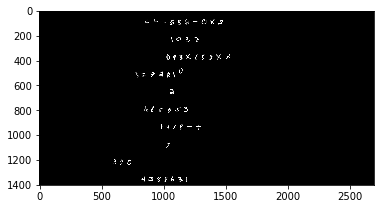

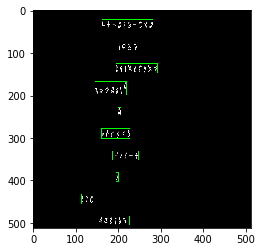

 53%|█████▎    | 264/500 [07:46<05:44,  1.46s/it]

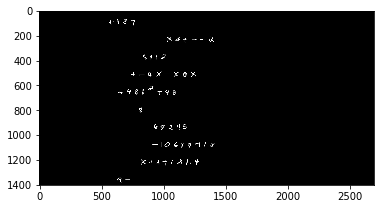

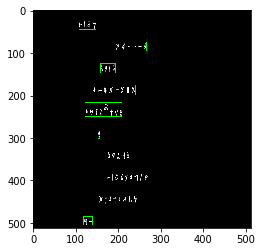

 53%|█████▎    | 265/500 [07:47<05:29,  1.40s/it]

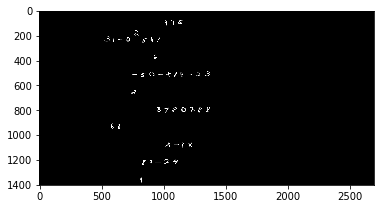

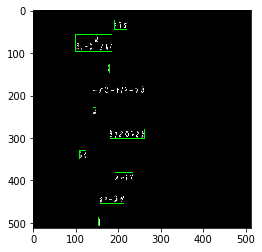

 53%|█████▎    | 266/500 [07:48<05:28,  1.40s/it]

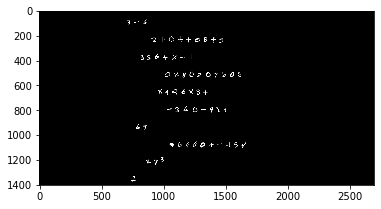

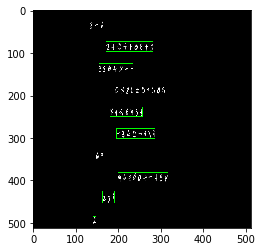

 53%|█████▎    | 267/500 [07:50<05:17,  1.36s/it]

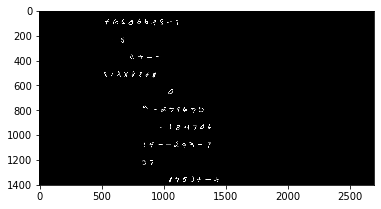

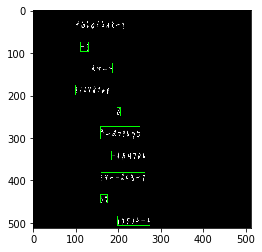

 54%|█████▎    | 268/500 [07:51<05:33,  1.44s/it]

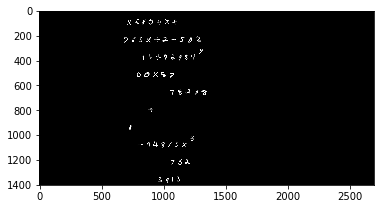

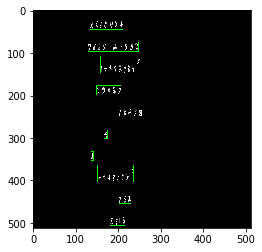

 54%|█████▍    | 269/500 [07:53<05:31,  1.43s/it]

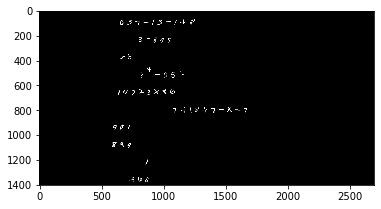

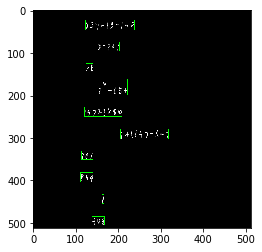

 54%|█████▍    | 270/500 [07:54<05:27,  1.42s/it]

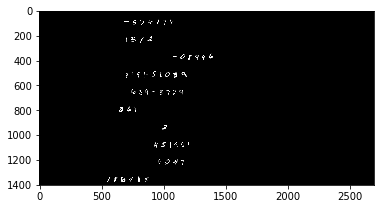

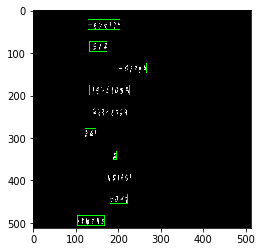

 54%|█████▍    | 271/500 [07:56<05:25,  1.42s/it]

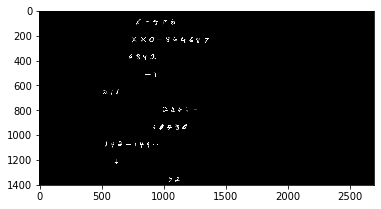

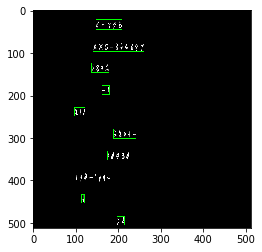

 54%|█████▍    | 272/500 [07:57<05:11,  1.37s/it]

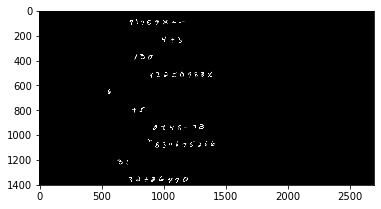

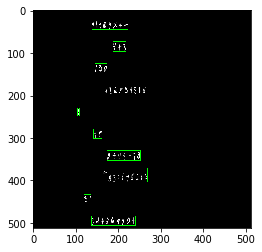

 55%|█████▍    | 273/500 [07:58<05:13,  1.38s/it]

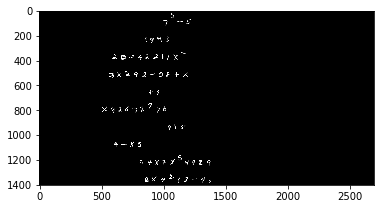

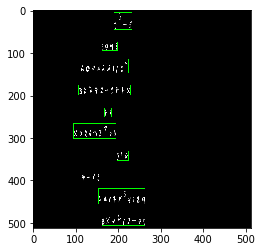

 55%|█████▍    | 274/500 [08:00<05:46,  1.53s/it]

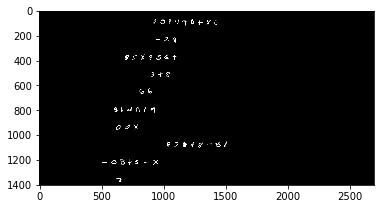

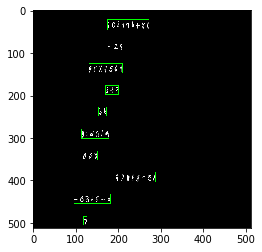

 55%|█████▌    | 275/500 [08:01<05:36,  1.49s/it]

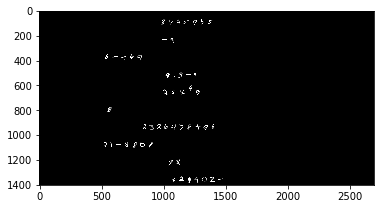

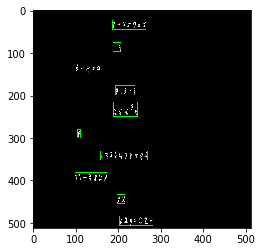

 55%|█████▌    | 276/500 [08:03<05:21,  1.43s/it]

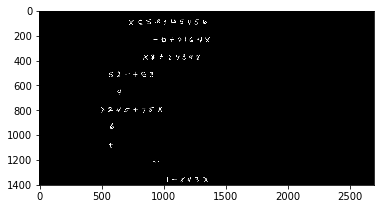

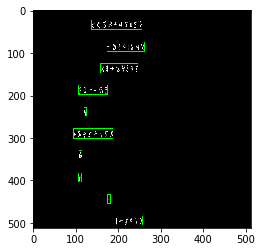

 55%|█████▌    | 277/500 [08:04<05:25,  1.46s/it]

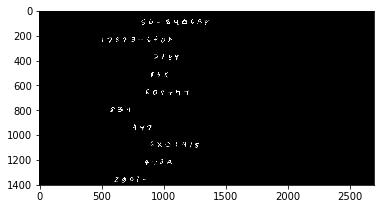

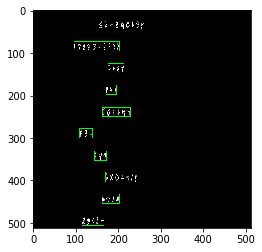

 56%|█████▌    | 278/500 [08:06<05:50,  1.58s/it]

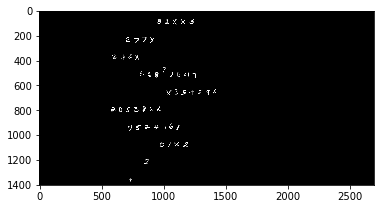

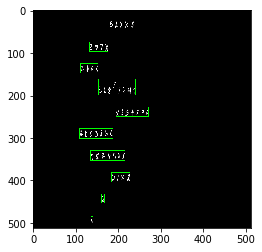

 56%|█████▌    | 279/500 [08:08<05:36,  1.52s/it]

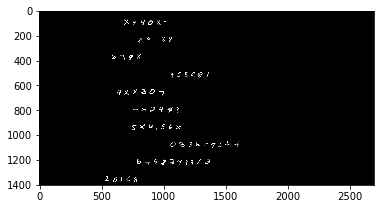

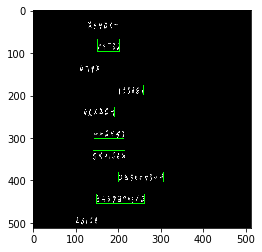

 56%|█████▌    | 280/500 [08:09<05:15,  1.43s/it]

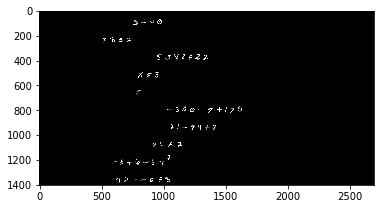

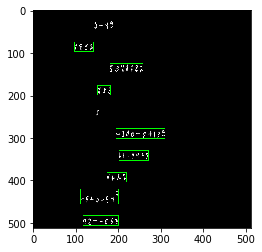

 56%|█████▌    | 281/500 [08:10<05:23,  1.48s/it]

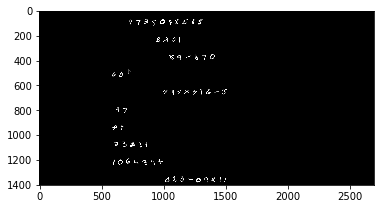

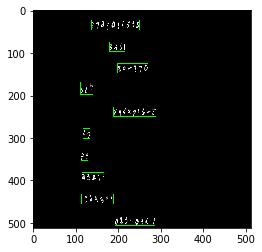

 56%|█████▋    | 282/500 [08:12<05:39,  1.56s/it]

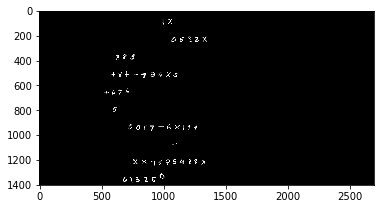

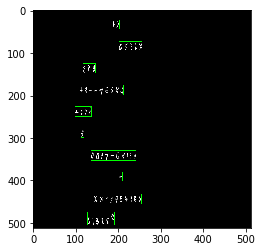

 57%|█████▋    | 283/500 [08:14<05:38,  1.56s/it]

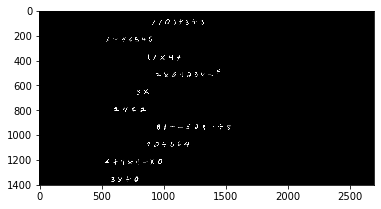

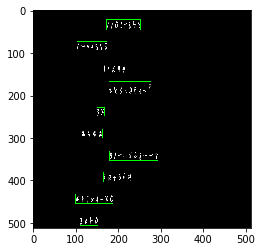

 57%|█████▋    | 284/500 [08:15<05:22,  1.49s/it]

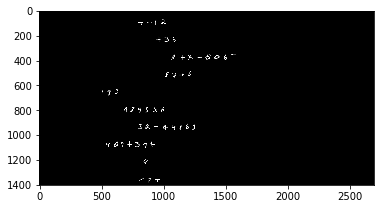

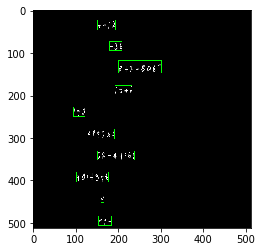

 57%|█████▋    | 285/500 [08:16<05:10,  1.45s/it]

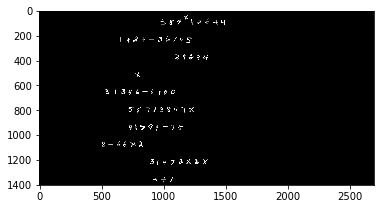

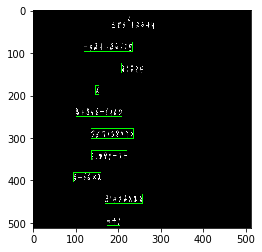

 57%|█████▋    | 286/500 [08:18<05:05,  1.43s/it]

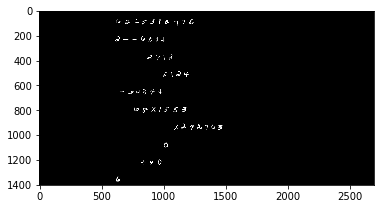

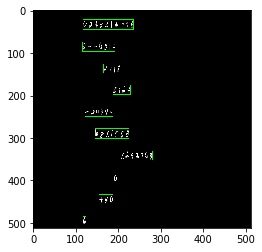

 57%|█████▋    | 287/500 [08:19<05:04,  1.43s/it]

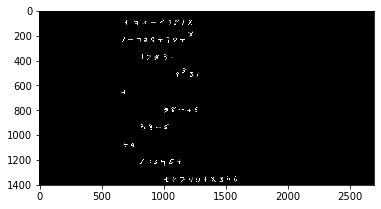

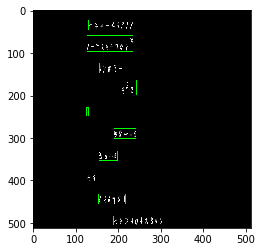

 58%|█████▊    | 288/500 [08:21<05:05,  1.44s/it]

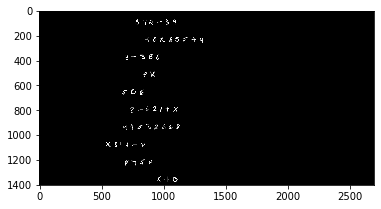

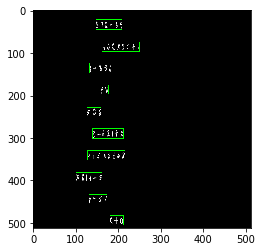

 58%|█████▊    | 289/500 [08:22<05:00,  1.42s/it]

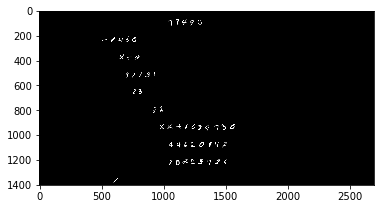

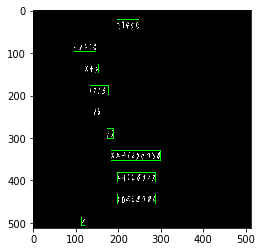

 58%|█████▊    | 290/500 [08:23<05:02,  1.44s/it]

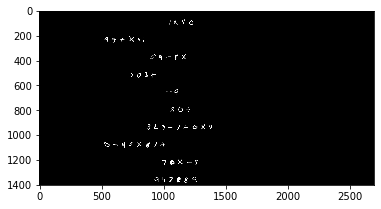

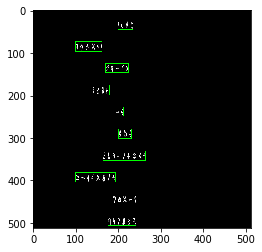

 58%|█████▊    | 291/500 [08:25<04:57,  1.42s/it]

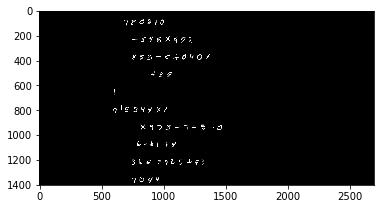

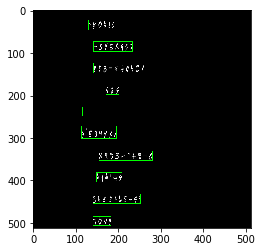

 58%|█████▊    | 292/500 [08:26<04:49,  1.39s/it]

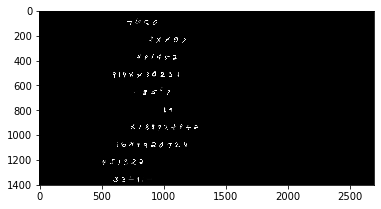

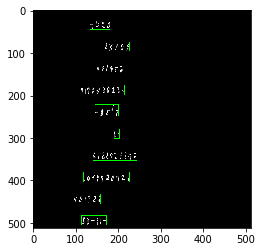

 59%|█████▊    | 293/500 [08:27<04:40,  1.36s/it]

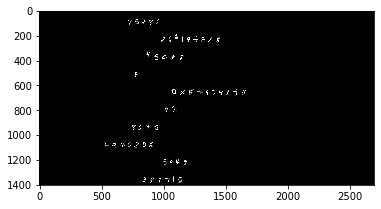

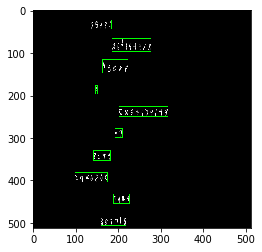

 59%|█████▉    | 294/500 [08:29<04:50,  1.41s/it]

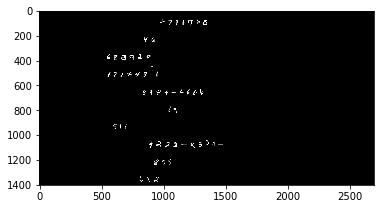

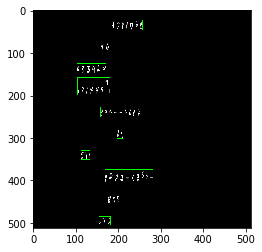

 59%|█████▉    | 295/500 [08:30<04:52,  1.43s/it]

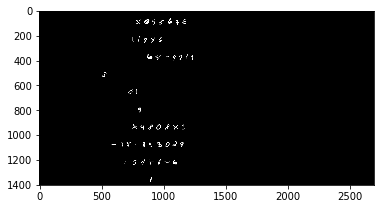

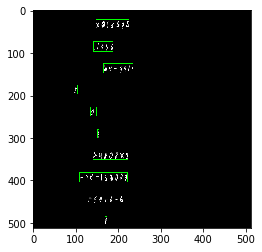

 59%|█████▉    | 296/500 [08:32<04:45,  1.40s/it]

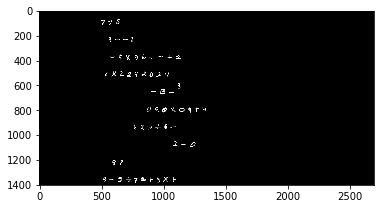

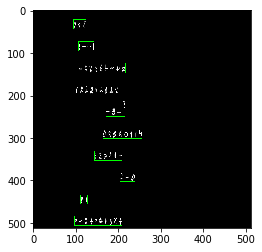

 59%|█████▉    | 297/500 [08:33<04:45,  1.41s/it]

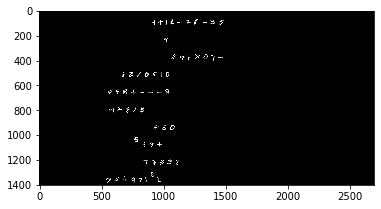

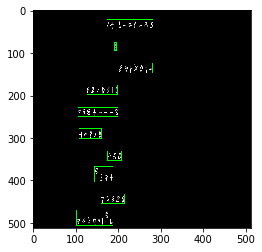

 60%|█████▉    | 298/500 [08:35<04:41,  1.39s/it]

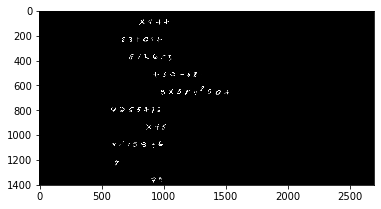

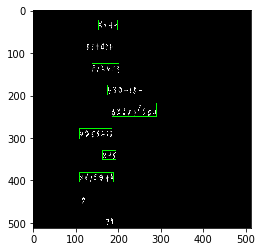

 60%|█████▉    | 299/500 [08:36<04:48,  1.44s/it]

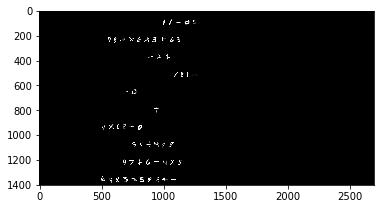

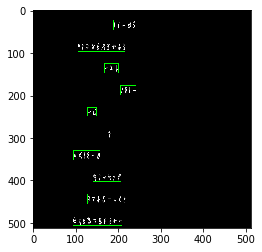

 60%|██████    | 300/500 [08:37<04:42,  1.41s/it]

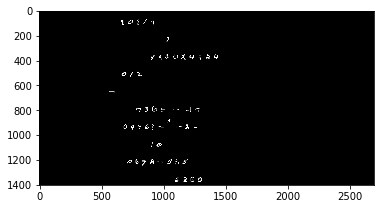

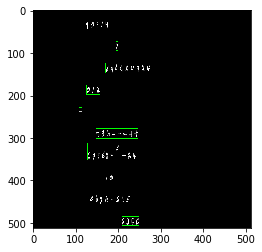

 60%|██████    | 301/500 [08:39<04:40,  1.41s/it]

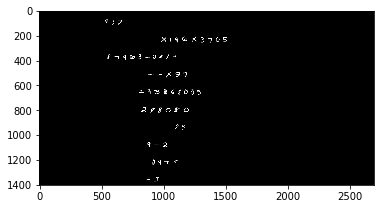

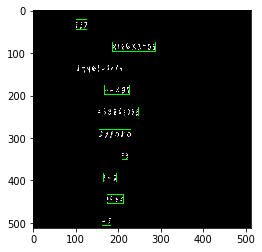

 60%|██████    | 302/500 [08:40<04:39,  1.41s/it]

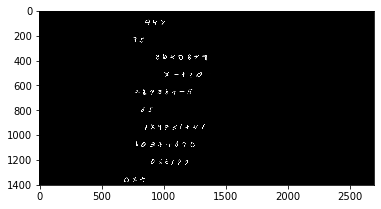

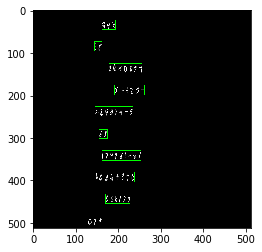

 61%|██████    | 303/500 [08:42<04:51,  1.48s/it]

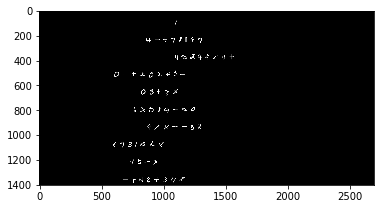

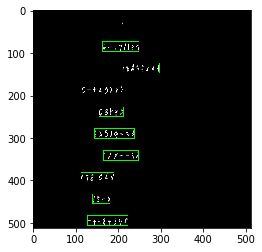

 61%|██████    | 304/500 [08:43<04:47,  1.46s/it]

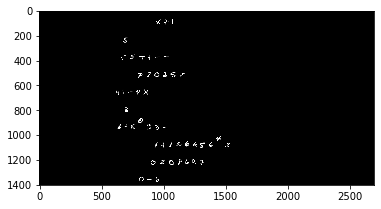

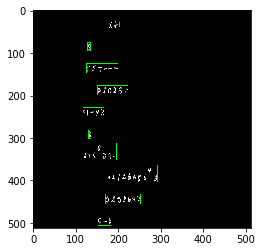

 61%|██████    | 305/500 [08:45<04:35,  1.42s/it]

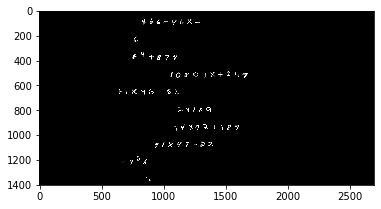

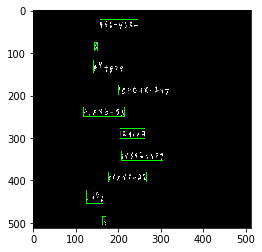

 61%|██████    | 306/500 [08:46<04:32,  1.41s/it]

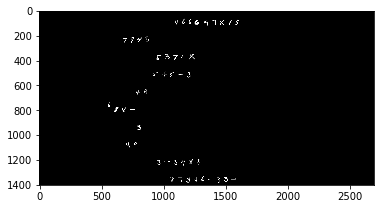

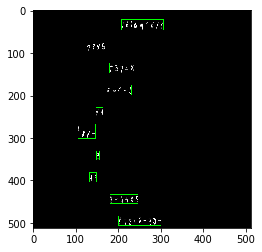

 61%|██████▏   | 307/500 [08:47<04:26,  1.38s/it]

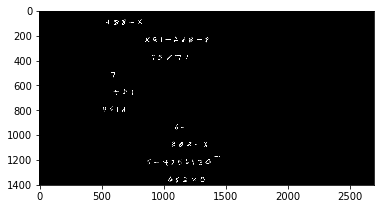

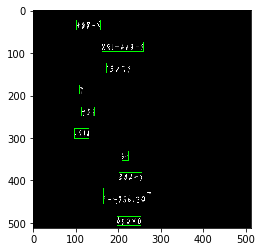

 62%|██████▏   | 308/500 [08:49<04:23,  1.37s/it]

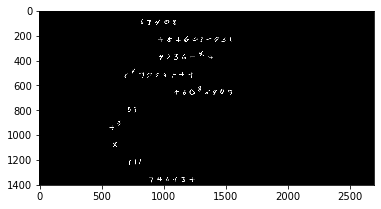

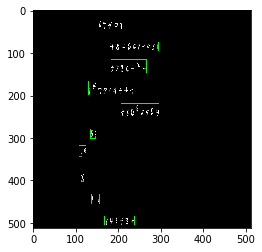

 62%|██████▏   | 309/500 [08:50<04:34,  1.44s/it]

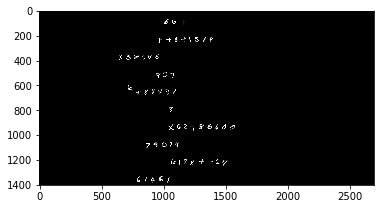

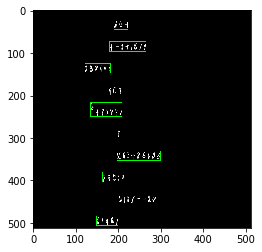

 62%|██████▏   | 310/500 [08:52<04:29,  1.42s/it]

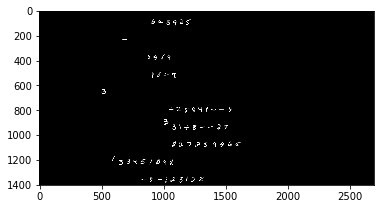

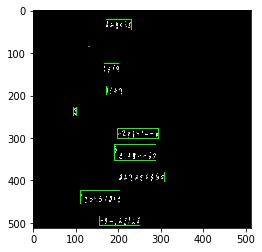

 62%|██████▏   | 311/500 [08:53<04:26,  1.41s/it]

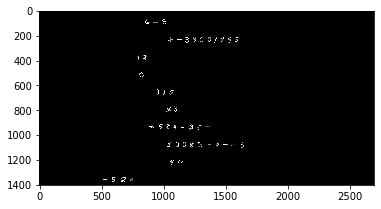

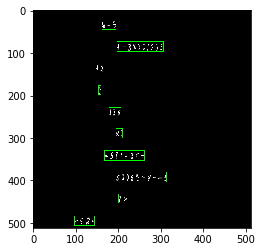

 62%|██████▏   | 312/500 [08:55<04:32,  1.45s/it]

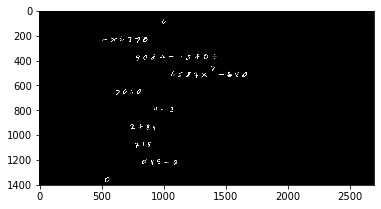

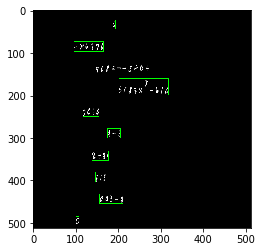

 63%|██████▎   | 313/500 [08:56<04:28,  1.43s/it]

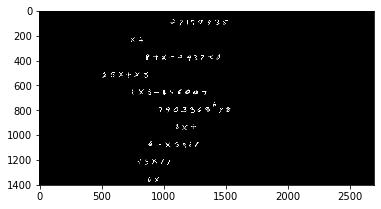

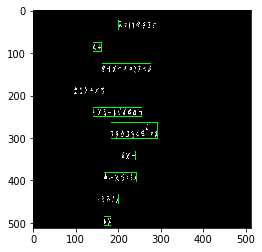

 63%|██████▎   | 314/500 [08:57<04:25,  1.43s/it]

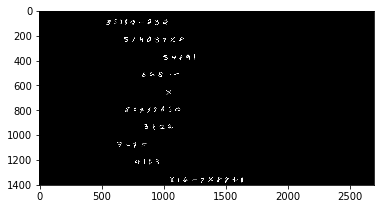

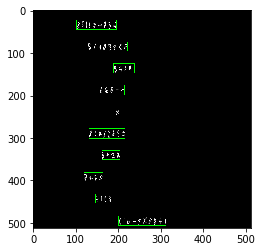

 63%|██████▎   | 315/500 [08:59<04:27,  1.44s/it]

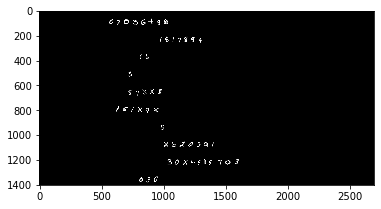

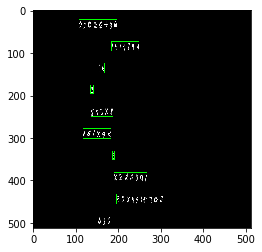

 63%|██████▎   | 316/500 [09:01<04:42,  1.53s/it]

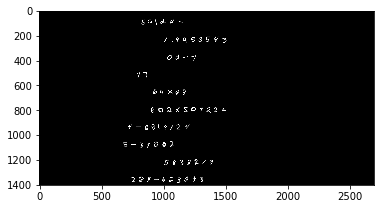

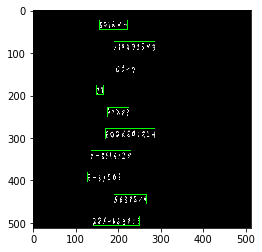

 63%|██████▎   | 317/500 [09:02<04:30,  1.48s/it]

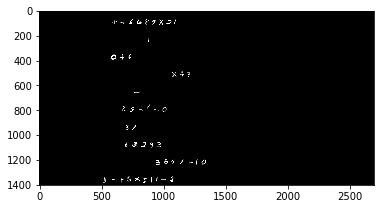

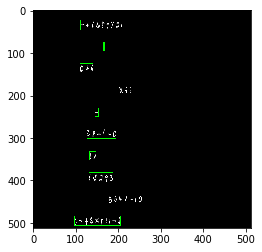

 64%|██████▎   | 318/500 [09:03<04:22,  1.44s/it]

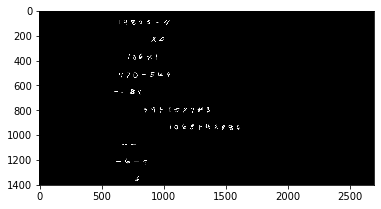

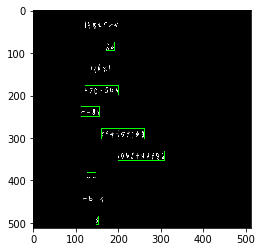

 64%|██████▍   | 319/500 [09:05<04:17,  1.42s/it]

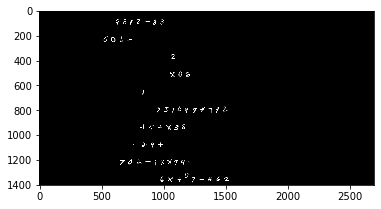

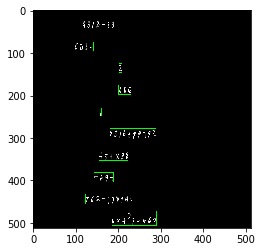

 64%|██████▍   | 320/500 [09:06<04:11,  1.40s/it]

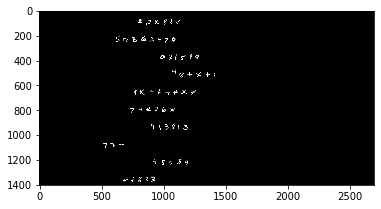

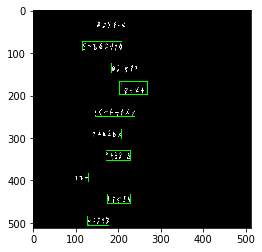

 64%|██████▍   | 321/500 [09:07<04:09,  1.40s/it]

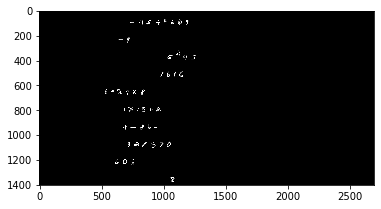

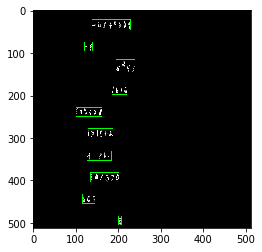

 64%|██████▍   | 322/500 [09:09<04:23,  1.48s/it]

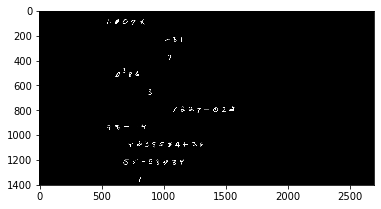

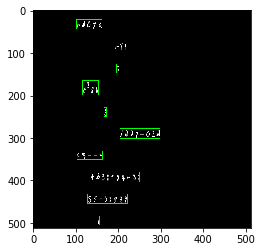

 65%|██████▍   | 323/500 [09:10<04:10,  1.41s/it]

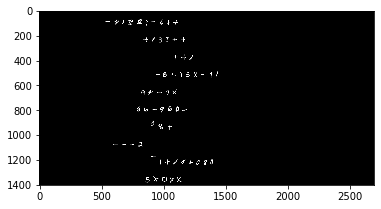

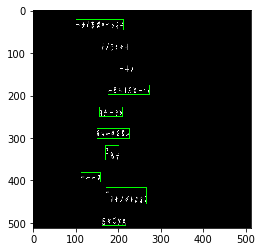

 65%|██████▍   | 324/500 [09:12<04:03,  1.38s/it]

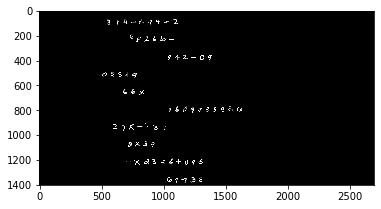

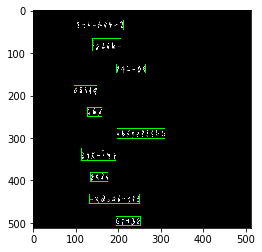

 65%|██████▌   | 325/500 [09:13<04:19,  1.48s/it]

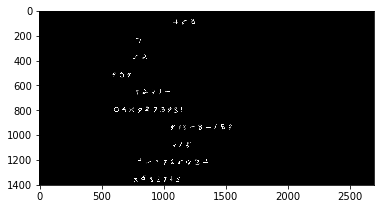

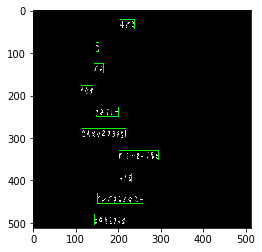

 65%|██████▌   | 326/500 [09:15<04:07,  1.42s/it]

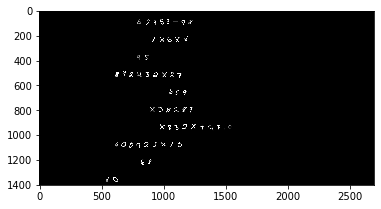

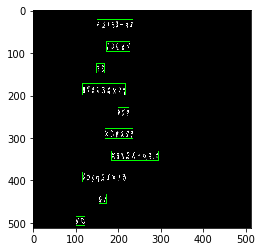

 65%|██████▌   | 327/500 [09:16<04:01,  1.39s/it]

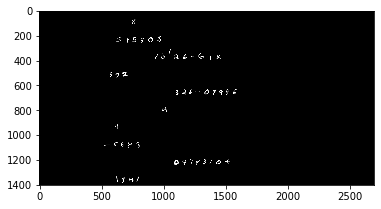

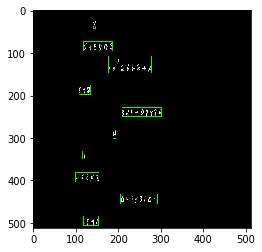

 66%|██████▌   | 328/500 [09:18<04:06,  1.43s/it]

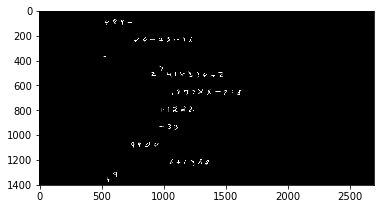

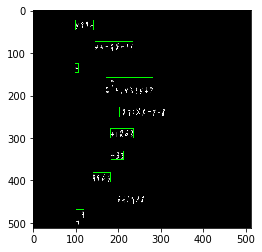

 66%|██████▌   | 329/500 [09:19<03:56,  1.38s/it]

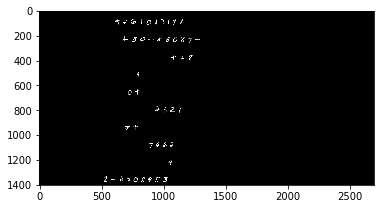

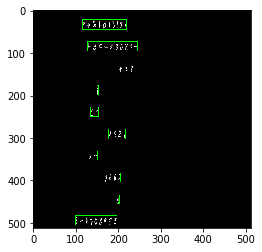

 66%|██████▌   | 330/500 [09:20<03:54,  1.38s/it]

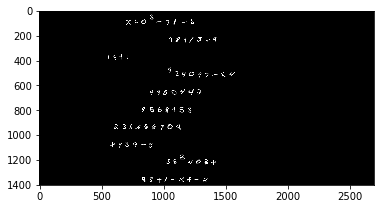

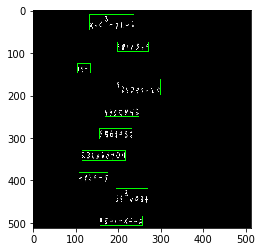

 66%|██████▌   | 331/500 [09:22<03:51,  1.37s/it]

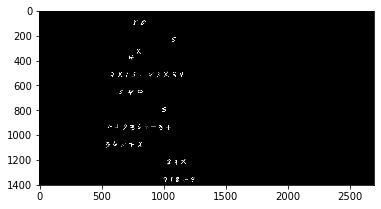

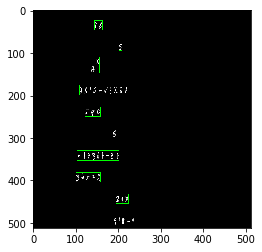

 66%|██████▋   | 332/500 [09:23<03:50,  1.37s/it]

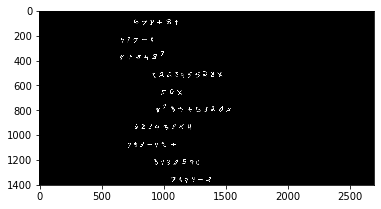

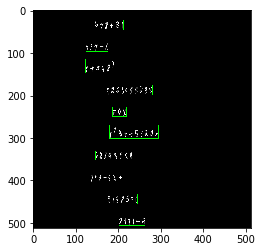

 67%|██████▋   | 333/500 [09:24<03:53,  1.40s/it]

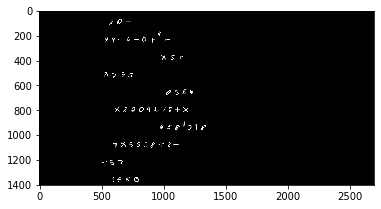

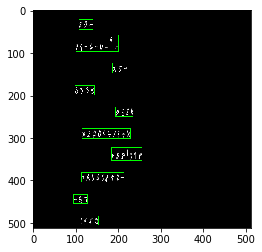

 67%|██████▋   | 334/500 [09:26<03:45,  1.36s/it]

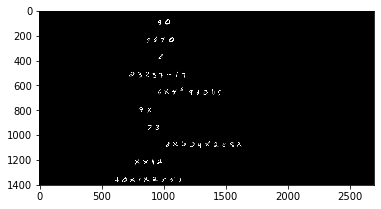

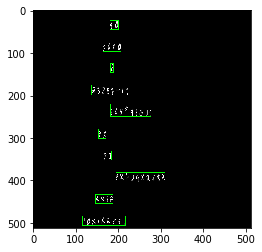

 67%|██████▋   | 335/500 [09:27<03:44,  1.36s/it]

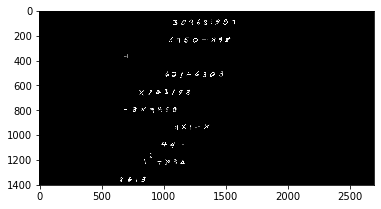

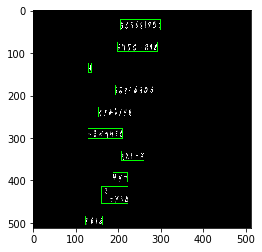

 67%|██████▋   | 336/500 [09:29<03:49,  1.40s/it]

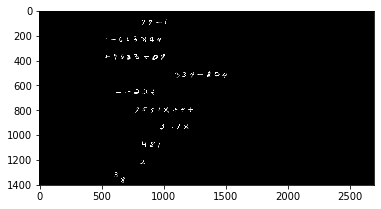

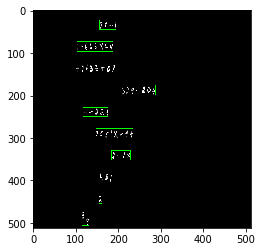

 67%|██████▋   | 337/500 [09:30<03:42,  1.37s/it]

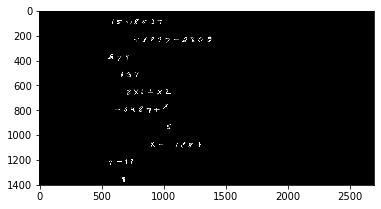

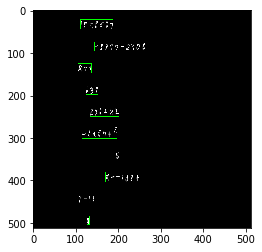

 68%|██████▊   | 338/500 [09:31<03:44,  1.39s/it]

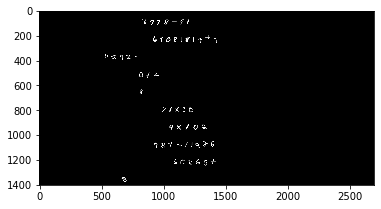

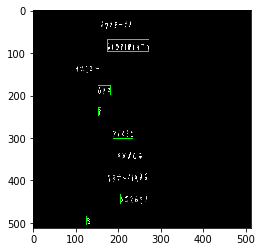

 68%|██████▊   | 339/500 [09:33<03:51,  1.44s/it]

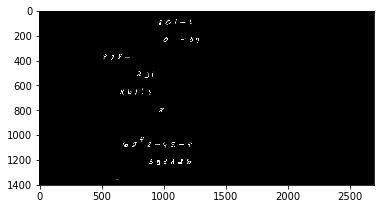

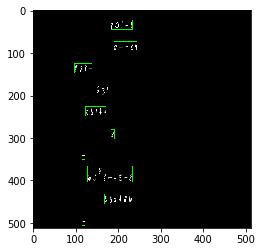

 68%|██████▊   | 340/500 [09:34<03:54,  1.47s/it]

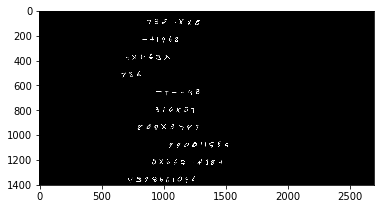

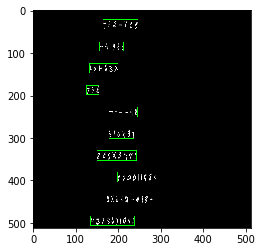

 68%|██████▊   | 341/500 [09:36<03:56,  1.49s/it]

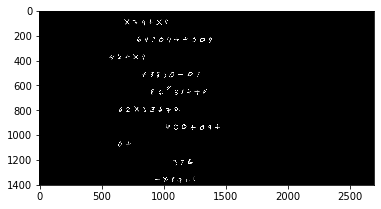

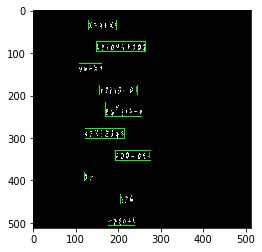

 68%|██████▊   | 342/500 [09:37<03:47,  1.44s/it]

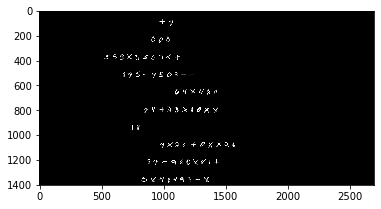

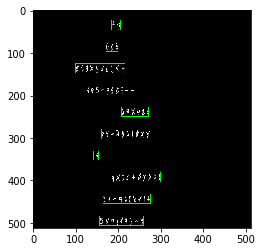

 69%|██████▊   | 343/500 [09:38<03:39,  1.40s/it]

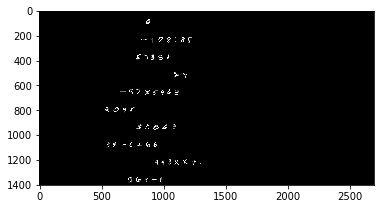

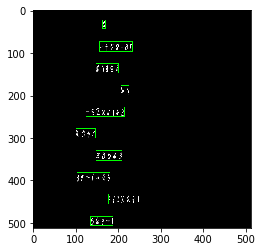

 69%|██████▉   | 344/500 [09:40<03:37,  1.40s/it]

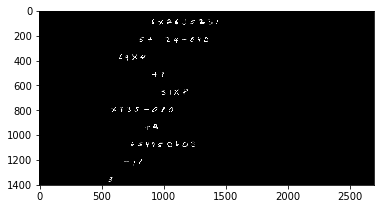

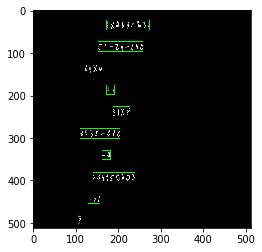

 69%|██████▉   | 345/500 [09:41<03:27,  1.34s/it]

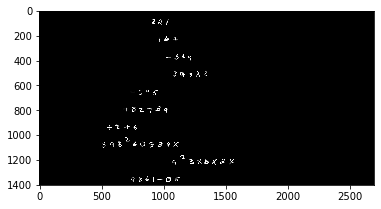

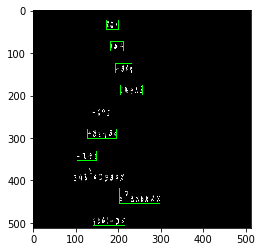

 69%|██████▉   | 346/500 [09:42<03:25,  1.34s/it]

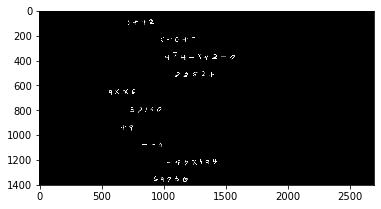

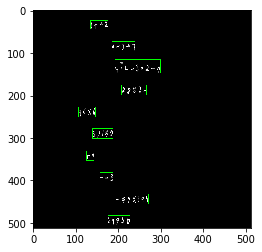

 69%|██████▉   | 347/500 [09:44<03:24,  1.34s/it]

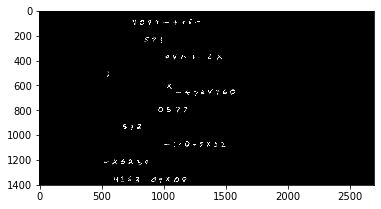

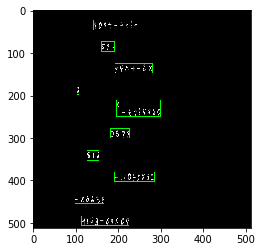

 70%|██████▉   | 348/500 [09:45<03:27,  1.36s/it]

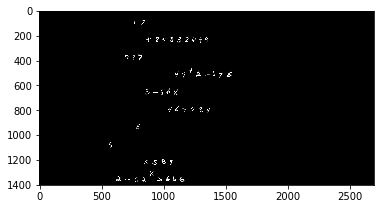

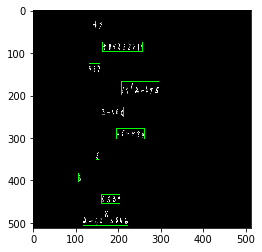

 70%|██████▉   | 349/500 [09:47<03:28,  1.38s/it]

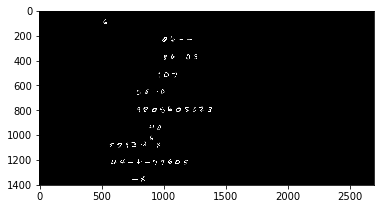

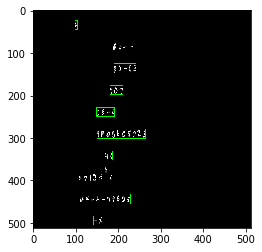

 70%|███████   | 350/500 [09:48<03:28,  1.39s/it]

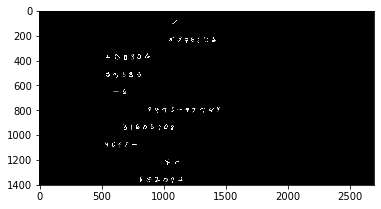

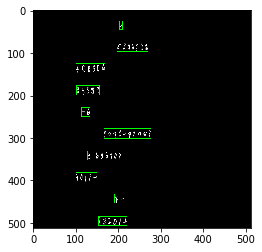

 70%|███████   | 351/500 [09:49<03:23,  1.36s/it]

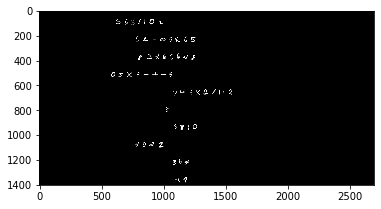

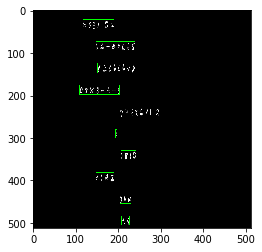

 70%|███████   | 352/500 [09:51<03:21,  1.36s/it]

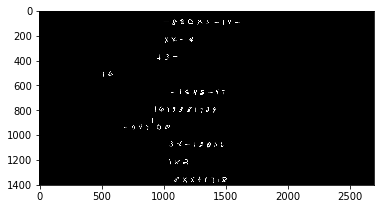

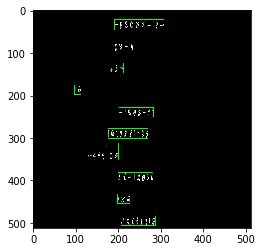

 71%|███████   | 353/500 [09:52<03:18,  1.35s/it]

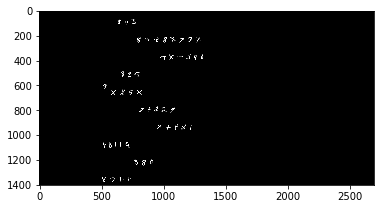

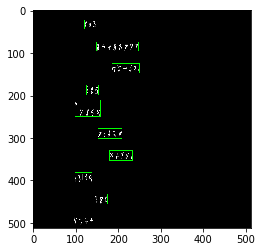

 71%|███████   | 354/500 [09:53<03:15,  1.34s/it]

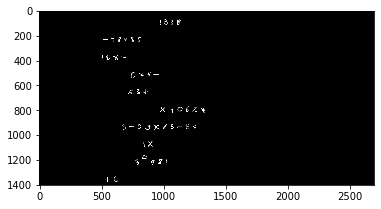

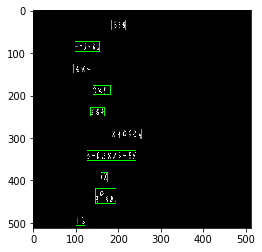

 71%|███████   | 355/500 [09:55<03:16,  1.36s/it]

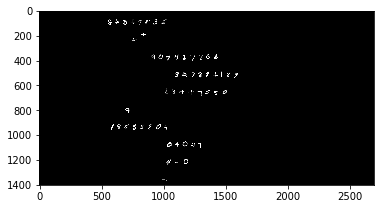

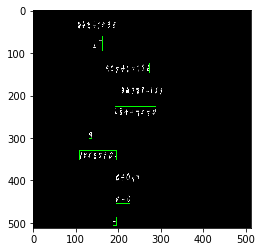

 71%|███████   | 356/500 [09:56<03:30,  1.46s/it]

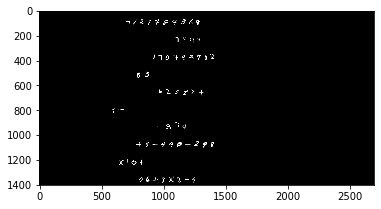

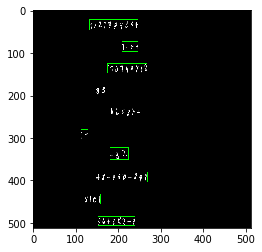

 71%|███████▏  | 357/500 [09:58<03:19,  1.40s/it]

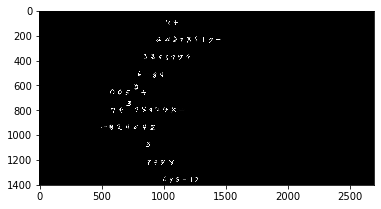

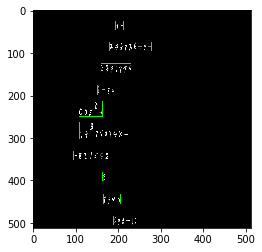

 72%|███████▏  | 358/500 [09:59<03:13,  1.37s/it]

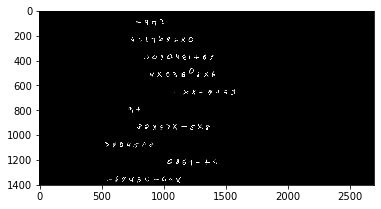

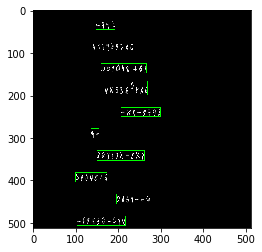

 72%|███████▏  | 359/500 [10:00<03:06,  1.32s/it]

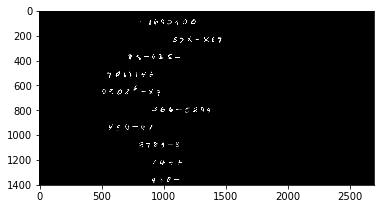

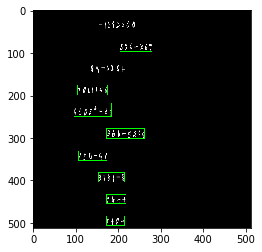

 72%|███████▏  | 360/500 [10:02<03:06,  1.33s/it]

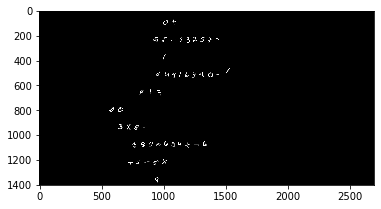

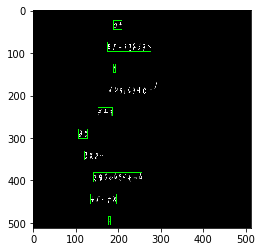

 72%|███████▏  | 361/500 [10:03<03:06,  1.34s/it]

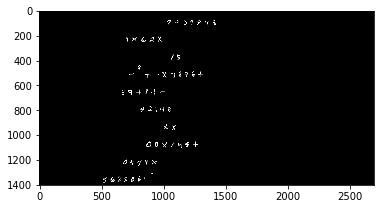

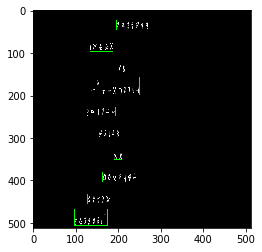

 72%|███████▏  | 362/500 [10:04<03:05,  1.35s/it]

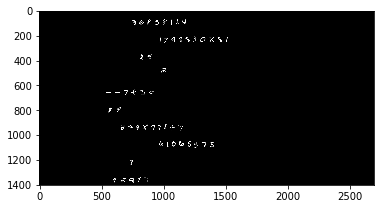

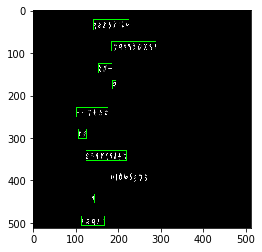

 73%|███████▎  | 363/500 [10:06<03:00,  1.32s/it]

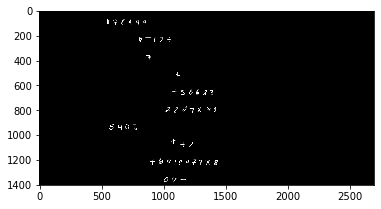

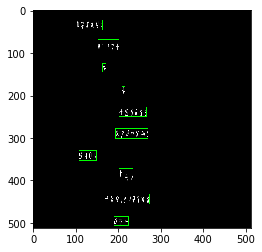

 73%|███████▎  | 364/500 [10:07<03:00,  1.32s/it]

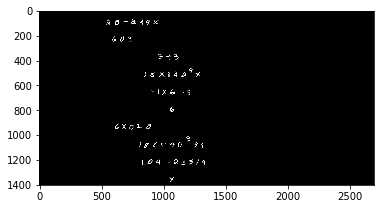

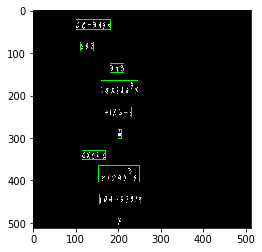

 73%|███████▎  | 365/500 [10:08<03:03,  1.36s/it]

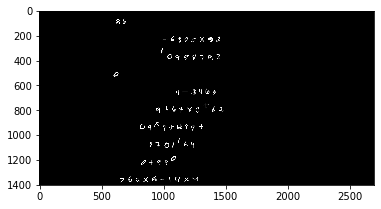

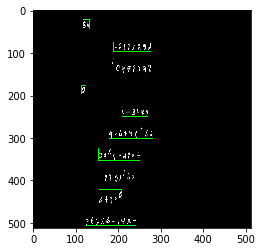

 73%|███████▎  | 366/500 [10:10<03:01,  1.35s/it]

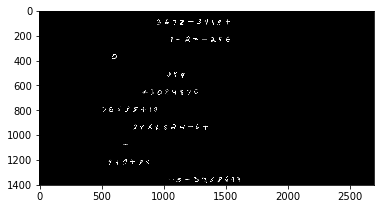

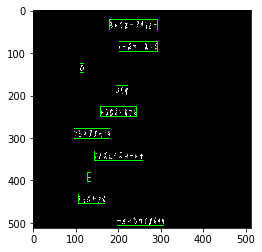

 73%|███████▎  | 367/500 [10:11<03:01,  1.36s/it]

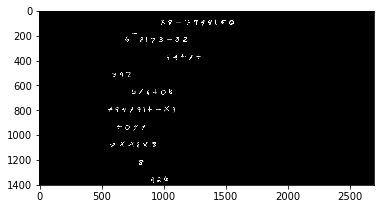

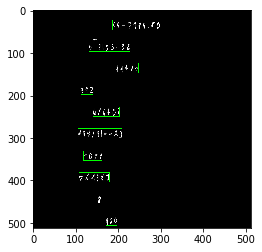

 74%|███████▎  | 368/500 [10:13<03:06,  1.41s/it]

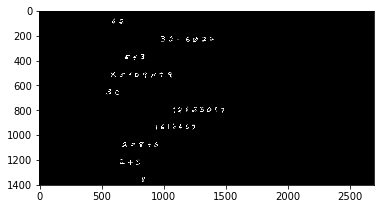

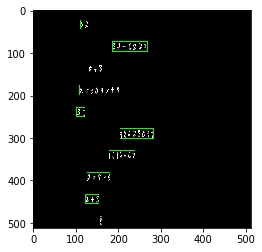

 74%|███████▍  | 369/500 [10:14<03:07,  1.43s/it]

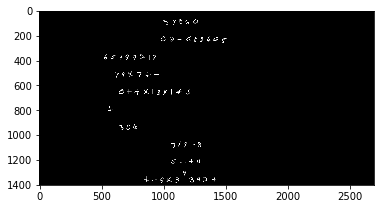

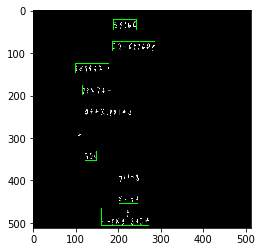

 74%|███████▍  | 370/500 [10:15<03:03,  1.41s/it]

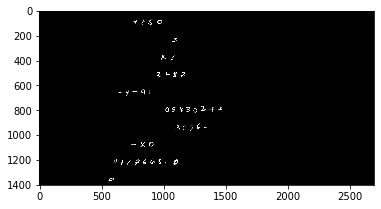

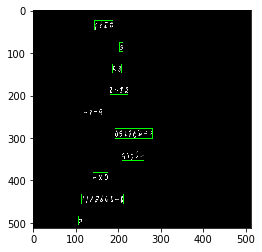

 74%|███████▍  | 371/500 [10:17<03:02,  1.42s/it]

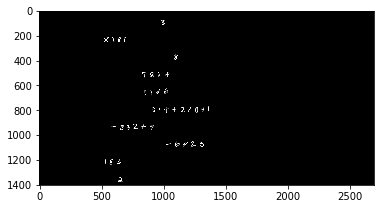

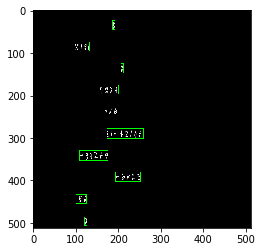

 74%|███████▍  | 372/500 [10:18<03:09,  1.48s/it]

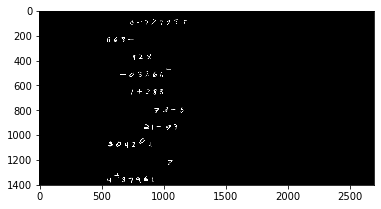

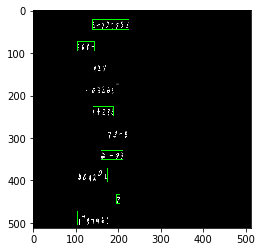

 75%|███████▍  | 373/500 [10:20<03:06,  1.47s/it]

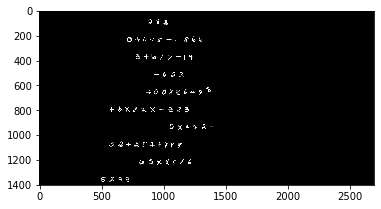

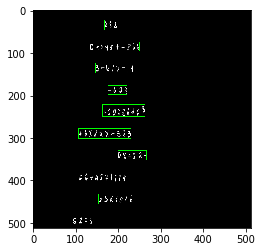

 75%|███████▍  | 374/500 [10:22<03:13,  1.53s/it]

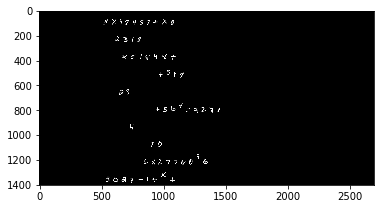

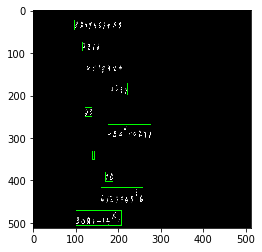

 75%|███████▌  | 375/500 [10:23<03:03,  1.47s/it]

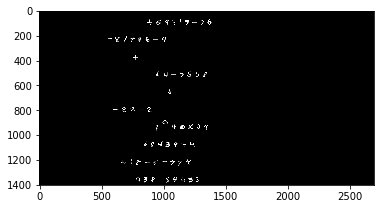

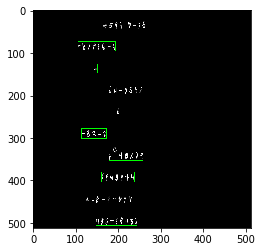

 75%|███████▌  | 376/500 [10:24<03:03,  1.48s/it]

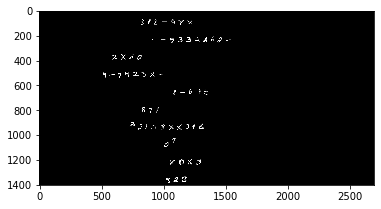

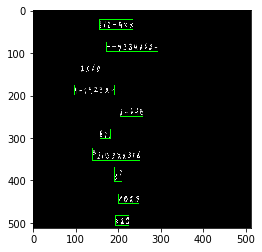

 75%|███████▌  | 377/500 [10:26<02:54,  1.42s/it]

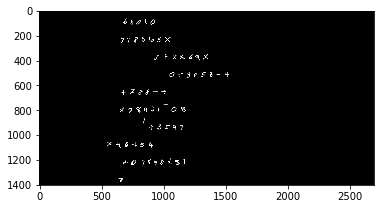

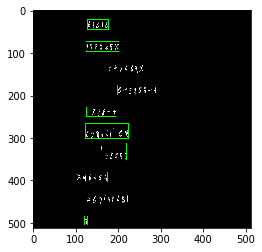

 76%|███████▌  | 378/500 [10:27<02:55,  1.44s/it]

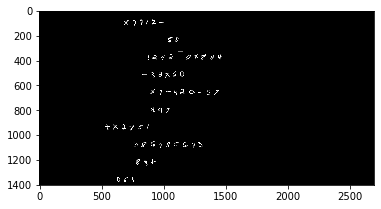

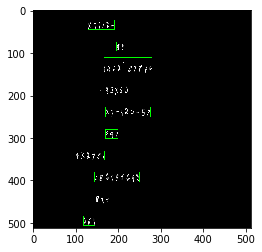

 76%|███████▌  | 379/500 [10:28<02:50,  1.41s/it]

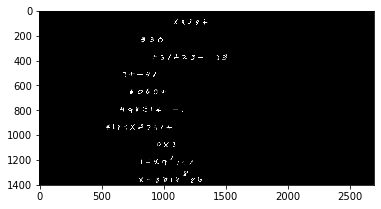

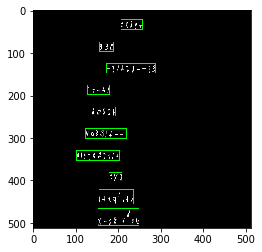

 76%|███████▌  | 380/500 [10:30<02:50,  1.42s/it]

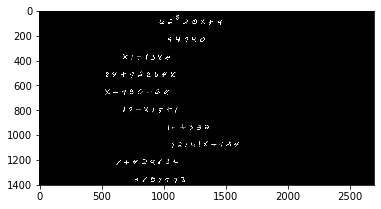

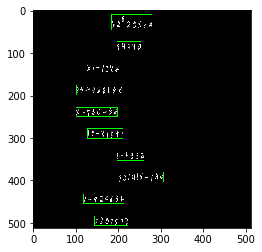

 76%|███████▌  | 381/500 [10:31<02:47,  1.40s/it]

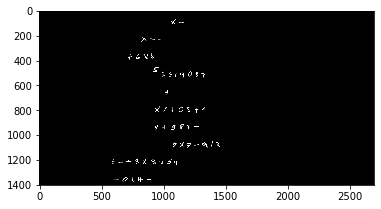

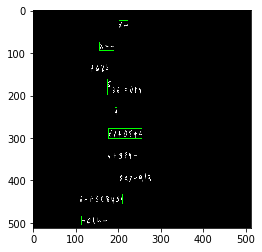

 76%|███████▋  | 382/500 [10:33<02:40,  1.36s/it]

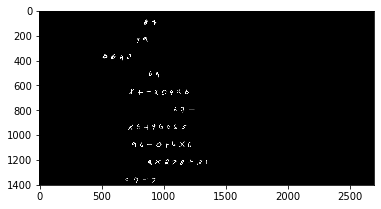

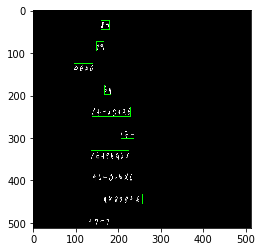

 77%|███████▋  | 383/500 [10:34<02:36,  1.34s/it]

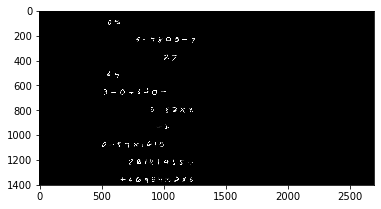

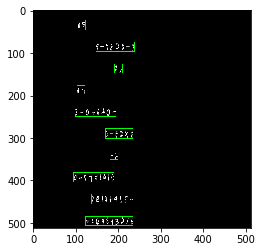

 77%|███████▋  | 384/500 [10:35<02:34,  1.33s/it]

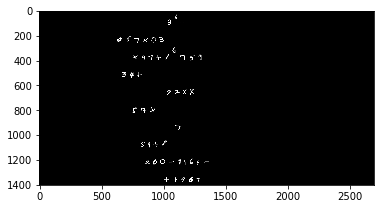

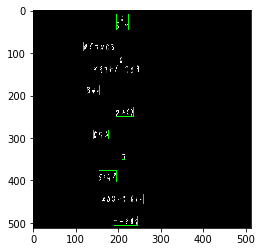

 77%|███████▋  | 385/500 [10:36<02:29,  1.30s/it]

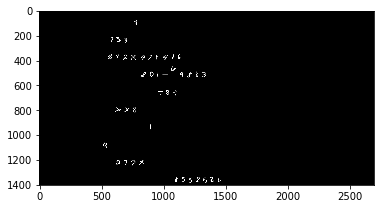

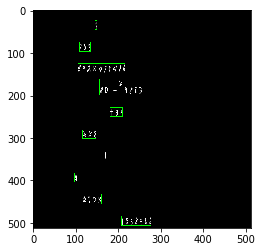

 77%|███████▋  | 386/500 [10:38<02:28,  1.30s/it]

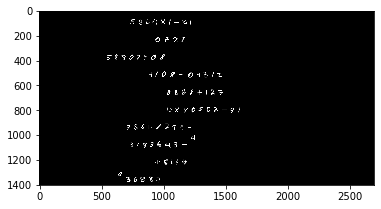

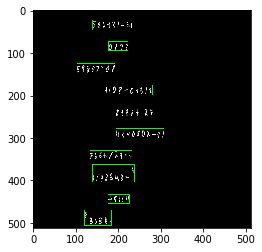

 77%|███████▋  | 387/500 [10:39<02:34,  1.37s/it]

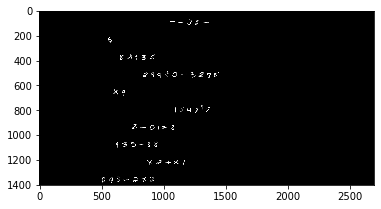

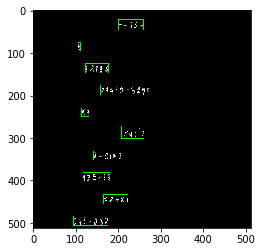

 78%|███████▊  | 388/500 [10:41<02:32,  1.37s/it]

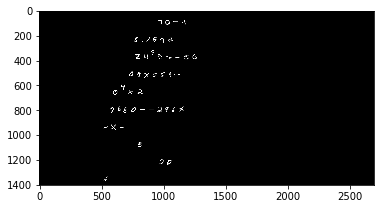

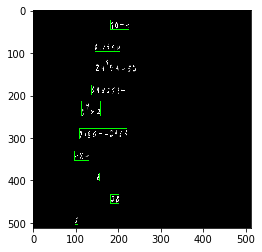

 78%|███████▊  | 389/500 [10:42<02:29,  1.35s/it]

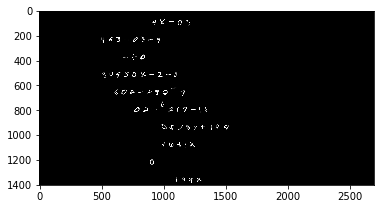

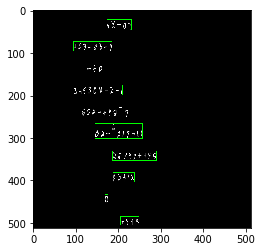

 78%|███████▊  | 390/500 [10:43<02:23,  1.31s/it]

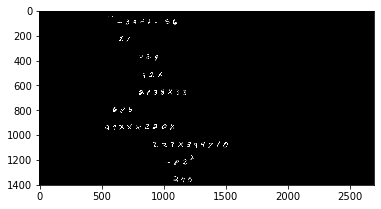

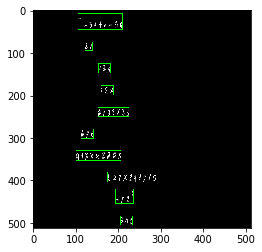

 78%|███████▊  | 391/500 [10:44<02:25,  1.33s/it]

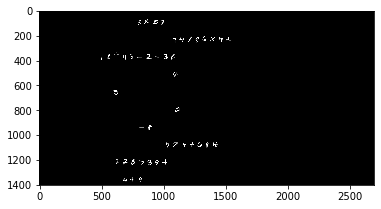

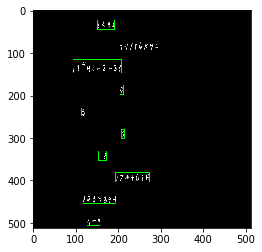

 78%|███████▊  | 392/500 [10:46<02:22,  1.32s/it]

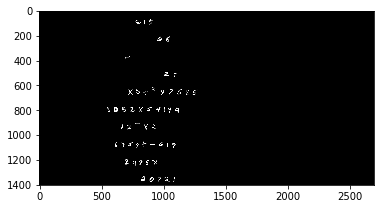

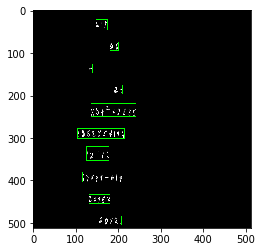

 79%|███████▊  | 393/500 [10:47<02:21,  1.32s/it]

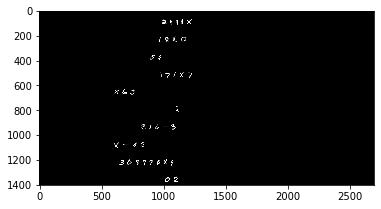

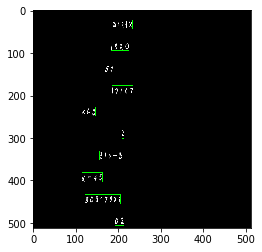

 79%|███████▉  | 394/500 [10:48<02:22,  1.34s/it]

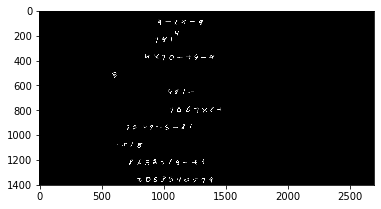

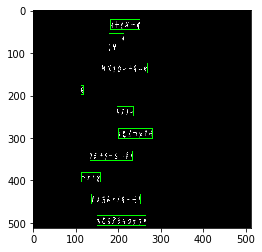

 79%|███████▉  | 395/500 [10:50<02:15,  1.29s/it]

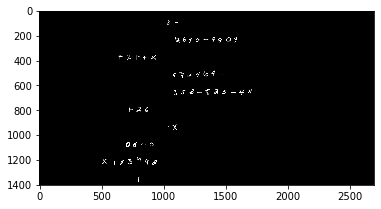

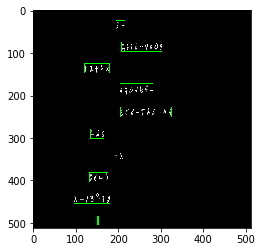

 79%|███████▉  | 396/500 [10:51<02:18,  1.34s/it]

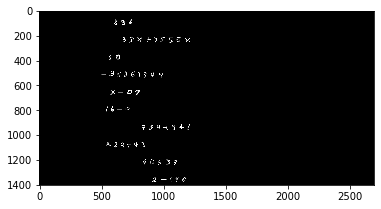

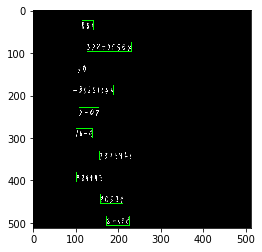

 79%|███████▉  | 397/500 [10:52<02:19,  1.36s/it]

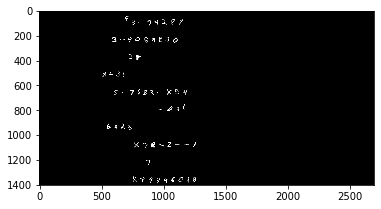

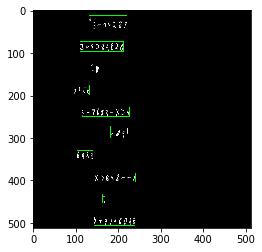

 80%|███████▉  | 398/500 [10:54<02:17,  1.34s/it]

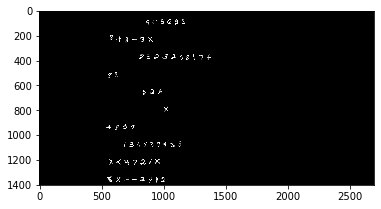

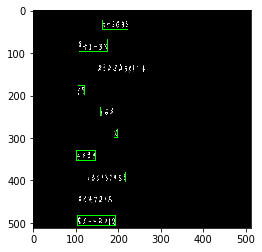

 80%|███████▉  | 399/500 [10:55<02:15,  1.34s/it]

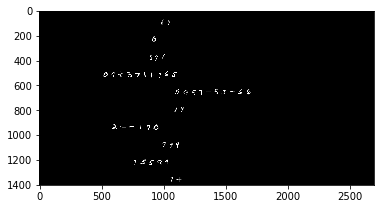

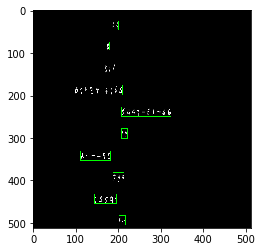

 80%|████████  | 400/500 [10:57<02:25,  1.45s/it]

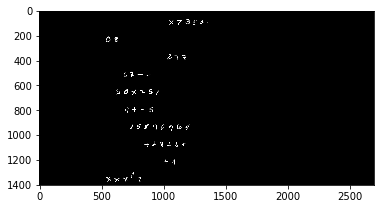

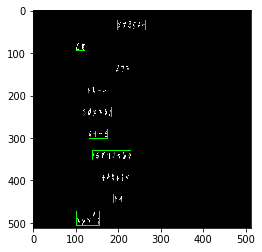

 80%|████████  | 401/500 [10:59<02:29,  1.51s/it]

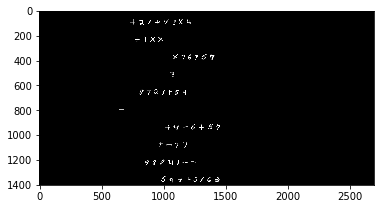

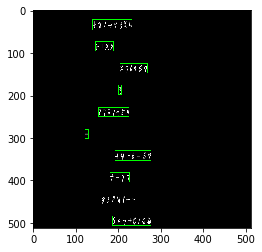

 80%|████████  | 402/500 [11:00<02:29,  1.53s/it]

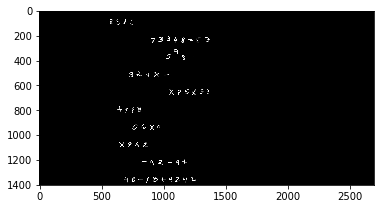

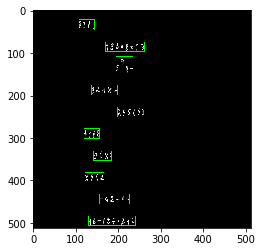

 81%|████████  | 403/500 [11:01<02:23,  1.48s/it]

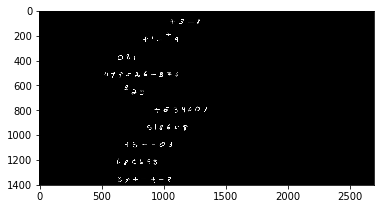

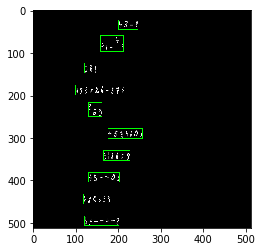

 81%|████████  | 404/500 [11:03<02:23,  1.50s/it]

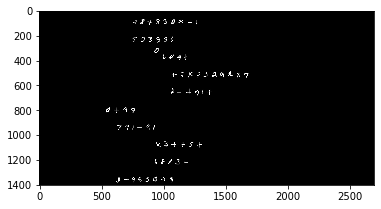

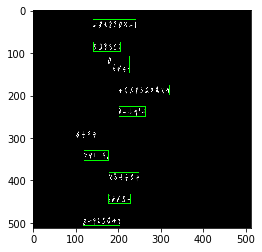

 81%|████████  | 405/500 [11:04<02:15,  1.42s/it]

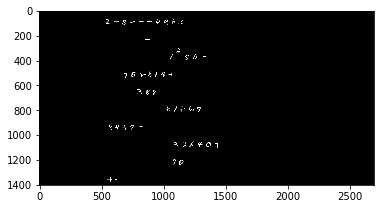

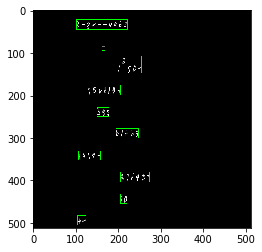

 81%|████████  | 406/500 [11:06<02:10,  1.39s/it]

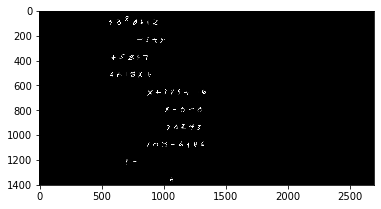

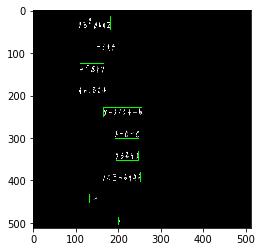

 81%|████████▏ | 407/500 [11:07<02:10,  1.40s/it]

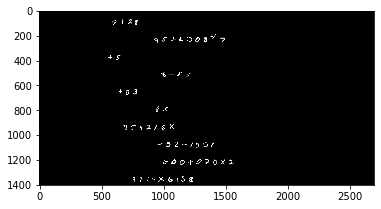

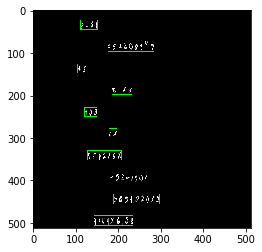

 82%|████████▏ | 408/500 [11:08<02:05,  1.37s/it]

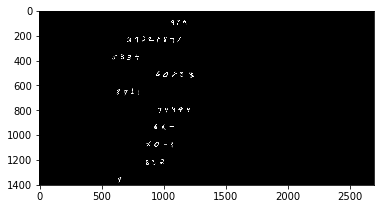

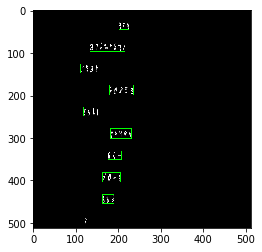

 82%|████████▏ | 409/500 [11:10<02:02,  1.34s/it]

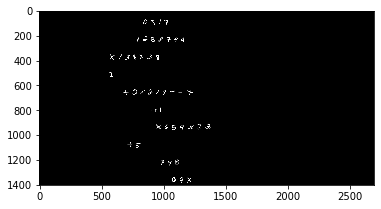

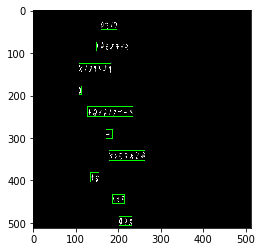

 82%|████████▏ | 410/500 [11:11<02:05,  1.39s/it]

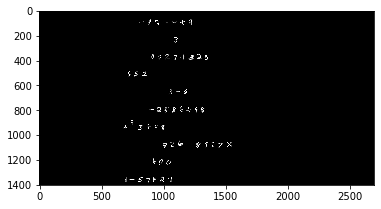

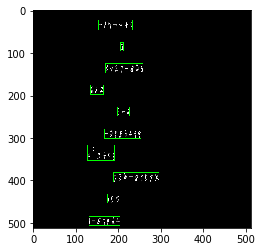

 82%|████████▏ | 411/500 [11:13<02:07,  1.43s/it]

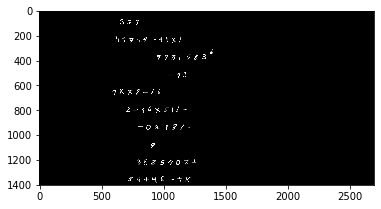

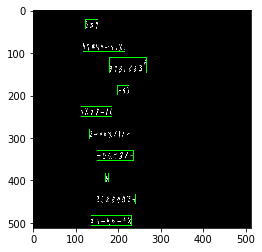

 82%|████████▏ | 412/500 [11:14<02:03,  1.41s/it]

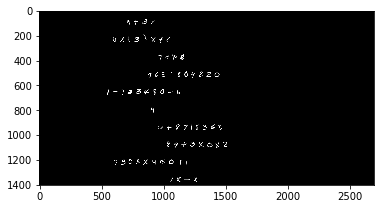

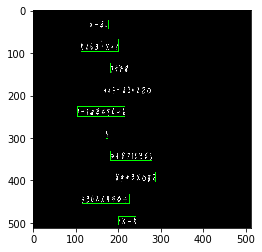

 83%|████████▎ | 413/500 [11:15<01:58,  1.36s/it]

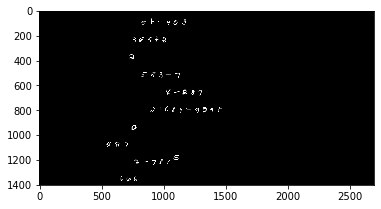

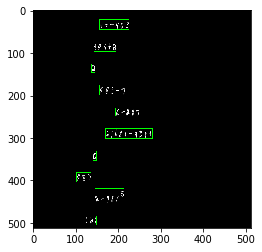

 83%|████████▎ | 414/500 [11:17<01:58,  1.38s/it]

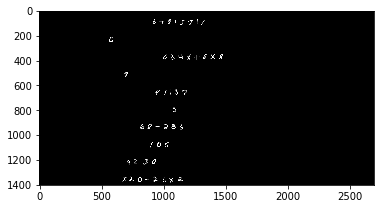

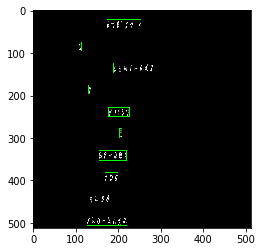

 83%|████████▎ | 415/500 [11:18<01:56,  1.36s/it]

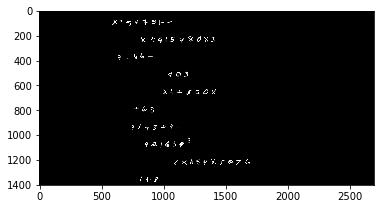

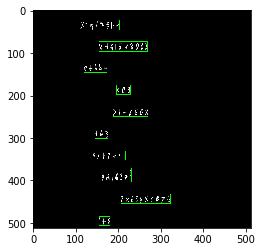

 83%|████████▎ | 416/500 [11:19<01:52,  1.34s/it]

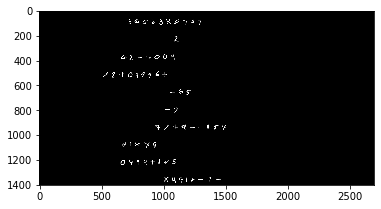

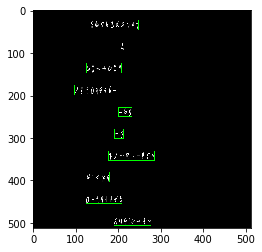

 83%|████████▎ | 417/500 [11:21<01:52,  1.35s/it]

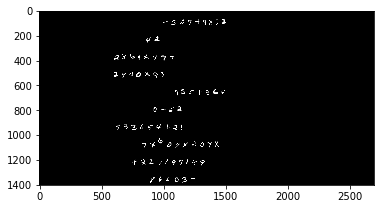

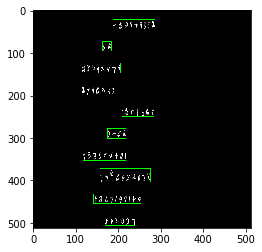

 84%|████████▎ | 418/500 [11:22<01:52,  1.38s/it]

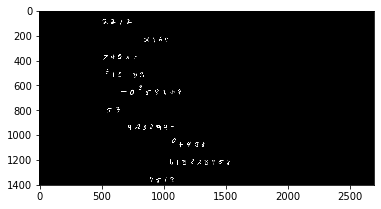

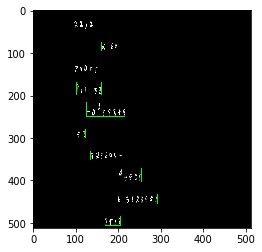

 84%|████████▍ | 419/500 [11:23<01:52,  1.39s/it]

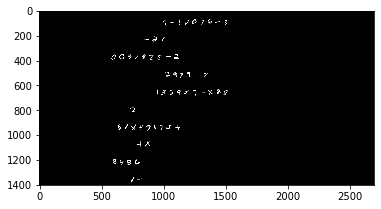

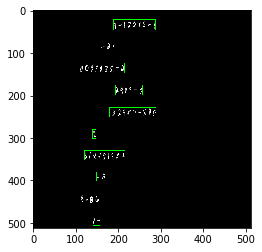

 84%|████████▍ | 420/500 [11:25<01:50,  1.38s/it]

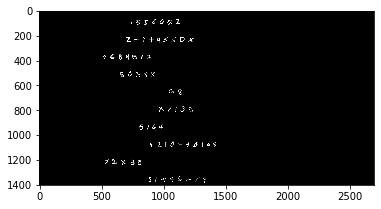

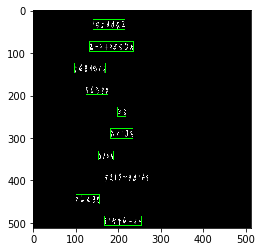

 84%|████████▍ | 421/500 [11:26<01:49,  1.39s/it]

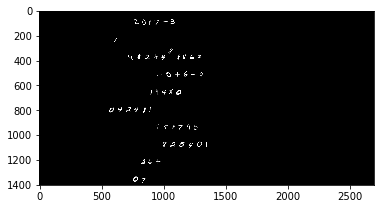

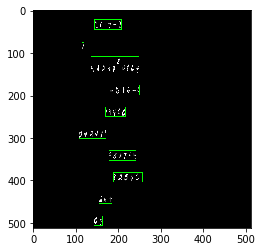

 84%|████████▍ | 422/500 [11:27<01:45,  1.35s/it]

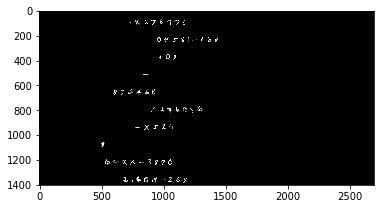

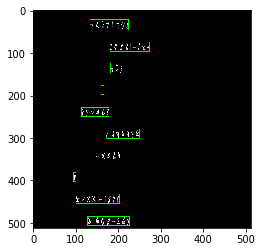

 85%|████████▍ | 423/500 [11:29<01:43,  1.34s/it]

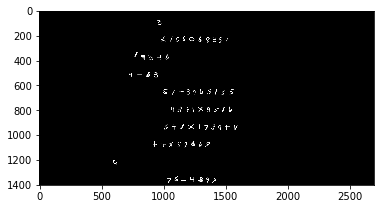

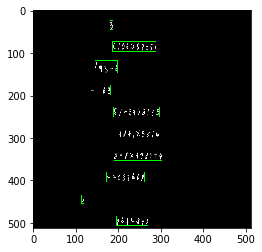

 85%|████████▍ | 424/500 [11:30<01:43,  1.36s/it]

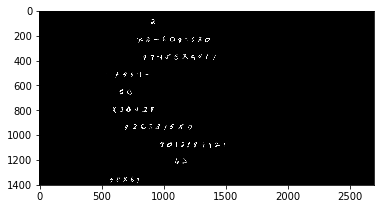

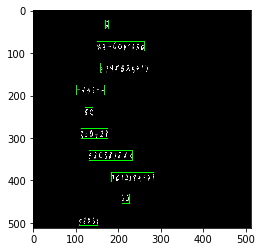

 85%|████████▌ | 425/500 [11:32<01:43,  1.38s/it]

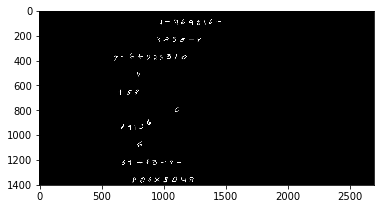

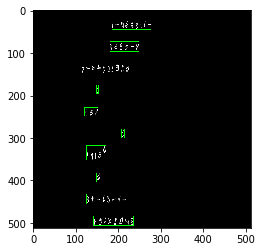

 85%|████████▌ | 426/500 [11:33<01:44,  1.41s/it]

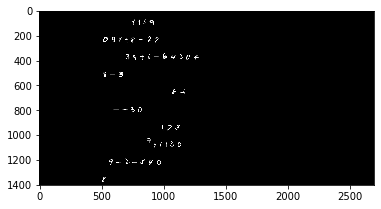

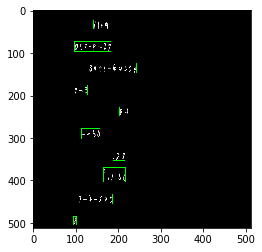

 85%|████████▌ | 427/500 [11:35<01:43,  1.41s/it]

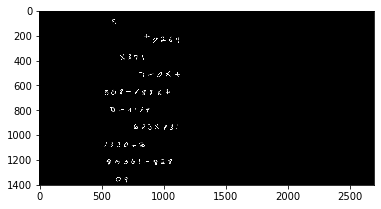

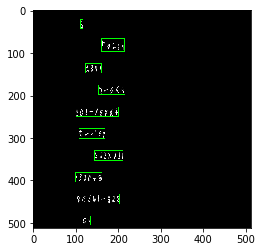

 86%|████████▌ | 428/500 [11:36<01:38,  1.37s/it]

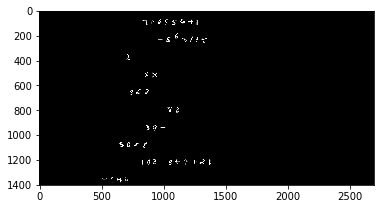

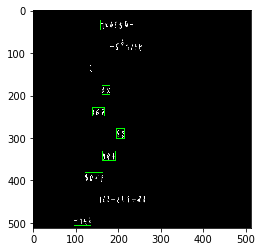

 86%|████████▌ | 429/500 [11:37<01:35,  1.34s/it]

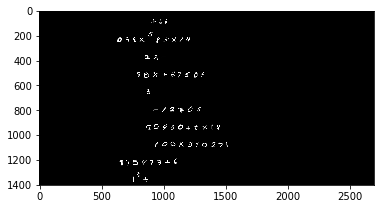

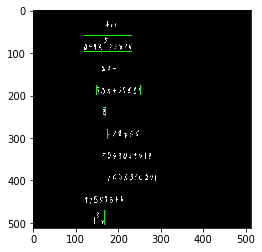

 86%|████████▌ | 430/500 [11:39<01:48,  1.56s/it]

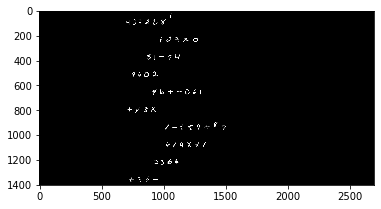

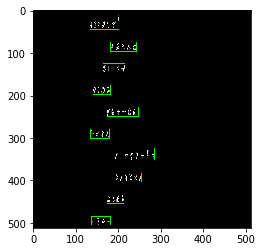

 86%|████████▌ | 431/500 [11:40<01:42,  1.49s/it]

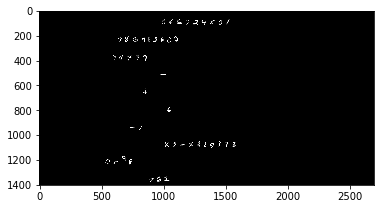

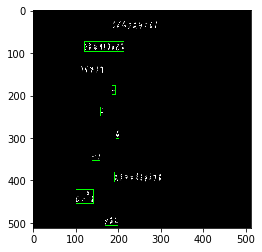

 86%|████████▋ | 432/500 [11:42<01:39,  1.46s/it]

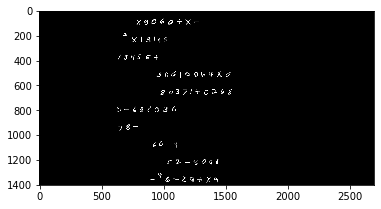

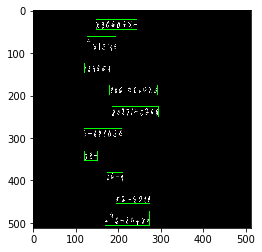

 87%|████████▋ | 433/500 [11:43<01:38,  1.47s/it]

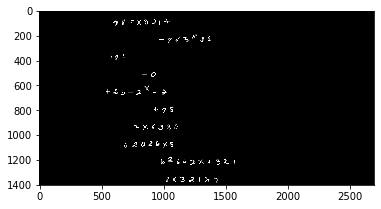

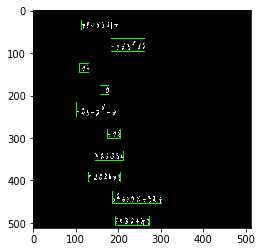

 87%|████████▋ | 434/500 [11:45<01:38,  1.49s/it]

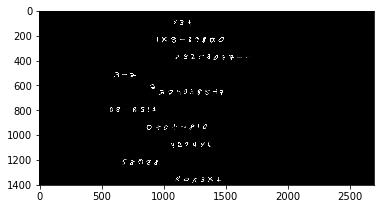

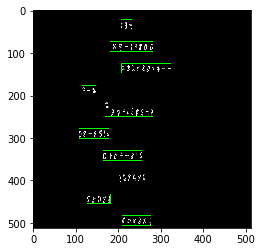

 87%|████████▋ | 435/500 [11:46<01:33,  1.44s/it]

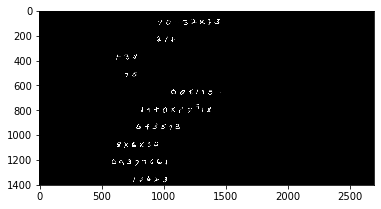

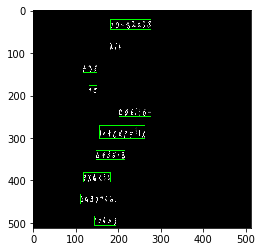

 87%|████████▋ | 436/500 [11:47<01:27,  1.37s/it]

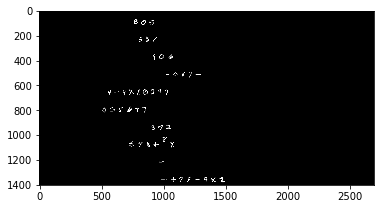

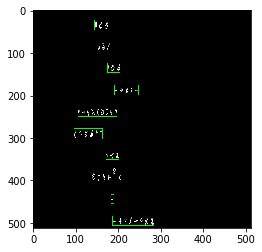

 87%|████████▋ | 437/500 [11:49<01:25,  1.36s/it]

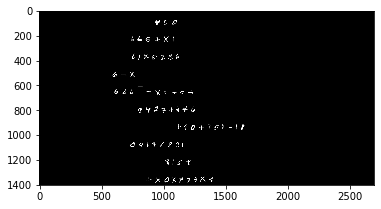

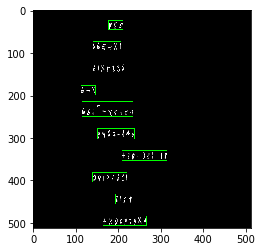

 88%|████████▊ | 438/500 [11:50<01:22,  1.33s/it]

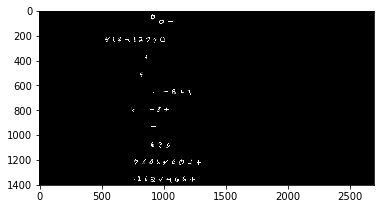

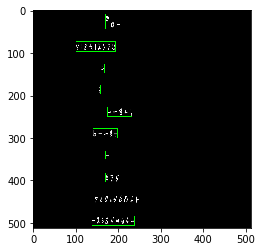

 88%|████████▊ | 439/500 [11:51<01:19,  1.30s/it]

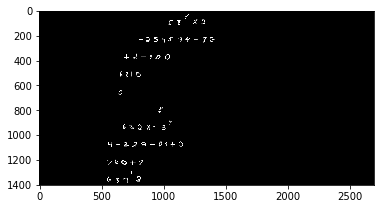

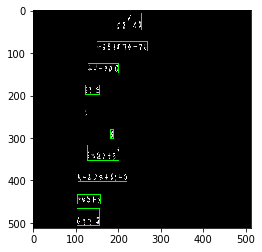

 88%|████████▊ | 440/500 [11:53<01:20,  1.34s/it]

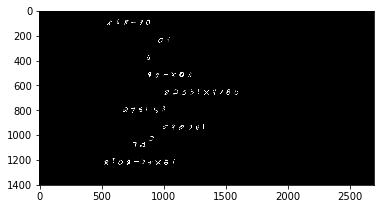

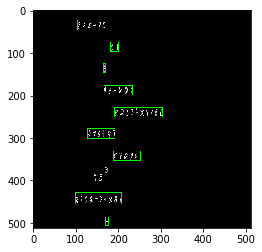

 88%|████████▊ | 441/500 [11:54<01:18,  1.33s/it]

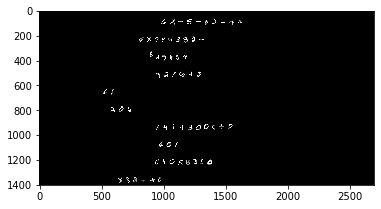

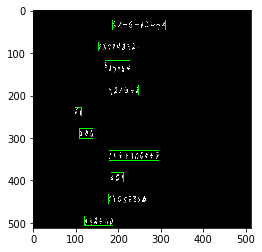

 88%|████████▊ | 442/500 [11:55<01:16,  1.32s/it]

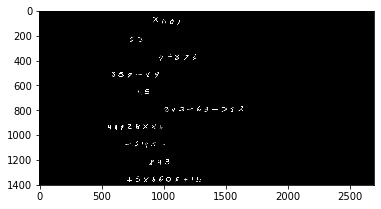

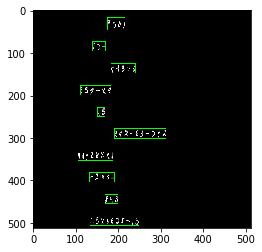

 89%|████████▊ | 443/500 [11:57<01:17,  1.36s/it]

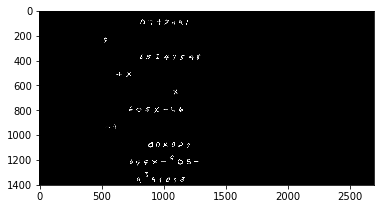

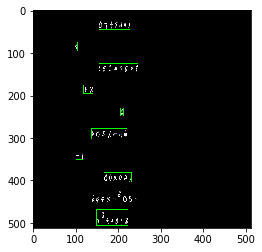

 89%|████████▉ | 444/500 [11:58<01:14,  1.33s/it]

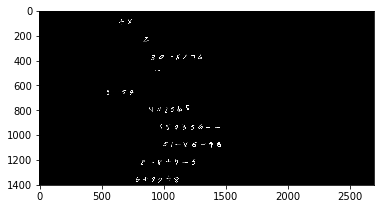

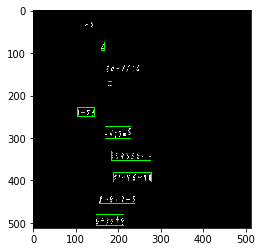

 89%|████████▉ | 445/500 [12:00<01:20,  1.47s/it]

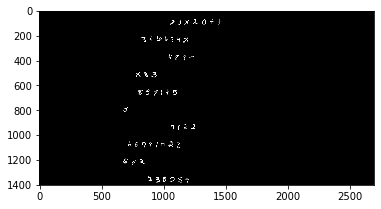

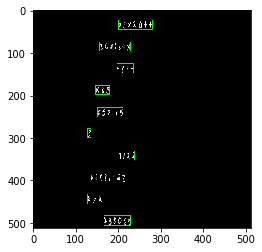

 89%|████████▉ | 446/500 [12:01<01:21,  1.51s/it]

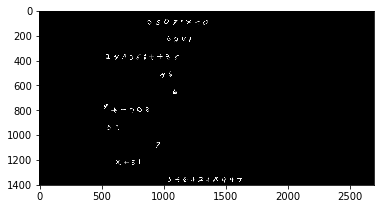

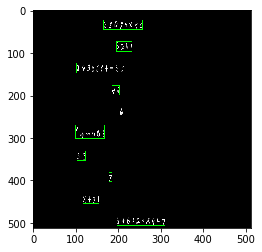

 89%|████████▉ | 447/500 [12:03<01:17,  1.46s/it]

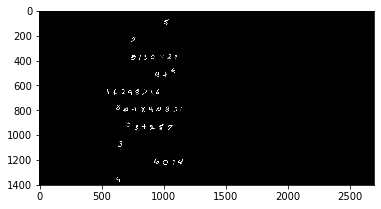

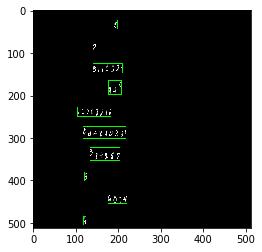

 90%|████████▉ | 448/500 [12:04<01:13,  1.41s/it]

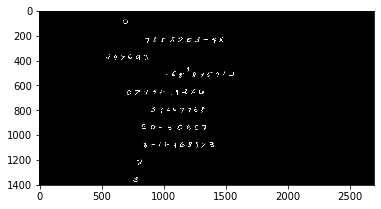

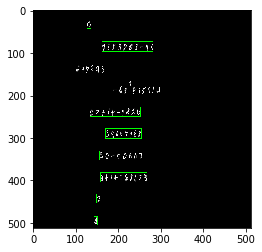

 90%|████████▉ | 449/500 [12:05<01:12,  1.43s/it]

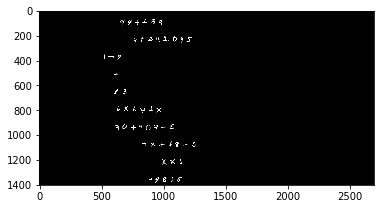

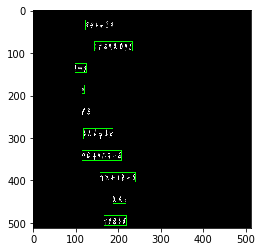

 90%|█████████ | 450/500 [12:07<01:09,  1.38s/it]

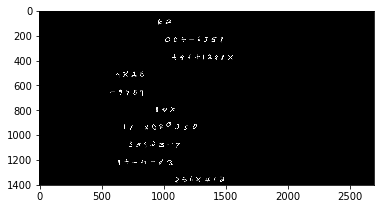

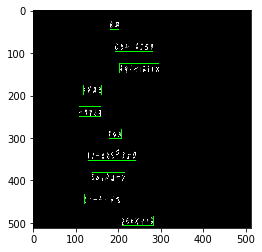

 90%|█████████ | 451/500 [12:08<01:05,  1.35s/it]

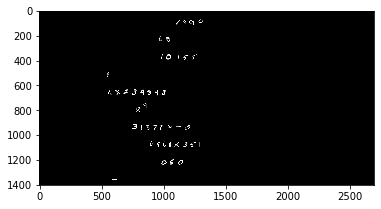

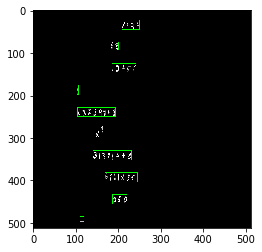

 90%|█████████ | 452/500 [12:09<01:04,  1.35s/it]

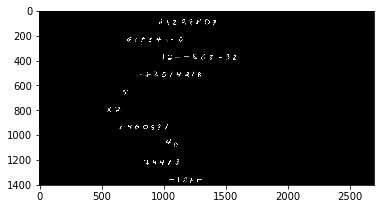

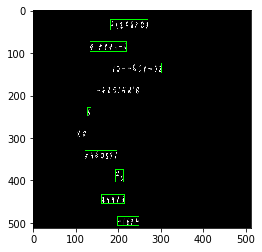

 91%|█████████ | 453/500 [12:11<01:13,  1.56s/it]

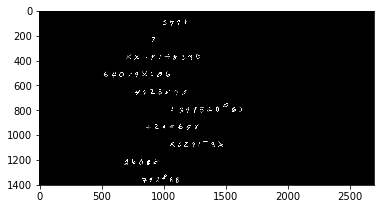

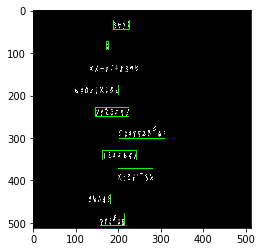

 91%|█████████ | 454/500 [12:13<01:09,  1.51s/it]

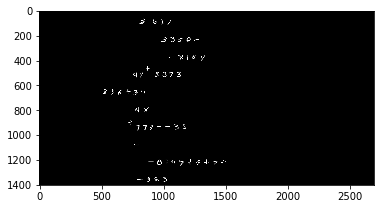

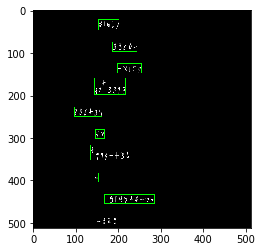

 91%|█████████ | 455/500 [12:14<01:07,  1.50s/it]

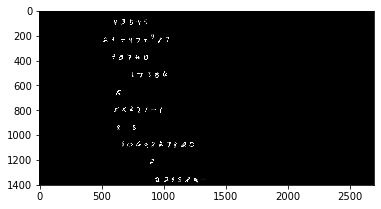

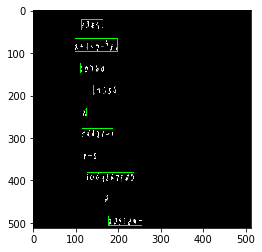

 91%|█████████ | 456/500 [12:16<01:06,  1.50s/it]

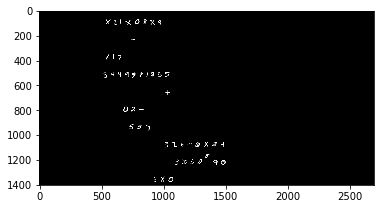

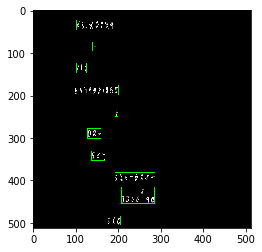

 91%|█████████▏| 457/500 [12:17<01:02,  1.46s/it]

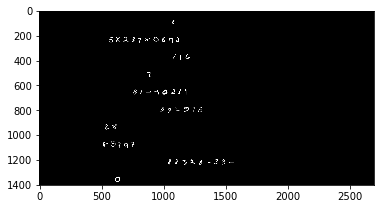

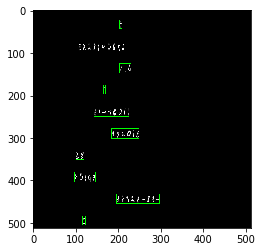

 92%|█████████▏| 458/500 [12:19<01:00,  1.45s/it]

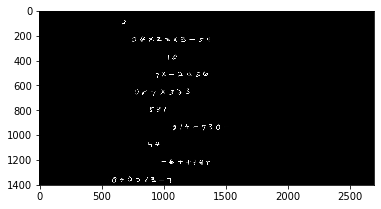

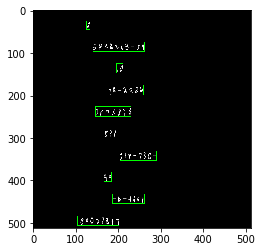

 92%|█████████▏| 459/500 [12:20<00:58,  1.44s/it]

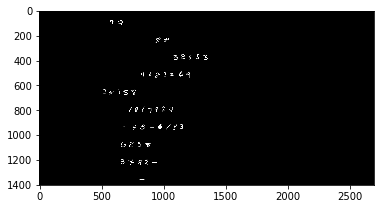

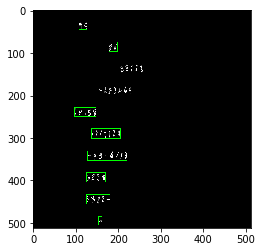

 92%|█████████▏| 460/500 [12:21<00:56,  1.40s/it]

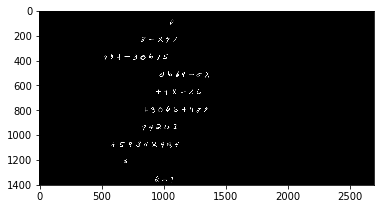

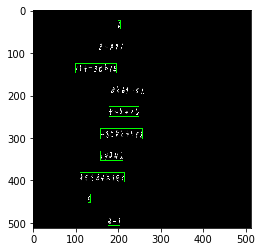

 92%|█████████▏| 461/500 [12:24<01:08,  1.74s/it]

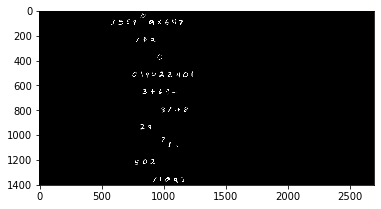

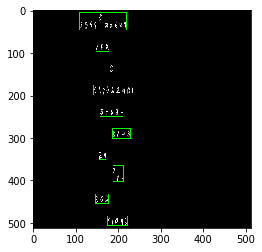

 92%|█████████▏| 462/500 [12:25<01:01,  1.61s/it]

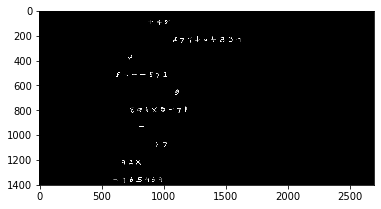

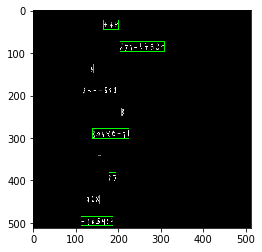

 93%|█████████▎| 463/500 [12:27<00:57,  1.56s/it]

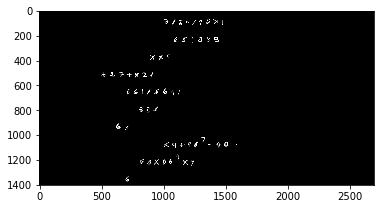

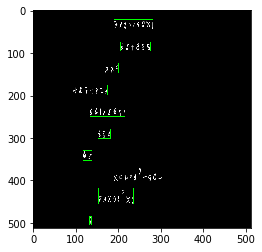

 93%|█████████▎| 464/500 [12:28<00:57,  1.59s/it]

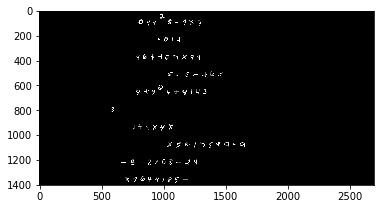

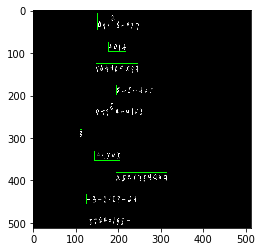

 93%|█████████▎| 465/500 [12:30<00:54,  1.57s/it]

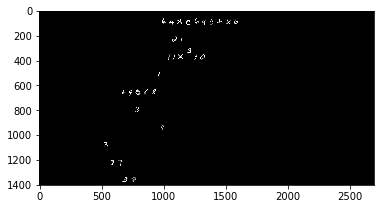

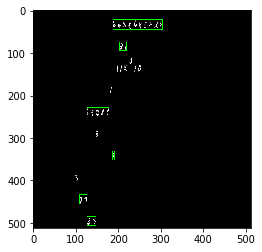

 93%|█████████▎| 466/500 [12:31<00:50,  1.49s/it]

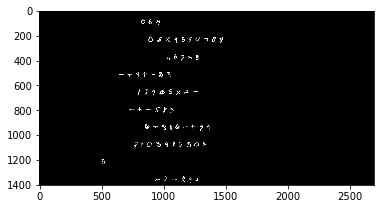

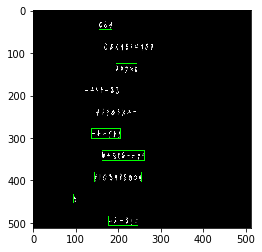

 93%|█████████▎| 467/500 [12:33<00:48,  1.48s/it]

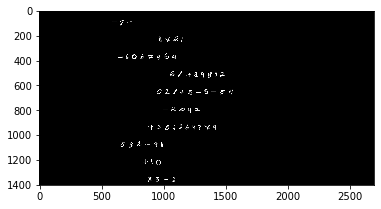

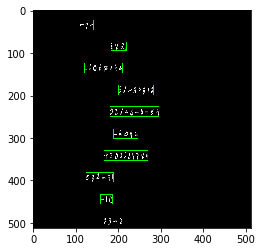

 94%|█████████▎| 468/500 [12:34<00:46,  1.45s/it]

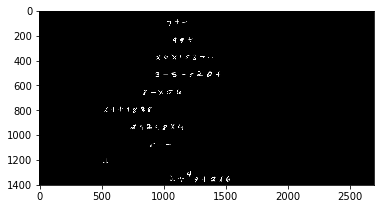

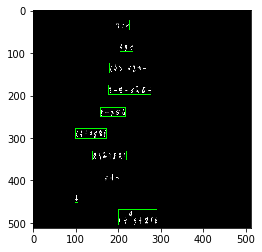

 94%|█████████▍| 469/500 [12:36<00:47,  1.53s/it]

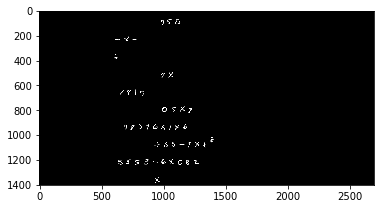

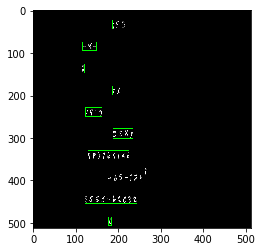

 94%|█████████▍| 470/500 [12:37<00:44,  1.48s/it]

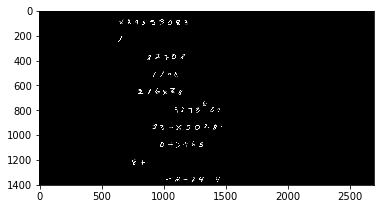

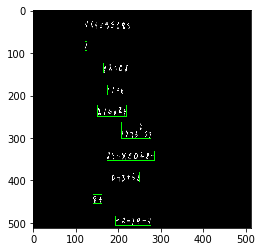

 94%|█████████▍| 471/500 [12:38<00:42,  1.48s/it]

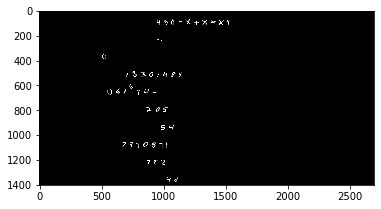

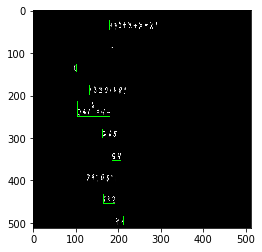

 94%|█████████▍| 472/500 [12:40<00:41,  1.49s/it]

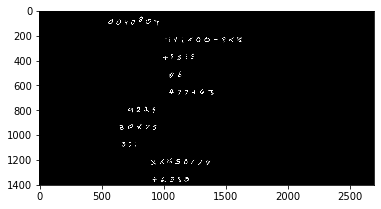

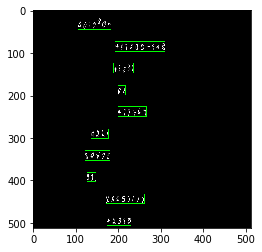

 95%|█████████▍| 473/500 [12:41<00:38,  1.44s/it]

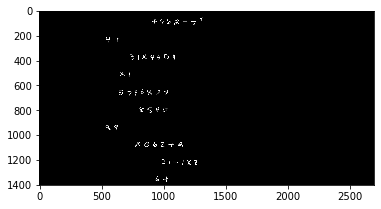

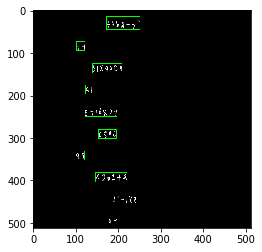

 95%|█████████▍| 474/500 [12:43<00:36,  1.41s/it]

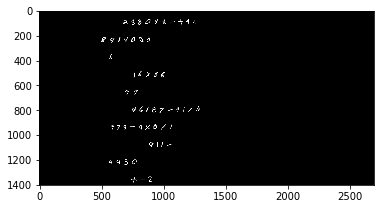

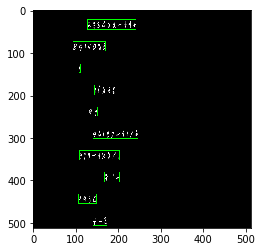

 95%|█████████▌| 475/500 [12:44<00:34,  1.37s/it]

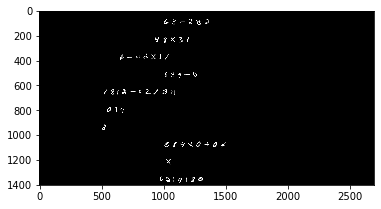

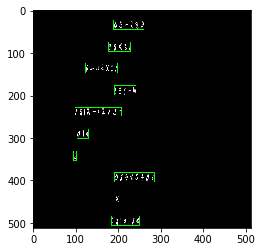

 95%|█████████▌| 476/500 [12:45<00:33,  1.41s/it]

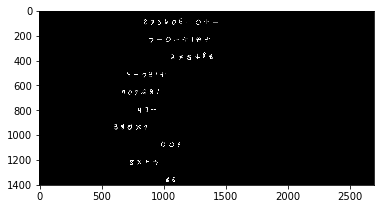

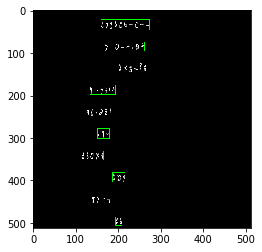

 95%|█████████▌| 477/500 [12:47<00:32,  1.39s/it]

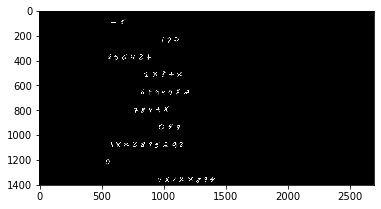

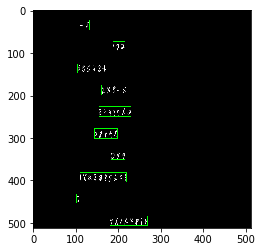

 96%|█████████▌| 478/500 [12:48<00:31,  1.43s/it]

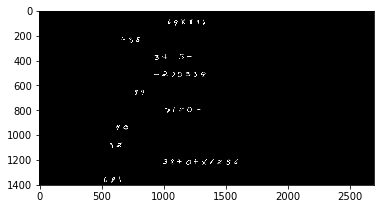

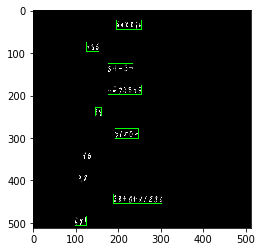

 96%|█████████▌| 479/500 [12:50<00:29,  1.40s/it]

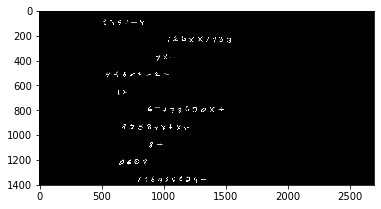

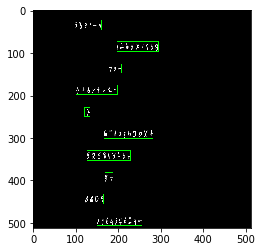

 96%|█████████▌| 480/500 [12:51<00:29,  1.45s/it]

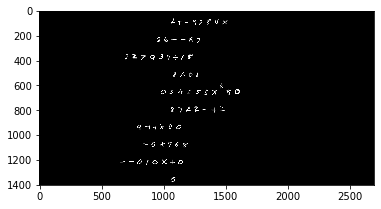

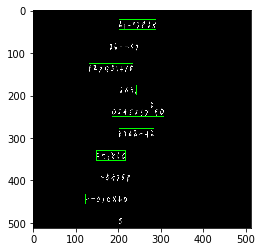

 96%|█████████▌| 481/500 [12:53<00:27,  1.46s/it]

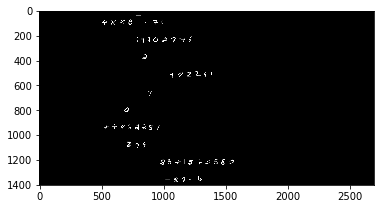

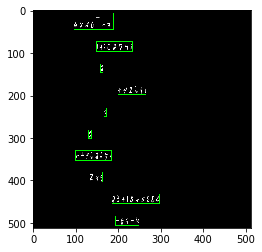

 96%|█████████▋| 482/500 [12:54<00:26,  1.48s/it]

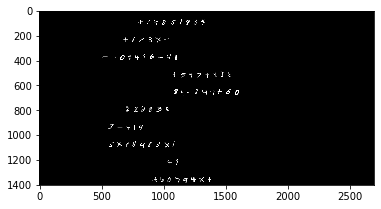

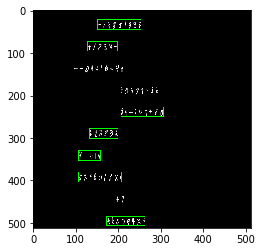

 97%|█████████▋| 483/500 [12:56<00:25,  1.52s/it]

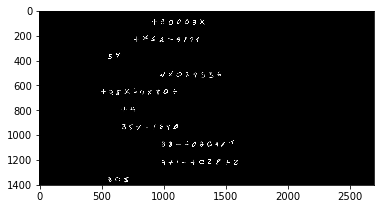

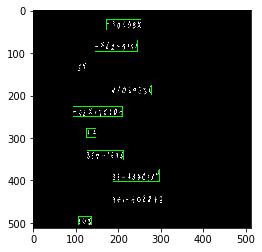

 97%|█████████▋| 484/500 [12:57<00:23,  1.48s/it]

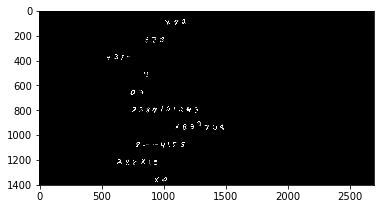

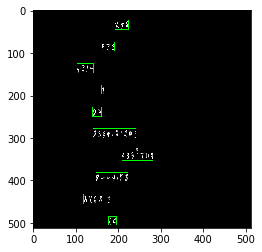

 97%|█████████▋| 485/500 [12:59<00:21,  1.46s/it]

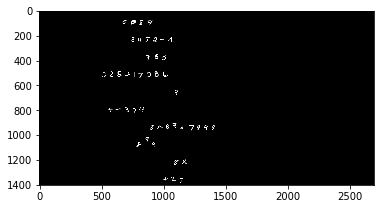

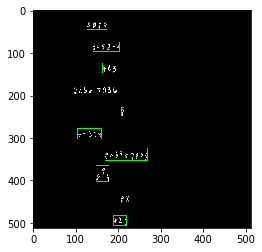

 97%|█████████▋| 486/500 [13:00<00:19,  1.39s/it]

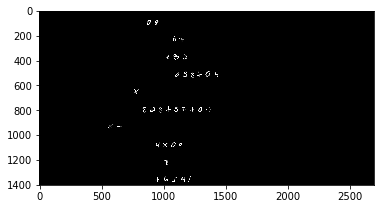

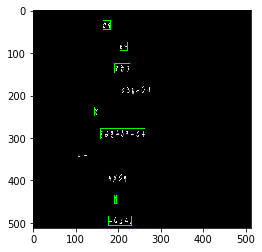

 97%|█████████▋| 487/500 [13:01<00:17,  1.38s/it]

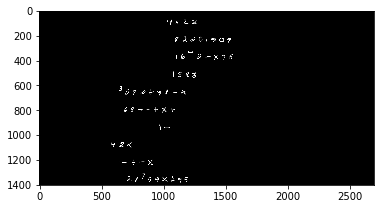

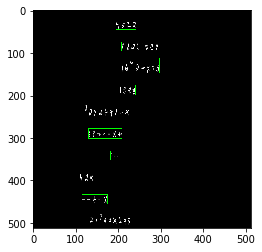

 98%|█████████▊| 488/500 [13:02<00:16,  1.35s/it]

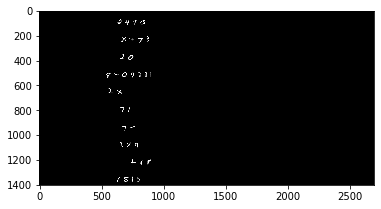

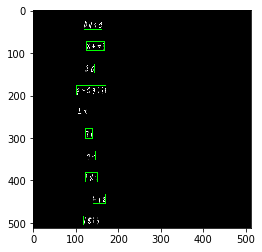

 98%|█████████▊| 489/500 [13:04<00:15,  1.41s/it]

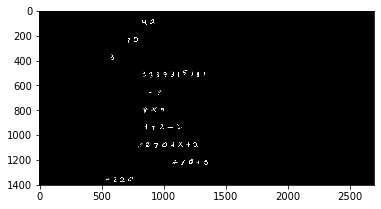

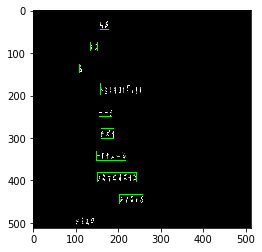

 98%|█████████▊| 490/500 [13:06<00:14,  1.43s/it]

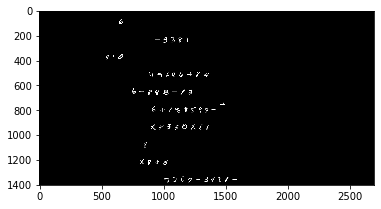

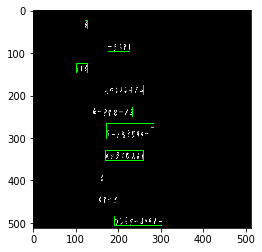

 98%|█████████▊| 491/500 [13:07<00:12,  1.41s/it]

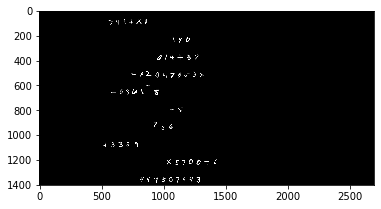

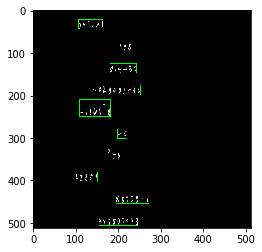

 98%|█████████▊| 492/500 [13:08<00:11,  1.42s/it]

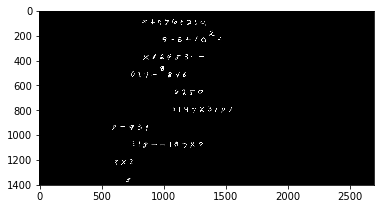

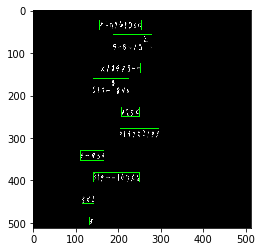

 99%|█████████▊| 493/500 [13:10<00:09,  1.39s/it]

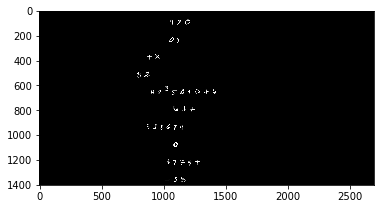

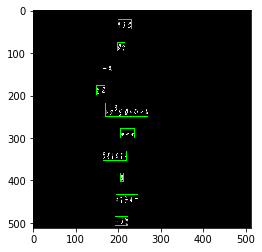

 99%|█████████▉| 494/500 [13:11<00:08,  1.46s/it]

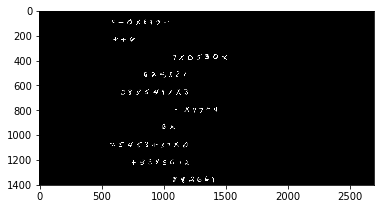

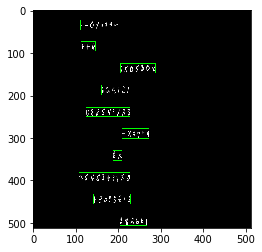

 99%|█████████▉| 495/500 [13:13<00:07,  1.55s/it]

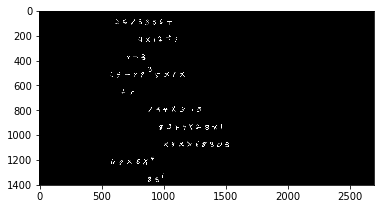

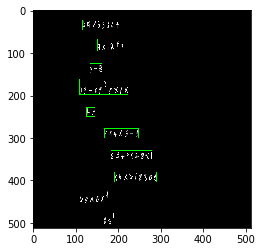

 99%|█████████▉| 496/500 [13:14<00:05,  1.48s/it]

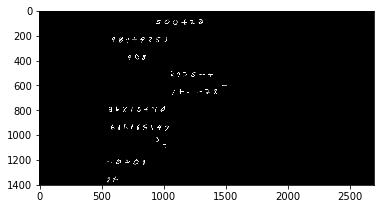

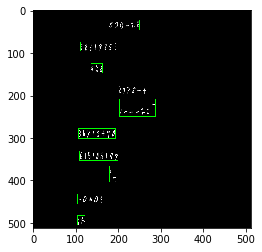

 99%|█████████▉| 497/500 [13:16<00:04,  1.44s/it]

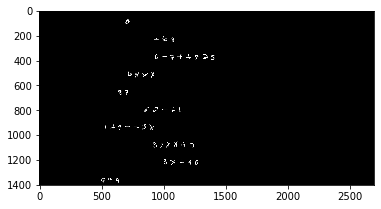

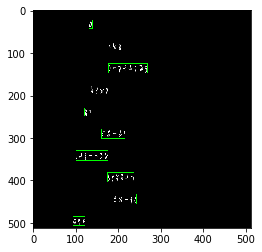

100%|█████████▉| 498/500 [13:17<00:02,  1.45s/it]

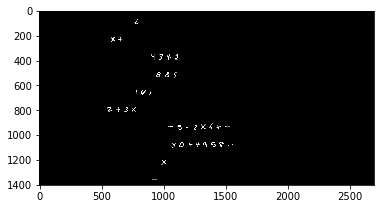

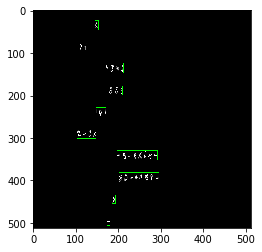

100%|█████████▉| 499/500 [13:18<00:01,  1.40s/it]

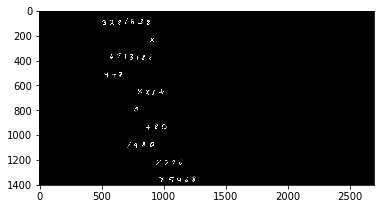

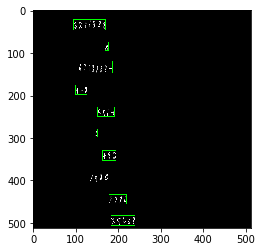

100%|██████████| 500/500 [13:20<00:00,  1.48s/it]


In [17]:
X_final = []
Y_final = []
grid_h = 16
grid_w = 16
img_w = 512
img_h = 512

for z in tqdm.tqdm(range(len(train_image_paths))):
    
    new_file = train_image_paths[z]
    #print(new_file)
    x = cv2.imread(train_image_paths[z])
    x_sl = 512/x.shape[1]
    y_sl = 512/x.shape[0]
    
    img = cv2.resize(x,(512,512))
    
    
    X_final.append(img)
    
    plt.imshow(cv2.imread(new_file))
    plt.show()
    
    i = " "
    
    if 'img' in new_file:
        i = ", "
    
    Y = np.zeros((grid_h,grid_w,1,5))
    
    file1 = train_gt_path[z]
    name = pd.read_csv(file1,sep=" ",header=None)

    for li in range(0,name.shape[0]):
        temp_list = []
        file_data = name.iloc[li]
        # print(li)
        bb = list(file_data[1:])
        # print(bb)
        xmin = int(bb[0])*x_sl
        xmax = int(bb[2])*x_sl
        ymin = int(bb[1])*y_sl
        ymax = int(bb[3])*y_sl
        
        te = cv2.rectangle(img,(int(xmin),int(ymin)),(int(xmax),int(ymax)) , color = (0,255,0))
        
        w = (xmax - xmin)/img_w
        h = (ymax - ymin)/img_h
        
        x = ((xmax + xmin)/2)/img_w
        y = ((ymax + ymin)/2)/img_h
        x = x * grid_w
        y = y * grid_h
        
        Y[int(y),int(x),0,0] = 1
        Y[int(y),int(x),0,1] = x - int(x)
        Y[int(y),int(x),0,2] = y - int(y)
        Y[int(y),int(x),0,3] = w
        Y[int(y),int(x),0,4] = h
    plt.imshow(te)
    plt.show()
    
    Y_final.append(Y)

In [0]:
X = np.array(X_final)
X_final = []
Y = np.array(Y_final)
Y_final = []

X = (X - 127.5)/127.5

np.save('X.npy',X)
np.save('Y.npy',Y)


In [0]:
X_train , X_val , Y_train , Y_val  = train_test_split(X,Y,train_size = 0.75 , shuffle = True)
X = []
Y = []

## Model Building

In [0]:
#define model
# input : 512,512,3
# output : 16,16,1,5

def save_model(model):
    model_json = model.to_json()
    with open("model1/text_detect_model.json", "w") as json_file:
        json_file.write(model_json)
        
def load_model(strr):        
    json_file = open(strr, 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    return loaded_model
      
def yolo_model(input_shape):
    
    
    inp = Input(input_shape)
   
    model = MobileNetV2( input_tensor= inp , include_top=False, weights='imagenet')
    last_layer = model.output
    
    conv = Conv2D(512,(3,3) , activation='relu' , padding='same')(last_layer)
    conv = Dropout(0.4)(conv)
    bn = BatchNormalization()(conv)
    lr = LeakyReLU(alpha=0.1)(bn)
    
    
    conv = Conv2D(128,(3,3) , activation='relu' , padding='same')(lr)
    conv = Dropout(0.4)(conv)
    bn = BatchNormalization()(conv)
    lr = LeakyReLU(alpha=0.1)(bn)
    
    
    conv = Conv2D(5,(3,3) , activation='relu' , padding='same')(lr)
    
    final = Reshape((grid_h,grid_w,classes,info))(conv)
    
    model = Model(inp,final)
    
    return model

In [0]:
#define utils

#optimizer
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)

In [0]:
#define loss function
def yolo_loss_func(y_true,y_pred):
    # y_true : 16,16,1,5
    # y_pred : 16,16,1,5
    l_coords = 5.0
    l_noob = 0.5
    coords = y_true[:,:,:,:,0] * l_coords
    noobs = (-1*(y_true[:,:,:,:,0] - 1)*l_noob)
    p_pred = y_pred[:,:,:,:,0]
    p_true = y_true[:,:,:,:,0]
    x_true = y_true[:,:,:,:,1]
    x_pred = y_pred[:,:,:,:,1]
    yy_true = y_true[:,:,:,:,2]
    yy_pred = y_pred[:,:,:,:,2]
    w_true = y_true[:,:,:,:,3]
    w_pred = y_pred[:,:,:,:,3]
    h_true = y_true[:,:,:,:,4]
    h_pred = y_pred[:,:,:,:,4]
    
    p_loss_absent = K.sum(K.square(p_pred - p_true)*noobs)
    p_loss_present = K.sum(K.square(p_pred - p_true))
    x_loss = K.sum(K.square(x_pred - x_true)*coords)
    yy_loss = K.sum(K.square(yy_pred - yy_true)*coords)
    xy_loss = x_loss + yy_loss
    w_loss = K.sum(K.square(K.sqrt(w_pred) - K.sqrt(w_true))*coords)
    h_loss = K.sum(K.square(K.sqrt(h_pred) - K.sqrt(h_true))*coords)
    wh_loss = w_loss + h_loss
    
    loss = p_loss_absent + p_loss_present + xy_loss + wh_loss
    
    return loss

In [0]:
#Variable Definition
img_w = 512
img_h = 512
channels = 3
classes = 1
info = 5
grid_w = 16
grid_h = 16
#load and save model
input_size = (img_h,img_w,channels)

model = yolo_model(input_size)

print(model.summary())


In [0]:
# model.weights

In [0]:
# model.load_weights('model1/text_detect.h5')

In [0]:
model.compile(loss=yolo_loss_func , optimizer=opt , metrics = ['accuracy']

In [0]:
hist = model.fit(X_train ,Y_train ,epochs= 30 ,batch_size = 4 , validation_data=(X_val,Y_val))

In [0]:
def predict_func(model , inp , iou , name):

    ans = model.predict(inp)
    p =0 
    #np.save('Results/ans.npy',ans)
    boxes = decode(ans[0] , img_w , img_h , iou)
    
    img = ((inp + 1)/2)
    img = img[0]
    #plt.imshow(img)
    #plt.show()


    for i in boxes:

        i = [int(x) for x in i]

        img = cv2.rectangle(img , (i[0] ,i[1]) , (i[2] , i[3]) , color = (0,255,0) , thickness = 2)
        
    plt.figure(figsize=(12,12))
    plt.imshow(img)
  
    plt.show()
    
    

## Prediction

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


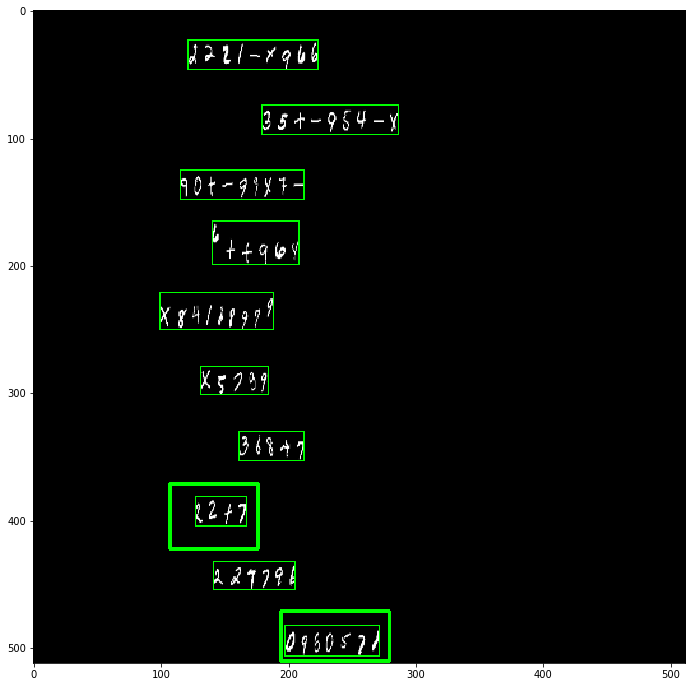

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


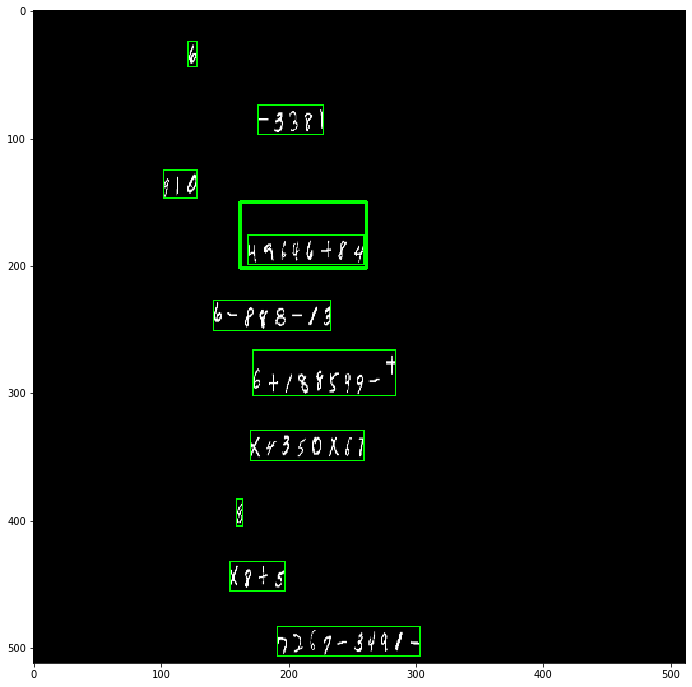

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


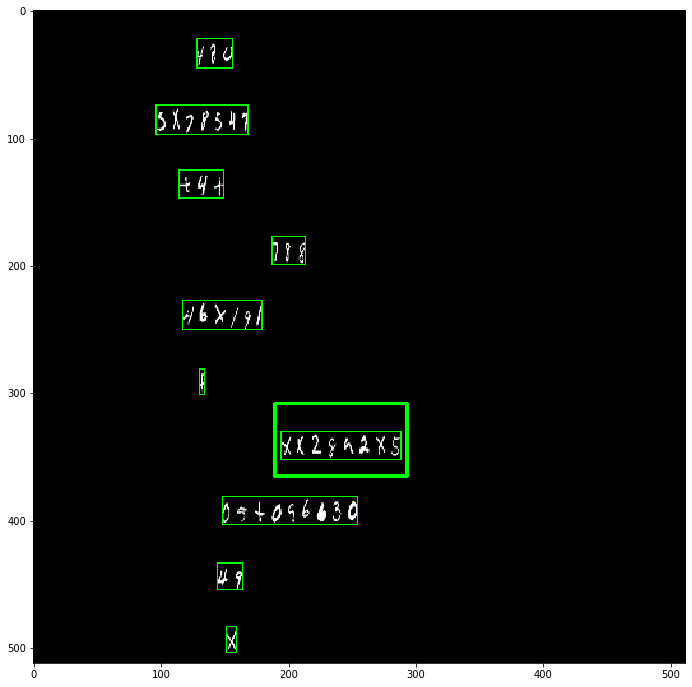

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


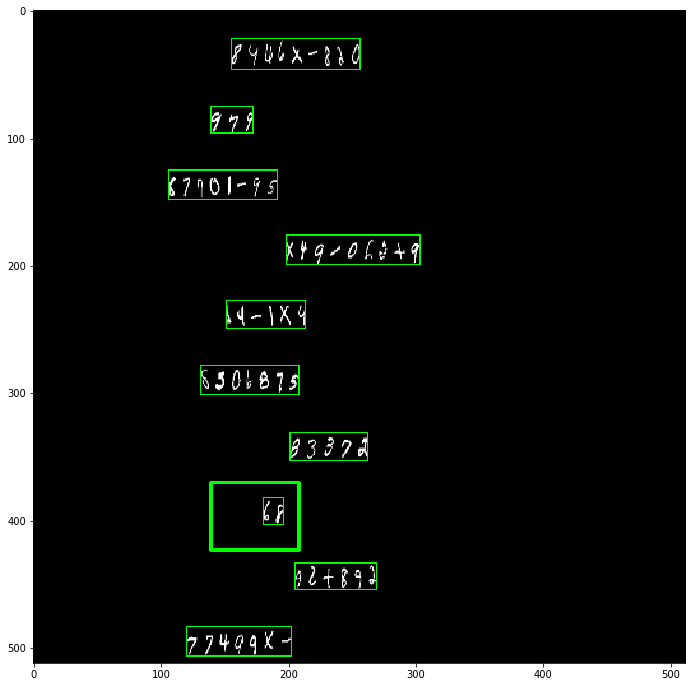

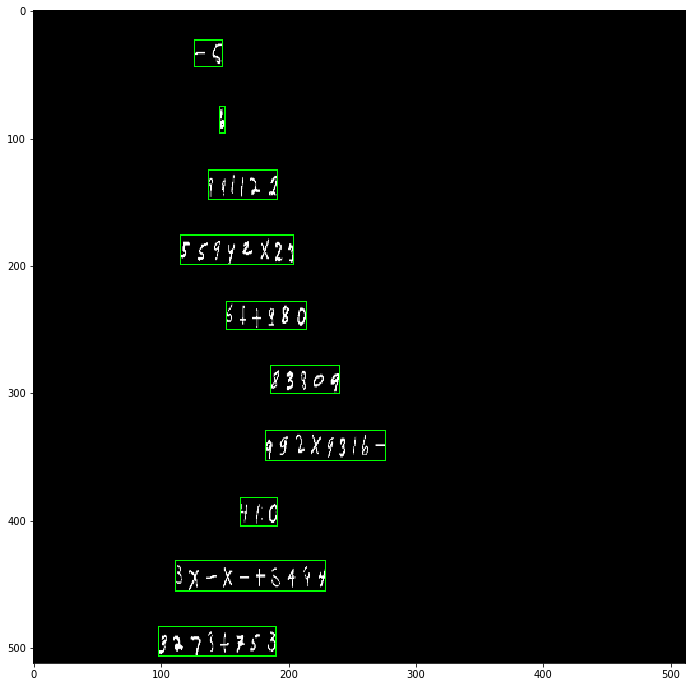

In [32]:
rand = np.random.randint(0,X_val.shape[0], size = 5)

for i in rand:
    
    predict_func(model , X_val[i:i+1] , 0.5, i)

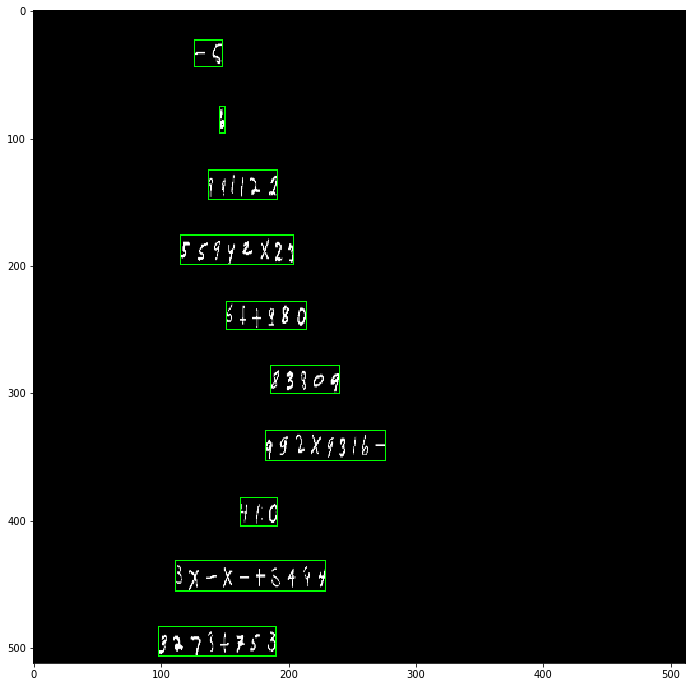

In [33]:
 predict_func(model , X_val[i:i+1] , 0.5, i)

In [35]:
X_val.shape

(125, 512, 512, 3)